In [ ]:
!pip install numpy pandas tensorflow captum numba spacy thinc eli5 tf-keras torch_xla SentenceTransformer

ERROR: Could not find a version that satisfies the requirement SentenceTransformer (from versions: none)
ERROR: No matching distribution found for SentenceTransformer


In [ ]:
import numpy as np
from math import *
import matplotlib.pyplot as plt
import pandas as pd
import os
from os.path import split
import re
from nltk import tokenize
import pickle

from tqdm import tqdm
import copy
import seaborn as sns

import spacy
from spacy.lang.en.stop_words import STOP_WORDS
import string
from spacy.lang.en import English

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from transformers import BertForSequenceClassification, BertTokenizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification

In [ ]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from torch.utils.data import Dataset, DataLoader
from typing import Iterator, List, Callable, Tuple
from transformers import Trainer, TrainingArguments

from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

# Load ML Pkgs
# ML Packages
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

from sklearn.base import TransformerMixin
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
# import eli5
# from eli5.lime import TextExplainer

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sentence_transformers import SentenceTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import MinMaxScaler  # because NB needs non-negative inputs

In [ ]:
nlp = spacy.load('en_core_web_sm')

# Use the punctuations of string module
punctuations = string.punctuation

# Creating a Spacy Parser
parser = English()

# Build a list of stopwords to use to filter
stopwords = list(STOP_WORDS)

In [ ]:
def count_words(df):
  df['word_count'] = df['en'].apply(lambda x: len(str(x).split()))
  word_sum = df['word_count'].sum()
  print(f"Total number of words: {word_sum}")
  print(f"Average number of words per text: {word_sum/len(df)}")

def unique_words(df):
  unique_words_set=set()
  for text in df['en']:
    for word in text.split():
      unique_words_set.add(word)
  print(f"Total number of unique words: {len(unique_words_set)}")


def check_extracted_samples(old_df_list, df_list, n=10):
  samples = []
  for i in range(len(old_df_list)):
    if old_df_list[i] not in df_list:
      if len(old_df_list[i]) < 50:
        samples.append(old_df_list[i])
  return samples

In [ ]:
samples = check_extracted_samples(list(old_df['en']), list(df['en']))
for s in samples:
  print(s)


The presidency has noted that, thank you.



Mr President, it is not an oral amendment!




   . – Mr President, that is acceptable. 



   . – Mr President, that is also acceptable. 


in writing. - I voted against this report.


Mr President, I presented the truth.



I agree, that is what I said.




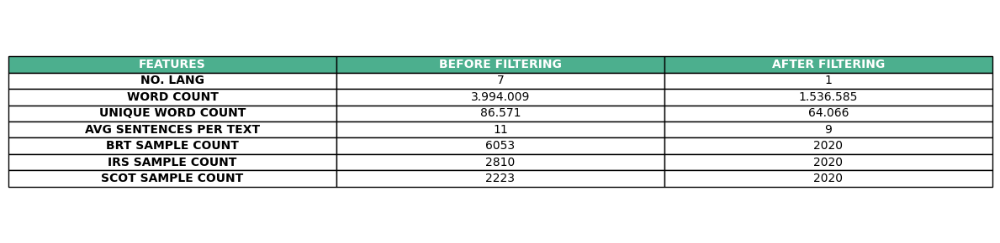

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Datele din tabel
data = {
    "FEATURES": ["WORD COUNT", "UNIQUE WORD COUNT", "AVG SENTENCES PER TEXT",
                 "BRT SAMPLE COUNT", "IRS SAMPLE COUNT", "SCOT SAMPLE COUNT"],
    "BEFORE FILTERING": [ "3.994.009", "86.571", 11, 6053, 2810, 2223],
    "AFTER FILTERING": [ "1.536.585", "64.066", 9, 2020, 2020, 2020],
}

# Creăm DataFrame
df = pd.DataFrame(data)

# Setări pentru afișare tabel
fig, ax = plt.subplots(figsize=(12, 3))
ax.axis('tight')
ax.axis('off')

# Creează tabelul
table = ax.table(cellText=df.values,
                 colLabels=df.columns,
                 cellLoc='center',
                 loc='center',
                 colColours=['#4CAF8E'] * len(df.columns))

# Stilizare antet
for key, cell in table.get_celld().items():
    row, col = key
    if row == 0:
        cell.set_text_props(weight='bold', color='white')
        cell.set_fontsize(12)
        cell.set_facecolor('#4CAF8E')
    elif col == 0:
        cell.set_fontsize(10)
        cell.set_text_props(weight='bold')

# Ajustează dimensiuni font în celule
table.auto_set_font_size(False)
table.set_fontsize(10)

# Salvează ca imagine
plt.tight_layout()
plt.savefig("dataset_table.png", dpi=300)
plt.show()


In [ ]:
import nltk
nltk.download('punkt_tab')

average_sentences_per_text(df)
average_sentences_per_text(old_df)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Average number of sentences per text: 8.953960396039603
Average number of sentences per text: 11.513376623376624


In [ ]:
count_words(df)
unique_words(df)
count_words(old_df)
unique_words(old_df)

Total number of words: 1536585
Average number of words per text: 253.5618811881188
Total number of unique words: 64066
Total number of words: 3994009
Average number of words per text: 259.35123376623375
Total number of unique words: 86571


In [ ]:
brt_df = df[df['state']=='England']
irs_df =  df[df['state']=='Ireland']
sct_df = df[df['state']=='Scotland']

old_brt_df = old_df[old_df['state']=='England']
old_irs_df =  old_df[old_df['state']=='Ireland']
old_sct_df = old_df[old_df['state']=='Scotland']

print(brt_df.shape)
print(irs_df.shape)
print(sct_df.shape)
print(old_brt_df.shape)
print(old_irs_df.shape)
print(old_sct_df.shape)

(2020, 28)
(2020, 28)
(2020, 28)
(6053, 20)
(2810, 20)
(2223, 20)


In [ ]:
old_df = pd.read_csv("/content/dataset_multilingual.csv")

In [ ]:
old_df.shape

(15400, 19)

In [ ]:
old_df.columns

Index(['country', 'euroid', 'language', 'name', 'normalized_name',
       'seq_speaker_id', 'session_id', 'type', 'region', 'state', 'missing',
       'reason', 'da', 'de', 'en', 'es', 'fr', 'it', 'nl'],
      dtype='object')

In [ ]:
url = "https://github.com/Cristiana-Cocheci/Dialect-Classification/releases/download/dataset/classification_df_6060.csv"
df = pd.read_csv(url)
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def class_from_state(state):
  if state == 'England':
    return 0
  if state == 'Ireland':
    return 1
  if state == 'Scotland':
    return 2
  return 3

df['label']=[class_from_state(x) for x in df['state']]

In [ ]:
df.shape

(6060, 27)

In [ ]:
df.columns

Index(['country', 'euroid', 'language', 'name', 'normalized_name',
       'seq_speaker_id', 'session_id', 'type', 'region', 'state', 'missing',
       'reason', 'da', 'de', 'en', 'es', 'fr', 'it', 'nl', 'da_word_count',
       'de_word_count', 'en_word_count', 'es_word_count', 'fr_word_count',
       'it_word_count', 'nl_word_count', 'label'],
      dtype='object')

In [ ]:
df['state'].unique()

array(['England', 'Ireland', 'Scotland'], dtype=object)

In [ ]:
df['label'].unique()

array([0, 1, 2])

In [ ]:
my_df=df
df['en']

,en
0,An alternative proposition is that we start ha...
1,". Mr President, I rise as the rapporteur on th..."
2,"Mr President, Mr Färm, the rapporteur, has sai..."
3,"Madam President, yesterday morning I raised, u..."
4,"Mr President, the Prime Minster said that we s..."
...,...
6055,"Mr President, I was interested in what Mrs Jac..."
6056,"Am I to understand that you either will not, o..."
6057,I wonder if the Council would agree that the b...
6058,I would like to compliment and congratulate th...


# Preprocess Text

In [ ]:
# PROCESSING TEXT

# Turn text to lowercase
def lowerFun(text):
    return text.lower()


def removeMisc(text):
    text = text.strip()
    text = text.replace('\n',"")
    re.sub(r'\s+', ' ', text).strip()
    return text


# Remove punctuations
def removePunctuation(text):
    text = text.strip()
    text = text.replace('\n',"")
    re.sub(r'\s+', ' ', text).strip()
    punc = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''
    for c in text:
        if c in punc:
            text = text.replace(c, "")
    return text


def removePunctuationList(text_list):
    if isinstance(text_list, list):
      for i in range(len(text_list)):
          text_list[i] = removePunctuation(text_list[i])
      return text_list
    else:
      return removePunctuation(text_list)


def processTextsV0(lang='en'):
    df[lang] = df[lang].apply(removeMisc)


def processTextsV1(lang='en'):
    df[lang] = df[lang].apply(lowerFun)
    df[lang] = df[lang].apply(removePunctuationList)


def processTextsV2(lang='en'):
    df[lang] = df[lang].apply(lowerFun)
    # Split the data into sentences:
    df[lang] = df[lang].apply(tokenize.sent_tokenize)
    df[lang] = df[lang].apply(removePunctuationList)


In [ ]:
processTextsV0()

In [ ]:
my_df = df[['en', 'label']]

In [ ]:
my_df.head()

,en,label
0,An alternative proposition is that we start ha...,0
1,". Mr President, I rise as the rapporteur on th...",0
2,"Mr President, Mr Färm, the rapporteur, has sai...",0
3,"Madam President, yesterday morning I raised, u...",0
4,"Mr President, the Prime Minster said that we s...",0


# Classify with Bert and ModernBert - finetuning

In [ ]:
!pip install torch_xla

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def compute_scores(predictions, labels):
  '''
  returns accuracy, precision, recall, f1 score
  '''
  accuracy = accuracy_score(labels, predictions)
  precision = precision_score(labels, predictions, average='weighted')
  recall = recall_score(labels, predictions, average='weighted')
  f1 = f1_score(labels, predictions, average='weighted')


  return accuracy, precision, recall, f1

class BertObject():
  def __init__(self, model_name="bert-base-uncased"):
    if model_name == "bert-base-uncased":
      self.bert = BertForSequenceClassification.from_pretrained(model_name, num_labels=3).to(device)
      self.tokenizer = BertTokenizer.from_pretrained(model_name)
    elif model_name == "answerdotai/ModernBERT-base":
      self.bert = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3).to(device)
      self.tokenizer = AutoTokenizer.from_pretrained(model_name)

    # torch.compile(self.bert)

  def get_Trainer(self, train_dataset, validation_dataset):
    self.args = TrainingArguments(
        output_dir="/content/drive/MyDrive/deep_learning/project/results",
        num_train_epochs=3,
        per_device_train_batch_size=8,
        per_device_eval_batch_size=16,
        gradient_accumulation_steps=3,
        report_to="none"
    )
    self.trainer = Trainer(
        model=self.bert,
        args=self.args,
        train_dataset=train_dataset,
        eval_dataset=validation_dataset
    )

  def tokenize(self, text):
    self.tokens = self.tokenizer(text, padding=True, truncation=True, max_length=256, return_tensors="pt")
    return self.tokens

class ClassDataset(Dataset):
  def __init__(self, df, bert_obj, text_column_name):
    self.df = df
    self.labels = self.df['label'].values
    self.original_text = self.df[text_column_name].tolist()

    print(len(self.original_text), type(self.original_text))

    self.encodings = bert_obj.tokenize(self.original_text)

  def __len__(self):
    return len(self.df)

  def __getitem__(self, idx):
    item = {key: val[idx].clone().detach() for key, val in self.encodings.items()}
    item['labels'] = torch.tensor(self.labels[idx])
    return item


##  Bert with K-fold (K=10)

In [ ]:
TEXT_COLUMN_NAME='en'
best_accuracy = 0
best_model_path = "/content/drive/MyDrive/licenta/Models/modernbert_best_model_preprocessed"

# K-fold split with K=10
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=13)
accuracies = []
js = ""

for fold, (train_idx, val_idx) in enumerate(skf.split(my_df['en'], my_df['label'])):
    print(f'Fold {fold + 1}')

    bert_obj = BertObject(model_name="answerdotai/ModernBERT-base")
    bert_obj.bert.gradient_checkpointing_enable()


    # Split the data
    train_df = my_df.iloc[train_idx].reset_index(drop=True)
    val_df = my_df.iloc[val_idx].reset_index(drop=True)
    # Create dataset
    train_dataset = ClassDataset(train_df, bert_obj, TEXT_COLUMN_NAME)
    val_dataset = ClassDataset(val_df, bert_obj, TEXT_COLUMN_NAME)

    print("Train dataset size: ", len(train_dataset))
    print("Validation dataset size: ", len(val_df))

    BATCH_SIZE=32
    # instantiate the DataLoaders
    train_dataloader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True
    )
    val_dataloader = DataLoader(
        dataset=val_dataset,
        batch_size=BATCH_SIZE
    )

    os.environ["WANDB_DISABLED"] = "true"
    bert_obj.get_Trainer(train_dataset, val_dataset)
    bert_obj.trainer.train()

    print(bert_obj.trainer.evaluate())

    predictions = bert_obj.trainer.predict(val_dataset)
    logits = predictions.predictions
    pred_labels = np.argmax(logits, axis=1)
    true_labels = predictions.label_ids
    accuracy, precision, recall, f1 = compute_scores(pred_labels, true_labels)

    print(f"Fold {fold + 1} Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")
    js+= f"Fold {fold + 1} Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f},\n"

    # Save model if it's the best so far
    accuracies.append({accuracy, precision, recall, f1})

    # Save model if it's the best so far
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        bert_obj.trainer.save_model(best_model_path)


print(f"Best model saved at: {best_model_path} with accuracy: {best_accuracy:.4f}")
print(f"Average accuracy: {np.mean(accuracies)}")

Fold 1


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.13M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/694 [00:00<?, ?B/s]

5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


W0613 07:14:18.282000 364 torch/_inductor/utils.py:1137] [1/0] Not enough SMs to use max_autotune_gemm mode


Step,Training Loss
500,2.236800


{'eval_loss': 0.8793142437934875, 'eval_runtime': 14.538, 'eval_samples_per_second': 41.684, 'eval_steps_per_second': 2.614, 'epoch': 3.0}
Fold 1 Accuracy: 0.7129, Precision: 0.7154, Recall: 0.7129, F1: 0.7135
Fold 2


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss
500,2.227300


{'eval_loss': 0.9243183135986328, 'eval_runtime': 11.5949, 'eval_samples_per_second': 52.264, 'eval_steps_per_second': 3.277, 'epoch': 3.0}
Fold 2 Accuracy: 0.6667, Precision: 0.6684, Recall: 0.6667, F1: 0.6671
Fold 3


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss
500,2.256000


{'eval_loss': 0.8970617055892944, 'eval_runtime': 11.5458, 'eval_samples_per_second': 52.487, 'eval_steps_per_second': 3.291, 'epoch': 3.0}
Fold 3 Accuracy: 0.6815, Precision: 0.6857, Recall: 0.6815, F1: 0.6826
Fold 4


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss
500,2.261600


{'eval_loss': 0.8568751811981201, 'eval_runtime': 11.5667, 'eval_samples_per_second': 52.392, 'eval_steps_per_second': 3.285, 'epoch': 3.0}
Fold 4 Accuracy: 0.6452, Precision: 0.6487, Recall: 0.6452, F1: 0.6463
Fold 5


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss
500,2.135100


{'eval_loss': 0.8552939295768738, 'eval_runtime': 11.5899, 'eval_samples_per_second': 52.287, 'eval_steps_per_second': 3.279, 'epoch': 3.0}
Fold 5 Accuracy: 0.7162, Precision: 0.7217, Recall: 0.7162, F1: 0.7175
Fold 6


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss
500,2.274900


{'eval_loss': 0.8298442363739014, 'eval_runtime': 11.5937, 'eval_samples_per_second': 52.27, 'eval_steps_per_second': 3.278, 'epoch': 3.0}
Fold 6 Accuracy: 0.7063, Precision: 0.7156, Recall: 0.7063, F1: 0.7080
Fold 7


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss
500,2.115300


{'eval_loss': 0.9500383734703064, 'eval_runtime': 11.5572, 'eval_samples_per_second': 52.435, 'eval_steps_per_second': 3.288, 'epoch': 3.0}
Fold 7 Accuracy: 0.6700, Precision: 0.6671, Recall: 0.6700, F1: 0.6673
Fold 8


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss
500,2.187600


{'eval_loss': 0.8494877219200134, 'eval_runtime': 11.5859, 'eval_samples_per_second': 52.305, 'eval_steps_per_second': 3.28, 'epoch': 3.0}
Fold 8 Accuracy: 0.7244, Precision: 0.7253, Recall: 0.7244, F1: 0.7235
Fold 9


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss
500,2.220100


{'eval_loss': 0.8042454719543457, 'eval_runtime': 11.6299, 'eval_samples_per_second': 52.107, 'eval_steps_per_second': 3.267, 'epoch': 3.0}
Fold 9 Accuracy: 0.7096, Precision: 0.7151, Recall: 0.7096, F1: 0.7108
Fold 10


Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


Step,Training Loss


In [ ]:
js = {"fold_"+str(x+1) : accuracies[int(x)] for x in range(len(accuracies))}

In [ ]:
js

{'fold_1': {0.6356408519212051, 0.6394389438943895, 0.6493435331696469},
 'fold_2': {0.6338636592430978, 0.6394389438943895, 0.6457328974594169},
 'fold_3': {0.6673890401375143, 0.6697890429790727, 0.66996699669967},
 'fold_4': {0.671548644522329, 0.6715765765022176, 0.6732673267326733},
 'fold_5': {0.6603342002202501, 0.6617161716171617, 0.6624933263094879}}

In [ ]:
js = "Fold 1 Accuracy: 0.6535, Precision: 0.6535, Recall: 0.6535, F1: 0.6535, \n"+\
"Fold 2 Accuracy: 0.6378, Precision: 0.6371, Recall: 0.6378, F1: 0.6371, \n"+\
"Fold 3 Accuracy: 0.6865, Precision: 0.6879, Recall: 0.6865, F1: 0.6865, \n"+\
"Fold 4 Accuracy: 0.6708, Precision: 0.6745, Recall: 0.6708, F1: 0.6716, \n"+\
""

In [ ]:
import json
#write json to file
fil = open("/content/drive/MyDrive/licenta/Results/processed_modernbert_results.json", "w")
json.dump(js, fil)
fil.close()

## Captum

In [ ]:
from captum.attr import IntegratedGradients, visualization
from transformers import AutoTokenizer
import torch.nn.functional as F
from captum.attr import visualization as viz
from captum.attr import TokenReferenceBase
from captum.attr import visualization as viz
from captum.attr import LayerConductance, LayerIntegratedGradients

In [ ]:
bert_path = '/content/drive/MyDrive/licenta/Models/bert_best_model'
modern_bert_path = '/content/drive/MyDrive/licenta/Models/modernbert_best_model'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
loaded_bert = BertForSequenceClassification.from_pretrained(bert_path)
loaded_bert.to(device)
loaded_bert.eval()
bert_tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

loaded_modern_bert = AutoModelForSequenceClassification.from_pretrained(modern_bert_path)
loaded_modern_bert.to(device)
loaded_modern_bert.eval()
modern_bert_tokenizer = AutoTokenizer.from_pretrained("answerdotai/ModernBERT-base")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.13M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/694 [00:00<?, ?B/s]

In [ ]:
test_df = my_df
TEXT_COLUMN_NAME='en'

bert_obj = BertObject(model_name="bert-base-uncased")
modern_bert_obj = BertObject(model_name="answerdotai/ModernBERT-base")

test_dataset1 = ClassDataset(test_df, bert_obj, TEXT_COLUMN_NAME)
test_dataset2 = ClassDataset(test_df, modern_bert_obj, TEXT_COLUMN_NAME)

print("Test dataset size: ", len(test_df))


BATCH_SIZE=8

test_dataloader_bert = DataLoader(
    dataset=test_dataset1,
    batch_size=BATCH_SIZE
)
test_dataloader_modern_bert = DataLoader(
    dataset=test_dataset2,
    batch_size=BATCH_SIZE
)

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

Some weights of ModernBertForSequenceClassification were not initialized from the model checkpoint at answerdotai/ModernBERT-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


6060 <class 'list'>
6060 <class 'list'>
Test dataset size:  6060


### Find examples where modern bert is right and bert is not

In [ ]:
# Find examples where modern bert is right and bert is not
import random

correct_modern_wrong_bert = []
label_column = 'label'
NUM_EXAMPLES = 10
btch=0

with torch.no_grad():
    for batch_idx, (batch1, batch2) in enumerate(zip(test_dataloader_bert, test_dataloader_modern_bert)):
        btch+=1
        if btch % 25 != 0:
            continue
        input_ids1 = batch1['input_ids'] # Access the tensor using the key
        attention_mask1 = batch1['attention_mask'] # Access the tensor using the key
        labels = batch1['labels'] # Access the tensor using the key
        input_ids2 = batch2['input_ids'] # Access the tensor using the key
        attention_mask2 = batch2['attention_mask'] # Access the tensor using the key

        input_ids1 = input_ids1.to(device)
        attention_mask1 = attention_mask1.to(device)
        labels = labels.to(device)

        input_ids2 = input_ids2.to(device)
        attention_mask2 = attention_mask2.to(device)

        # Get logits
        outputs_bert = loaded_bert(input_ids=input_ids1, attention_mask=attention_mask1)
        outputs_modern = loaded_modern_bert(input_ids=input_ids2, attention_mask=attention_mask2)

        preds_bert = torch.argmax(outputs_bert.logits, dim=1)
        preds_modern = torch.argmax(outputs_modern.logits, dim=1)

        # Compare predictions
        for i in range(len(labels)):
            if preds_modern[i] == labels[i] and preds_bert[i] != labels[i]:
                idx = batch_idx * BATCH_SIZE + i
                text = test_df.iloc[idx][TEXT_COLUMN_NAME]
                true_label = labels[i].item()
                pred_bert = preds_bert[i].item()
                pred_modern = preds_modern[i].item()

                correct_modern_wrong_bert.append({
                    "text": text,
                    "true_label": true_label,
                    "bert_pred": pred_bert,
                    "modern_bert_pred": pred_modern
                })

            if len(correct_modern_wrong_bert) >= NUM_EXAMPLES:
                break
        if len(correct_modern_wrong_bert) >= NUM_EXAMPLES:
            break

# Print results
for i, ex in enumerate(correct_modern_wrong_bert):
    print(f"\nExample {i+1}:")
    print("Text:", ex["text"])
    print("True Label:", ex["true_label"])
    print("BERT Prediction:", ex["bert_pred"])
    print("ModernBERT Prediction:", ex["modern_bert_pred"])


W0530 14:57:41.233000 2332 torch/_inductor/utils.py:1137] [1/0] Not enough SMs to use max_autotune_gemm mode



Example 1:
Text: Mr President, we are here to debate the situation in Syria and in particular the changes that have taken place since President Bashir al Assad took over from his father some three years ago.Following the arrest of Mr Riad al-Turk, a 72 year-old lawyer and secretary-general of the banned Communist Party, there are suggestions that Syria might be about to enter a new phase of repression, following a gradual thawing of relations with the West and a desirable but limited opening-up of the Syrian economy to market forces.Although no expert, I would certainly support the calls for all prisoners of conscience to be freed, in Syria and elsewhere. It is vital that the Syrian Government understands the need to distinguish between those who advocate violence or rebellion and those who simply advocate political change. I also fully support the paragraphs in the motion calling for the Syrian authorities to ensure that detainees are not tortured in prison.Human rights cannot be det

## Bert Captum

In [ ]:
model_path = bert_path

# load model
bert_model = BertForSequenceClassification.from_pretrained(model_path)
bert_model.to(device)
bert_model.eval()
bert_model.zero_grad()

# load tokenizer
bert_tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

import gc
def forward_func(input_ids, attention_mask):
    outputs = bert_model(input_ids=input_ids, attention_mask=attention_mask)
    return torch.nn.functional.softmax(outputs.logits, dim=-1)

lig = LayerIntegratedGradients(forward_func, bert_model.bert.embeddings)
label_map = {0: "English", 1: "Irish", 2: "Scottish"}

for example in correct_modern_wrong_bert:
    text = example['text']
    label = example['bert_pred']  # predicted label

    for target_class in [0, 1, 2]:

      inputs = bert_tokenizer(text, return_tensors='pt', max_length=512, truncation=True)
      input_ids = inputs['input_ids'].to(device)
      attention_mask = inputs['attention_mask'].to(device)

      attributions, delta = lig.attribute(
          inputs=input_ids,
          additional_forward_args=(attention_mask,),
          target=target_class, # dynamically use predicted label
          return_convergence_delta=True,
          n_steps=20
      )
      tokens = bert_tokenizer.convert_ids_to_tokens(input_ids[0])
      attributions_sum = attributions.sum(dim=-1).squeeze(0)
      attributions_sum = attributions_sum / torch.norm(attributions_sum)


      vis_data = viz.VisualizationDataRecord(
          word_attributions=attributions_sum.detach().cpu().numpy(),
          pred_prob=torch.max(forward_func(input_ids, attention_mask)).item(),
          pred_class=label_map[label],
          true_class=label_map[example['true_label']],
          attr_class=label_map[target_class],
          attr_score=attributions_sum.sum().item(),
          raw_input_ids=tokens,
          convergence_score=delta.item()
      )

      print(f"Attribution for {label_map[target_class]}")
      viz.visualize_text([vis_data])


      del attention_mask, input_ids, attributions, delta
      gc.collect()
      torch.cuda.empty_cache()


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


## Modern Bert Captum

In [ ]:
# Use same tokenizer as your model
custom_model_path = modern_bert_path
modern_tokenizer = AutoTokenizer.from_pretrained("answerdotai/ModernBERT-base")
modern_model = AutoModelForSequenceClassification.from_pretrained(custom_model_path).to(device)
modern_model.eval()
modern_model.zero_grad()

import gc
def forward_func(input_ids, attention_mask):
    outputs = modern_model(input_ids=input_ids, attention_mask=attention_mask)
    return torch.nn.functional.softmax(outputs.logits, dim=-1)


def merge_subword_attributions(tokens, attributions):
    merged_tokens = []
    merged_attributions = []
    current_token = ""
    current_attribution = 0

    for token, attribution in zip(tokens, attributions):
        if token.startswith("Ġ"):  # Start of a new word
            if current_token:
                merged_tokens.append(current_token)
                merged_attributions.append(current_attribution)
            current_token = token[1:]  # Remove "Ġ"
            current_attribution = attribution
        else:
            current_token += token
            current_attribution += attribution  # Accumulate attributions

    # Add the last token
    if current_token:
        merged_tokens.append(current_token)
        merged_attributions.append(current_attribution)

    return merged_tokens, merged_attributions

lig = LayerIntegratedGradients(forward_func, modern_model.model.embeddings)

for example in correct_modern_wrong_bert:
    text = example['text']
    label = example['modern_bert_pred']

    for target_class in [0, 1, 2]:

      inputs = modern_tokenizer(text, return_tensors='pt', max_length=512, truncation=True)
      input_ids = inputs['input_ids'].to(device)
      attention_mask = inputs['attention_mask'].to(device)

      attributions, delta = lig.attribute(
          inputs=input_ids,
          additional_forward_args=(attention_mask,),
          target=target_class,
          return_convergence_delta=True,
          n_steps=20
      )
      tokens = modern_tokenizer.convert_ids_to_tokens(input_ids[0])
      attributions_sum = attributions.sum(dim=-1).squeeze(0)
      attributions_sum = attributions_sum / torch.norm(attributions_sum)


      merged_tokens, merged_attributions = merge_subword_attributions(tokens, attributions_sum.detach().cpu().numpy())


      vis_data = viz.VisualizationDataRecord(
          word_attributions=np.array(merged_attributions), #attributions_sum.detach().cpu().numpy(),
          pred_prob=torch.max(forward_func(input_ids, attention_mask)).item(),
          pred_class=label_map[label],
          true_class=label_map[example['true_label']],
          attr_class=label_map[target_class],
          attr_score=attributions_sum.sum().item(),
          raw_input_ids=merged_tokens,
          convergence_score=delta.item()
      )

      print(f"Attribution for {label_map[target_class]}")
      viz.visualize_text([vis_data])



      del attention_mask, input_ids, attributions, delta
      gc.collect()
      torch.cuda.empty_cache()


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


Attribution for English


Attribution for Irish


Attribution for Scottish


# Classify with CLS TOKENS

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from transformers import BertModel, BertTokenizer
from transformers import AutoTokenizer, AutoModel

In [ ]:
print("GPU Available:", torch.cuda.is_available())
print("GPU Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU found")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

GPU Available: True
GPU Name: Tesla T4


In [ ]:
class BertEmbeddings():
  def __init__(self, model_name):
    if model_name == "bert-base-uncased":
      self.bert = BertModel.from_pretrained(model_name, num_labels=2).to(device)
      self.tokenizer = BertTokenizer.from_pretrained(model_name)
    elif model_name == "answerdotai/ModernBERT-base":
      self.bert = AutoModel.from_pretrained(model_name, num_labels=2).to(device)
      self.tokenizer = AutoTokenizer.from_pretrained(model_name)

    self.tokens = {"input_ids": [], "attention_mask": [], "token_type_ids": []}
    self.embeddings = []


  def tokenize(self, text):
    self.tokens = self.tokenizer(text, padding=True, truncation=True, max_length=256, return_tensors="pt")
    return self.tokens

  def get_embeddings(self, batch_size=32):
    num_samples = self.tokens["input_ids"].shape[0]  # Total number of samples

    with torch.no_grad():
        for i in range(0, num_samples, batch_size):
            batch_input_ids = self.tokens["input_ids"][i:i + batch_size].to(device)
            batch_attention_mask = self.tokens["attention_mask"][i:i + batch_size].to(device)
            batch_token_type_ids = self.tokens["token_type_ids"][i:i + batch_size].to(device)

            self.outputs = self.bert(
                input_ids=batch_input_ids,
                attention_mask=batch_attention_mask,
                token_type_ids=batch_token_type_ids
            )

            # CLS token embedding
            batch_embeddings = self.outputs.last_hidden_state[:, 0, :].to(device)
            self.embeddings.append(batch_embeddings)

    # Convert list of tensors to a single tensor
    self.embeddings = torch.cat(self.embeddings, dim=0)

class ClassDataset(Dataset):
  def __init__(self, df, bert_obj, label):
    self.df = df
    self.labels = self.df[label].values
    self.original_text = self.df['en'].tolist()
    self.bert_obj = bert_obj

    print(len(self.original_text), type(self.original_text))

    self.encodings = bert_obj.tokenize(self.original_text)
    bert_obj.get_embeddings()
    self.features = bert_obj.embeddings

  def __len__(self):
    return len(self.df)

  def __getitem__(self, idx):
    return self.features[idx], self.labels[idx]

class MLP(nn.Module):

  def __init__(self, input_size: int, hidden_size_1: int, activation_fn: Callable):

    super().__init__()

    self.input_size = input_size
    self.hidden_size_1 = hidden_size_1
    self.activation_fn = activation_fn

    self.layer_1 = nn.Linear(
        in_features=self.input_size,
        out_features=self.hidden_size_1,
        bias=True
    )
    self.output_layer = nn.Linear(
        in_features=self.hidden_size_1,
        out_features=1,
        bias=True
    )

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    h1 = self.activation_fn(self.layer_1(x))
    output = self.output_layer(h1)
    return output

def train_epoch(model, train_dataLoader, loss_fn, optimizer, device, treshold=0.5):
  model.train()
  epoch_loss = 0.0
  num_batches = len(train_dataloader)
  predictions = []
  labels = []
  for idx, batch in tqdm(enumerate(train_dataloader)):
    batch_features, batch_label = batch
    current_batch_size = batch_features.size(0)

    batch_features = batch_features.type(torch.float32).to(device)
    batch_label = batch_label.type(torch.float32).to(device).unsqueeze(1)

    output = model.forward(batch_features)

    predictions += (torch.sigmoid(output) > treshold).int().tolist()
    labels += [x[0] for x in batch_label]

    loss = loss_fn(output, batch_label)

    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    epoch_loss += loss.item()

  epoch_loss /= num_batches
  labels = [tensor.cpu().item() for tensor in labels]
  predictions = [l[0] for l in predictions]
  return epoch_loss, predictions, labels


def eval_epoch(model, val_dataloader, loss_fn, device, treshold=0.5):
  model.eval()
  epoch_loss = 0.0
  num_batches = len(val_dataloader)
  predictions = []
  labels = []
  with torch.no_grad():
    for idx, batch in tqdm(enumerate(val_dataloader)):
      batch_features, batch_label = batch
      current_batch_size = batch_features.size(0)

      batch_features = batch_features.type(torch.float32).to(device)
      batch_label = batch_label.type(torch.float32).to(device).unsqueeze(1)

      output = model.forward(batch_features)
      batch_predictions = (torch.sigmoid(output) > treshold).int()
      predictions += batch_predictions.tolist()

      labels += [x[0] for x in batch_label]

      loss = loss_fn(output, batch_label)
      epoch_loss += loss.item()

  epoch_loss /= num_batches

  labels = [tensor.cpu().item() for tensor in labels]
  predictions = [l[0] for l in predictions]
  return epoch_loss, predictions, labels


def compute_accuracy(predictions, labels) -> float:
  correct_predictions = [p==l for p, l in zip(predictions, labels)]
  return sum(correct_predictions)/len(correct_predictions)


def compute_scores(predictions, labels):
  '''
  returns precision, recall, f1 score
  '''
  precision = precision_score(labels, predictions, average='weighted')
  recall = recall_score(labels, predictions, average='weighted')
  f1 = f1_score(labels, predictions, average='weighted')


  return precision, recall, f1

def plot_confusion_matrix(val_predictions, val_labels):
  cm = confusion_matrix(val_labels, val_predictions, labels=[0, 1, 2])
  plt.figure(figsize=(6, 5))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
              xticklabels=['eng', 'irs', 'sco'],
              yticklabels=['eng', 'irs', 'sco'])
  plt.title('Confusion Matrix')
  plt.xlabel('Predicted')
  plt.ylabel('Actual')
  plt.tight_layout()
  plt.show()

def train(train_dataloader, validation_dataloader, model, loss_fn, optimizer, epochs=30, threshold=0.5):
  model = model.to(device)

  best_f1_score = -1.0
  best_model_state = None
  train_losses, val_losses = [], []
  train_accuracies, val_accuracies = [], []
  val_scores = [] # list of tupels (precision, recall, f1)

  for epoch_idx in range(epochs):
    train_epoch_loss, train_predictions, train_labels = train_epoch(
          model,
          train_dataloader,
          loss_fn,
          optimizer,
          device,
          threshold
      )
    val_epoch_loss, val_predictions, val_labels = eval_epoch(
          model,
          validation_dataloader,
          loss_fn,
          device,
          threshold
      )

    train_acc = compute_accuracy(train_predictions, train_labels)
    val_acc = compute_accuracy(val_predictions, val_labels)

    train_losses.append(train_epoch_loss)
    val_losses.append(val_epoch_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)

    precision, recall, f1 = compute_scores(val_predictions, val_labels)
    val_scores.append((precision, recall, f1))

    if f1 > best_f1_score:
      print("HEREEEEE")
      best_f1_score = f1
      best_model_state = copy.deepcopy(model.state_dict())

    print("epoch %d, train loss=%f, train acc=%f, val loss=%f, val acc=%f, val f1=%f" % (
          epoch_idx,
          train_epoch_loss,
          train_acc,
          val_epoch_loss,
          val_acc,
          f1
      ))

  print("Best f1 score: ", best_f1_score)
  model.load_state_dict(best_model_state)
  return model, train_losses, val_losses, train_accuracies, val_accuracies, val_scores

def plot_training_curves(epochs, train_loss, val_loss, train_accuracies, val_accuracies, val_scores):
  precision, recall, f1 = ([tup[0] for tup in val_scores], [tup[1] for tup in val_scores], [tup[2] for tup in val_scores])

  # Create subplots
  fig, axes = plt.subplots(1, 3, figsize=(18, 5))

  # Plot loss
  axes[0].plot(epochs, train_loss, label="Train Loss", marker='o')
  axes[0].plot(epochs, val_loss, label="Val Loss", marker='s')
  axes[0].set_title("Loss Over Epochs")
  axes[0].set_xlabel("Epochs")
  axes[0].set_ylabel("Loss")
  axes[0].legend()
  axes[0].grid(True)

  # Plot accuracy
  axes[1].plot(epochs, train_accuracies, label="Train Accuracy", marker='o', color='g')
  axes[1].plot(epochs, val_accuracies, label="Val Accuracy", marker='s', color='r')
  axes[1].set_title("Accuracy Over Epochs")
  axes[1].set_xlabel("Epochs")
  axes[1].set_ylabel("Accuracy")
  axes[1].legend()
  axes[1].grid(True)

  # Plot F1, Precision, Recall
  axes[2].plot(epochs, f1, label="F1 Score", marker='o', color='b')
  axes[2].plot(epochs, precision, label="Precision", marker='s', color='m')
  axes[2].plot(epochs, recall, label="Recall", marker='^', color='c')
  axes[2].set_title("F1 Score, Precision, Recall Over Epochs")
  axes[2].set_xlabel("Epochs")
  axes[2].set_ylabel("Score")
  axes[2].legend()
  axes[2].grid(True)

  # Adjust layout
  plt.tight_layout()
  plt.show()

def final_eval(model, validation_dataloader, loss_fn, device):
  # Get predictions of best model according to f1 score
  final_val_loss, val_predictions, val_labels = eval_epoch(
      model, validation_dataloader, loss_fn, device
  )

  #---------Evaluation--------------------------------------------------------------------
  print("validation labels: ",val_labels.count(1), val_labels.count(0))
  print("validation predicted: ", val_predictions.count(1), val_predictions.count(0))

  val_acc = compute_accuracy(val_predictions, val_labels)
  precision, recall, f1 = compute_scores(val_predictions, val_labels)

  print("validation accuracy: ", val_acc)
  print("precision: ", precision)
  print("recall: ", recall)
  print("f1 score: ", f1)
  plot_confusion_matrix(val_predictions, val_labels)
  #---------------------------------------------------------------------------------------

  return val_acc, precision, recall, f1

## BErt & MOdernBErt with K-fold


Fold 1


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


5454 <class 'list'>
606 <class 'list'>
Train dataset size:  5454
Validation dataset size:  606


171it [00:00, 253.85it/s]
19it [00:00, 782.73it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


HEREEEEE
epoch 0, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 401.33it/s]
19it [00:00, 872.00it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 1, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 349.29it/s]
19it [00:00, 711.25it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 2, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 180.51it/s]
19it [00:00, 695.42it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 3, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 331.18it/s]
19it [00:00, 570.15it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 4, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 463.08it/s]
19it [00:00, 1065.41it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 5, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 474.69it/s]
19it [00:00, 1019.51it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 6, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 424.80it/s]
19it [00:00, 1032.96it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 7, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 472.47it/s]
19it [00:00, 1066.11it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 8, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 456.33it/s]
19it [00:00, 1070.15it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 9, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 480.86it/s]
19it [00:00, 1120.15it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 10, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 465.45it/s]
19it [00:00, 1031.28it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 11, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 478.92it/s]
19it [00:00, 1047.80it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 12, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 461.79it/s]
19it [00:00, 1070.22it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 13, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 472.16it/s]
19it [00:00, 1028.35it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 14, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 484.01it/s]
19it [00:00, 1052.86it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 15, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 480.37it/s]
19it [00:00, 1050.90it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 16, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 475.39it/s]
19it [00:00, 960.86it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 17, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 479.60it/s]
19it [00:00, 1066.27it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 18, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 479.13it/s]
19it [00:00, 747.29it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 19, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 477.25it/s]
19it [00:00, 986.79it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 20, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 442.99it/s]
19it [00:00, 752.01it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 21, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 447.36it/s]
19it [00:00, 1094.13it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 22, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 468.08it/s]
19it [00:00, 916.11it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 23, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 445.79it/s]
19it [00:00, 726.15it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 24, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 386.30it/s]
19it [00:00, 763.62it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 25, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 363.88it/s]
19it [00:00, 650.41it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 26, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 362.49it/s]
19it [00:00, 821.81it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 27, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 407.93it/s]
19it [00:00, 845.54it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 28, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 347.23it/s]
19it [00:00, 713.06it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 29, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 436.31it/s]
19it [00:00, 951.46it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 30, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 483.84it/s]
19it [00:00, 1083.65it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 31, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 481.44it/s]
19it [00:00, 946.81it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 32, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 477.28it/s]
19it [00:00, 1021.66it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 33, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 480.89it/s]
19it [00:00, 817.33it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 34, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 474.51it/s]
19it [00:00, 1080.35it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 35, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 484.91it/s]
19it [00:00, 1049.45it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 36, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 232.02it/s]
19it [00:00, 1067.28it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 37, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 457.21it/s]
19it [00:00, 1042.13it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 38, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648


171it [00:00, 479.90it/s]
19it [00:00, 1045.10it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


epoch 39, train loss=0.000000, train acc=0.334800, val loss=0.000000, val acc=0.331683, val f1=0.169648
Best f1 score:  0.16964838608836244


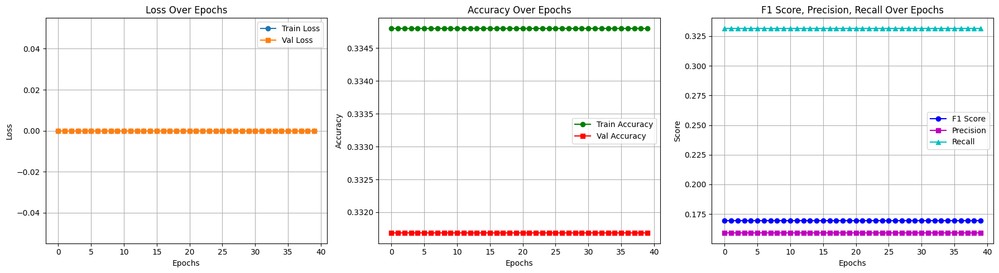

19it [00:00, 721.24it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


validation labels:  202 202
validation predicted:  7 599
validation accuracy:  0.3316831683168317
precision:  0.15891565307258126
recall:  0.3316831683168317
f1 score:  0.16964838608836244


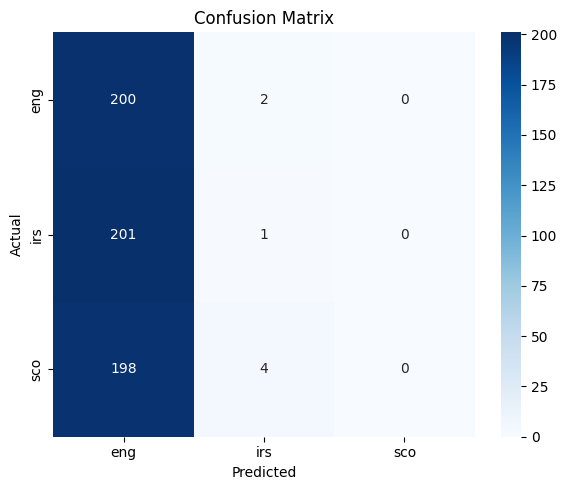

Fold 2
5454 <class 'list'>


In [ ]:
TEXT_COLUMN_NAME='en'
best_accuracy = 0
model_name="bert-base-uncased"


# K-fold split with K=10
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=13)
accuracies = []
js = ""

for fold, (train_idx, val_idx) in enumerate(skf.split(my_df['en'], my_df['label'])):
    print(f'Fold {fold + 1}')

    # Split the data
    train_df = my_df.iloc[train_idx].reset_index(drop=True)
    val_df = my_df.iloc[val_idx].reset_index(drop=True)
    # Create dataset

    train_dataset = ClassDataset(train_df, BertEmbeddings(model_name=model_name), 'label')
    validation_dataset = ClassDataset(val_df, BertEmbeddings(model_name=model_name), 'label')

    print("Train dataset size: ", len(train_dataset))
    print("Validation dataset size: ", len(val_df))

    BATCH_SIZE=32
    train_dataloader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True
    )
    validation_dataloader = DataLoader(
        dataset=validation_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True
    )

    mlp = MLP(
        input_size=768,
        hidden_size_1=256,
        activation_fn=nn.ReLU()
    )
    mlp = mlp.to(device)
    loss_fn = nn.CrossEntropyLoss()
    optimizer = optim.Adam(mlp.parameters(), lr=0.00005)

    bert_mlp, train_losses, val_losses, train_accuracies, val_accuracies, val_scores = train(train_dataloader, validation_dataloader, mlp, loss_fn, optimizer, epochs=40)

    plot_training_curves(
      range(len(train_losses)),
      train_losses,
      val_losses,
      train_accuracies,
      val_accuracies,
      val_scores
    )
    accuracy, precision, recall, f1 = final_eval(bert_mlp, validation_dataloader, loss_fn, device)


    # Save model if it's the best so far
    accuracies.append({accuracy, precision, recall, f1})





# Custom trandformer using spacy

In [ ]:
# Basic function to clean the text
def clean_text(text):
    return text.strip().lower()

#Custom transformer using spaCy
class predictors(TransformerMixin):
    def transform(self, X, **transform_params):
        return [clean_text(text) for text in X]
    def fit(self, X, y=None, **fit_params):
        return self
    def get_params(self, deep=True):
        return {}

# OTHER CLASSIFICATIONS

In [ ]:
X = my_df['en']
y = my_df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
NSPLITS = 10

In [ ]:
random_test_inexes = np.random.randint(0, len(X_test), 20)
X_test_samples = X_test.iloc[random_test_inexes]
y_test_samples = y_test.iloc[random_test_inexes]


In [ ]:
from IPython.display import display

def explain_pipeline(pipe):
  exp = TextExplainer(random_state=42)
  target_names = ['English', 'Irish', 'Scottish']

  for i, (text, label) in enumerate(zip(X_test_samples, y_test_samples)):
    exp.fit(X_test_samples.values[i], pipe.predict_proba)

    print(f"Text {i+1}: {text}")
    print(f"True Label: {label}")
    print(f"Predicted Label: {pipe.predict([text])[0]}")


    display(exp.show_prediction(target_names=target_names))
    display(exp.show_weights())

In [ ]:
def spacy_tokenizer_without_stopwords(sentence):
    mytokens = nlp(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]

    return mytokens


def spacy_tokenizer_only_stopwords(sentence):
    mytokens = nlp(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word in stopwords and word not in punctuations ]

    return mytokens


def spacy_tokenizer_all_words(sentence):
    mytokens = nlp(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in punctuations ]

    return mytokens
ex1 = "He was walking with the walker in the Wall he may had sat and run with the runner"
print(spacy_tokenizer_without_stopwords(ex1))
print(spacy_tokenizer_only_stopwords(ex1))
print(spacy_tokenizer_all_words(ex1))

['walk', 'walker', 'wall', 'sit', 'run', 'runner']
['he', 'be', 'with', 'the', 'in', 'the', 'he', 'may', 'have', 'and', 'with', 'the']
['he', 'be', 'walk', 'with', 'the', 'walker', 'in', 'the', 'wall', 'he', 'may', 'have', 'sit', 'and', 'run', 'with', 'the', 'runner']


In [ ]:
class SentenceEmbeddingTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, model_name='all-MiniLM-L6-v2'):
        self.model_name = model_name
        self.model = SentenceTransformer(model_name)

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return self.model.encode(X.tolist(), show_progress_bar=False)

In [ ]:
def my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf_name, my_feature_extractor_name):

  accuracies = []
  fold = 1
  best_pipeline = None
  best_accuracy = 0

  for train_idx, test_idx in kfold.split(X, y):
      if my_clf_name == "multinomial":
          my_clf = MultinomialNB()
      elif my_clf_name == "bernoulli":
          my_clf = BernoulliNB()
      elif my_clf_name == "logistic":
          my_clf = LogisticRegression()
      elif my_clf_name == "svm":
          my_clf = SVC(probability=True)
      elif my_clf_name == "linear-svm":
          my_clf = SVC(C=1.0,
            probability=True,
            kernel='linear')
      else:
          print("Invalid classifier")
          return

      print(f"\n Fold {fold}")

      X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
      y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

      # Define pipeline
      if my_feature_extractor_name =='tfidf':
        pipeline = Pipeline([
            ("cleaner", predictors()),
            ('tfidf', my_feature_extractor),
            ('select', my_select),
            ('clf', my_clf)
        ])
      elif my_feature_extractor_name =='count':
        pipeline = Pipeline([
            ("cleaner", predictors()),
            ('vectorizer', my_feature_extractor),
            ('select', my_select),
            ('clf', my_clf)
        ])
      elif my_feature_extractor_name =='sentence_embedding':
        pipeline = Pipeline([
            ('embed', my_feature_extractor),
            ('scale', MinMaxScaler()),  # normalize embeddings to positive values for NB
            ('clf', my_clf)
        ])
      else:
        print("Invalid feature extractor")
        return

      # Fit and evaluate
      pipeline.fit(X_train, y_train)
      y_pred = pipeline.predict(X_test)


      acc = accuracy_score(y_test, y_pred)
      accuracies.append(acc)

      print(f"✅ Accuracy: {acc:.4f}")
      print(classification_report(y_test, y_pred))

      # Confusion matrix
      cm = confusion_matrix(y_test, y_pred, labels=pipeline.classes_)
      plt.figure(figsize=(6, 5))
      sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                  xticklabels=pipeline.classes_,
                  yticklabels=pipeline.classes_)
      plt.title(f'Confusion Matrix - Fold {fold}')
      plt.xlabel('Predicted')
      plt.ylabel('Actual')
      plt.tight_layout()
      plt.show()

      if acc > best_accuracy:
          best_accuracy = acc
          best_pipeline = pipeline

      fold += 1

  # Summary
  print(f"\n Average Accuracy: {sum(accuracies) / len(accuracies):.4f}")
  return best_pipeline


In [ ]:
class BertEmbeddings():
  def __init__(self, model_name="bert-base-uncased"):
    if model_name == "bert-base-uncased":
      self.bert = BertModel.from_pretrained(model_name, num_labels=2).to(device)
      self.tokenizer = BertTokenizer.from_pretrained(model_name)
    elif model_name == "answerdotai/ModernBERT-base":
      self.bert = AutoModel.from_pretrained(model_name, num_labels=2).to(device)
      self.tokenizer = AutoTokenizer.from_pretrained(model_name)

    self.tokens = {"input_ids": [], "attention_mask": [], "token_type_ids": []}
    self.embeddings = []


  def tokenize(self, text):
    self.tokens = self.tokenizer(text, padding=True, truncation=True, max_length=256, return_tensors="pt")
    return self.tokens

  def get_embeddings(self, batch_size=32):
    num_samples = self.tokens["input_ids"].shape[0]  # Total number of samples

    with torch.no_grad():
        for i in range(0, num_samples, batch_size):
            batch_input_ids = self.tokens["input_ids"][i:i + batch_size].to(device)
            batch_attention_mask = self.tokens["attention_mask"][i:i + batch_size].to(device)
            batch_token_type_ids = self.tokens["token_type_ids"][i:i + batch_size].to(device)

            self.outputs = self.bert(
                input_ids=batch_input_ids,
                attention_mask=batch_attention_mask,
                token_type_ids=batch_token_type_ids
            )

            # CLS token embedding
            batch_embeddings = self.outputs.last_hidden_state[:, 0, :].to(device)
            self.embeddings.append(batch_embeddings)

    # Convert list of tensors to a single tensor
    self.embeddings = torch.cat(self.embeddings, dim=0)



class ClassDataset(Dataset):
  def __init__(self, values, labels, bert_obj):
    self.labels = labels.values
    self.original_text = values
    self.bert_obj = bert_obj

    print(len(self.original_text), type(self.original_text))

    self.encodings = bert_obj.tokenize(self.original_text)
    bert_obj.get_embeddings()
    self.features = bert_obj.embeddings

  def __len__(self):
    return len(self.df)

  def __getitem__(self, idx):
    return self.features[idx], self.labels[idx]


# NEURAL NET WITH CLS TOKEN

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from transformers import AutoTokenizer, AutoModel
import torch

class CLSEmbeddingTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, model_name='bert-base-uncased'):
        if model_name == "bert-base-uncased":
          self.bert = BertModel.from_pretrained(model_name, num_labels=3).to(device)
          self.tokenizer = BertTokenizer.from_pretrained(model_name)
        elif model_name == "answerdotai/ModernBERT-base":
          self.bert = AutoModel.from_pretrained(model_name, num_labels=3).to(device)
          self.tokenizer = AutoTokenizer.from_pretrained(model_name)
        self.bert.eval()  # Evaluation mode

    def fit(self, X, y=None):
        return self

    def transform(self, X):
      batch_size = 16  # You can try 8, 16, or 32 depending on memory
      self.bert.eval()
      embeddings = []
      texts = X.tolist() if hasattr(X, 'tolist') else list(X)

      with torch.no_grad():
          for i in range(0, len(texts), batch_size):
              batch = texts[i:i + batch_size]
              inputs = self.tokenizer(
                  batch, padding=True, truncation=True, return_tensors='pt'
              ).to(device)
              outputs = self.bert(**inputs)
              cls = outputs.last_hidden_state[:, 0, :]
              embeddings.append(cls.cpu())

      return torch.cat(embeddings, dim=0).numpy()



# Neural NET with embeddings


In [ ]:
import torch.nn as nn
from typing import Iterator, List, Callable, Tuple
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score
import copy
import seaborn as sns

In [ ]:
class StrokeClassifier(nn.Module):
  def __init__(self,
                 input_size: int,
                 hidden_size_1: int,
                 hidden_size_2: int,
                 hidden_size_3: int,
                 hidden_size_4: int,
                 hidden_size_5: int,
                 activation_fn: Callable,
                 dropout_prob: float = 0.5):
    super().__init__()
    self.input_size = input_size
    self.hidden_size_1 = hidden_size_1
    self.hidden_size_2 = hidden_size_2
    self.hidden_size_3 = hidden_size_3
    self.hidden_size_4 = hidden_size_4
    self.hidden_size_5 = hidden_size_5
    self.activation_fn = activation_fn
    self.dropout = nn.Dropout(dropout_prob)
    self.bn1 = nn.BatchNorm1d(hidden_size_1)
    self.bn2 = nn.BatchNorm1d(hidden_size_2)
    self.bn3 = nn.BatchNorm1d(hidden_size_3)
    self.bn4 = nn.BatchNorm1d(hidden_size_4)
    self.bn5 = nn.BatchNorm1d(hidden_size_5)

    self.layer_1 = nn.Linear(
        in_features=self.input_size,
        out_features=self.hidden_size_1,
        bias=True
    )
    self.layer_2 = nn.Linear(
        in_features=self.hidden_size_1,
        out_features=self.hidden_size_2,
        bias=True
    )
    self.layer_3 = nn.Linear(
        in_features=self.hidden_size_2,
        out_features=self.hidden_size_3,
        bias=True
    )
    self.layer_4 = nn.Linear(
        in_features=self.hidden_size_3,
        out_features=self.hidden_size_4,
        bias=True
    )
    self.layer_5 = nn.Linear(
        in_features=self.hidden_size_4,
        out_features=self.hidden_size_5,
        bias=True
    )
    self.output_layer = nn.Linear(
        in_features=self.hidden_size_5,
        out_features=3,
        bias=True
    )

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    x = self.dropout(self.activation_fn(self.bn1(self.layer_1(x))))
    x = self.dropout(self.activation_fn(self.bn2(self.layer_2(x))))
    x = self.dropout(self.activation_fn(self.bn3(self.layer_3(x))))
    x = self.dropout(self.activation_fn(self.bn4(self.layer_4(x))))
    x = self.dropout(self.activation_fn(self.bn5(self.layer_5(x))))
    output = self.output_layer(x)
    return output


In [ ]:
def train_epoch(model, train_dataLoader, loss_fn, optimizer, device, treshold=0.5):
  model.train()
  epoch_loss = 0.0
  num_batches = len(train_dataloader)
  predictions = []
  labels = []
  for idx, batch in tqdm(enumerate(train_dataloader)):
    batch_features, batch_label = batch
    current_batch_size = batch_features.size(0)

    batch_features = batch_features.type(torch.float32).to(device)
    batch_label = batch_label.type(torch.long).to(device)

    output = model.forward(batch_features)

    batch_predictions = (torch.softmax(output, dim=1) > treshold).int()
    preds = torch.argmax(batch_predictions, dim=1).tolist()
    predictions.extend(preds)

    labels += [x.item() for x in batch_label]

    loss = loss_fn(output, batch_label)

    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    epoch_loss += loss.item()

  # labels = [tensor.cpu().item() for tensor in labels]
  # predictions = [l.item() for l in predictions]
  epoch_loss /= num_batches
  return epoch_loss, predictions, labels


def eval_epoch(model, val_dataloader, loss_fn, device, treshold=0.5):
  model.eval()
  epoch_loss = 0.0
  num_batches = len(val_dataloader)
  predictions = []
  labels = []
  with torch.no_grad():
    for idx, batch in tqdm(enumerate(val_dataloader)):
      batch_features, batch_label = batch
      current_batch_size = batch_features.size(0)

      batch_features = batch_features.type(torch.float32).to(device)
      batch_label = batch_label.type(torch.long).to(device)

      output = model.forward(batch_features)
      batch_predictions = (torch.softmax(output, dim=1) > treshold).int()
      preds = torch.argmax(batch_predictions, dim=1).tolist()
      predictions.extend(preds)

      labels += [x.item() for x in batch_label]

      loss = loss_fn(output, batch_label)
      epoch_loss += loss.item()

  # labels = [tensor.cpu().item() for tensor in labels]
  # predictions = [l[0] for l in predictions]
  epoch_loss /= num_batches
  return epoch_loss, predictions, labels


def compute_accuracy(predictions, labels) -> float:
  correct_predictions = [p==l for p, l in zip(predictions, labels)]
  return sum(correct_predictions)/len(correct_predictions)


def compute_scores(predictions, labels):
  '''
  returns precision, recall, f1 score
  '''
  precision = precision_score(labels, predictions, average='weighted')
  recall = recall_score(labels, predictions, average='weighted')
  f1 = f1_score(labels, predictions, average='weighted')


  return precision, recall, f1

def plot_training_curves(epochs, train_loss, val_loss, train_accuracies, val_accuracies, val_scores):
  precision, recall, f1 = ([tup[0] for tup in val_scores], [tup[1] for tup in val_scores], [tup[2] for tup in val_scores])

  # Create subplots
  fig, axes = plt.subplots(1, 3, figsize=(18, 5))

  # Plot loss
  axes[0].plot(epochs, train_loss, label="Train Loss", marker='o')
  axes[0].plot(epochs, val_loss, label="Val Loss", marker='s')
  axes[0].set_title("Loss Over Epochs")
  axes[0].set_xlabel("Epochs")
  axes[0].set_ylabel("Loss")
  axes[0].legend()
  axes[0].grid(True)

  # Plot accuracy
  axes[1].plot(epochs, train_accuracies, label="Train Accuracy", marker='o', color='g')
  axes[1].plot(epochs, val_accuracies, label="Val Accuracy", marker='s', color='r')
  axes[1].set_title("Accuracy Over Epochs")
  axes[1].set_xlabel("Epochs")
  axes[1].set_ylabel("Accuracy")
  axes[1].legend()
  axes[1].grid(True)

  # Plot F1, Precision, Recall
  axes[2].plot(epochs, f1, label="F1 Score", marker='o', color='b')
  axes[2].plot(epochs, precision, label="Precision", marker='s', color='m')
  axes[2].plot(epochs, recall, label="Recall", marker='^', color='c')
  axes[2].set_title("F1 Score, Precision, Recall Over Epochs")
  axes[2].set_xlabel("Epochs")
  axes[2].set_ylabel("Score")
  axes[2].legend()
  axes[2].grid(True)

  # Adjust layout
  plt.tight_layout()
  plt.show()


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
def train(model, my_loss_fn, optimizer, epochs=15, threshold=0.5):
  model = model.to(device)

  best_f1_score = -1.0
  best_model_state = None
  train_losses, val_losses = [], []
  train_accuracies, val_accuracies = [], []
  val_scores = [] # list of tupels (precision, recall, f1)

  for epoch_idx in range(epochs):
    train_epoch_loss, train_predictions, train_labels = train_epoch(
          model,
          train_dataloader,
          my_loss_fn,
          optimizer,
          device,
          # threshold
      )
    val_epoch_loss, val_predictions, val_labels = eval_epoch(
          model,
          validation_dataloader,
          my_loss_fn,
          device,
          # threshold
      )

    train_acc = compute_accuracy(train_predictions, train_labels)
    val_acc = compute_accuracy(val_predictions, val_labels)

    train_losses.append(train_epoch_loss)
    val_losses.append(val_epoch_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)

    precision, recall, f1 = compute_scores(val_predictions, val_labels)
    val_scores.append((precision, recall, f1))

    if f1 > best_f1_score:
      print("HEREEEEE")
      best_f1_score = f1
      best_model_state = copy.deepcopy(model.state_dict())

    print("epoch %d, train loss=%f, train acc=%f, val loss=%f, val acc=%f, val f1=%f" % (
          epoch_idx,
          train_epoch_loss,
          train_acc,
          val_epoch_loss,
          val_acc,
          f1
      ))

  print("Best f1 score: ", best_f1_score)
  model.load_state_dict(best_model_state)
  return model, train_losses, val_losses, train_accuracies, val_accuracies, val_scores


def plot_confusion_matrix(val_predictions, val_labels):
  # Confusion matrix
    cm = confusion_matrix(val_labels, val_predictions, labels=[0, 1, 2])
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['English', 'Irish', 'Scottish'],
                yticklabels=['English', 'Irish', 'Scottish'])
    plt.title(f'Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()


def final_eval(model, validation_dataloader, loss_fn, device):
  # Get predictions of best model according to f1 score
  final_val_loss, val_predictions, val_labels = eval_epoch(
      model, validation_dataloader, loss_fn, device
  )

  #---------Evaluation--------------------------------------------------------------------
  print("validation labels: ",val_labels.count(1), val_labels.count(0))
  print("validation predicted: ", val_predictions.count(1), val_predictions.count(0))

  val_acc = compute_accuracy(val_predictions, val_labels)
  precision, recall, f1 = compute_scores(val_predictions, val_labels)

  print("validation accuracy: ", val_acc)
  print("precision: ", precision)
  print("recall: ", recall)
  print("f1 score: ", f1)
  plot_confusion_matrix(val_predictions, val_labels)
  #---------------------------------------------------------------------------------------

In [ ]:
class StrokeDataset(Dataset):
  def __init__(self, values, labels):
    self.labels = labels.values
    self.features = values

  def __len__(self):
    return len(self.labels)

  def __getitem__(self, idx):
    return self.features[idx], self.labels[idx]

In [ ]:
X = my_df['en']
y = my_df['label']

embedding_transformer = SentenceEmbeddingTransformer(model_name='all-MiniLM-L6-v2')

# kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# fold=0

X_embedd = embedding_transformer.fit_transform(X)
X_embedd_train, X_embedd_test, y_train, y_test = train_test_split(X_embedd, y, test_size=0.2, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_embedd_train, y_train, test_size=0.2, random_state=42)


Train dataset size:  3878
Validation dataset size:  970
Input dimension:  384
Model's parameters: 
	 bn1.weight :  torch.Size([400])
	 bn1.bias :  torch.Size([400])
	 bn2.weight :  torch.Size([300])
	 bn2.bias :  torch.Size([300])
	 bn3.weight :  torch.Size([200])
	 bn3.bias :  torch.Size([200])
	 bn4.weight :  torch.Size([100])
	 bn4.bias :  torch.Size([100])
	 bn5.weight :  torch.Size([50])
	 bn5.bias :  torch.Size([50])
	 layer_1.weight :  torch.Size([400, 384])
	 layer_1.bias :  torch.Size([400])
	 layer_2.weight :  torch.Size([300, 400])
	 layer_2.bias :  torch.Size([300])
	 layer_3.weight :  torch.Size([200, 300])
	 layer_3.bias :  torch.Size([200])
	 layer_4.weight :  torch.Size([100, 200])
	 layer_4.bias :  torch.Size([100])
	 layer_5.weight :  torch.Size([50, 100])
	 layer_5.bias :  torch.Size([50])
	 output_layer.weight :  torch.Size([3, 50])
	 output_layer.bias :  torch.Size([3])
Number of model parameters:  361903


122it [00:01, 83.31it/s] 
31it [00:00, 292.96it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


HEREEEEE
epoch 0, train loss=1.141335, train acc=0.335740, val loss=1.070284, val acc=0.340206, val f1=0.183742


122it [00:01, 104.34it/s]
31it [00:00, 313.27it/s]


HEREEEEE
epoch 1, train loss=1.076660, train acc=0.383445, val loss=1.020006, val acc=0.415464, val f1=0.313327


122it [00:01, 118.56it/s]
31it [00:00, 176.02it/s]


HEREEEEE
epoch 2, train loss=1.037542, train acc=0.441723, val loss=0.997944, val acc=0.475258, val f1=0.420141


122it [00:01, 96.24it/s] 
31it [00:00, 207.61it/s]


HEREEEEE
epoch 3, train loss=1.013894, train acc=0.481949, val loss=0.989686, val acc=0.497938, val f1=0.458856


122it [00:01, 101.16it/s]
31it [00:00, 218.29it/s]


HEREEEEE
epoch 4, train loss=0.987460, train acc=0.513151, val loss=0.975307, val acc=0.524742, val f1=0.498633


122it [00:01, 107.49it/s]
31it [00:00, 353.37it/s]


HEREEEEE
epoch 5, train loss=0.975078, train acc=0.522950, val loss=0.969326, val acc=0.548454, val f1=0.535440


122it [00:00, 130.56it/s]
31it [00:00, 294.73it/s]


HEREEEEE
epoch 6, train loss=0.959101, train acc=0.541001, val loss=0.968560, val acc=0.559794, val f1=0.548480


122it [00:01, 112.85it/s]
31it [00:00, 338.36it/s]


epoch 7, train loss=0.948564, train acc=0.573234, val loss=0.973881, val acc=0.550515, val f1=0.540948


122it [00:00, 127.01it/s]
31it [00:00, 311.68it/s]


HEREEEEE
epoch 8, train loss=0.928586, train acc=0.602114, val loss=0.969833, val acc=0.563918, val f1=0.557894


122it [00:00, 184.87it/s]
31it [00:00, 511.00it/s]


epoch 9, train loss=0.922695, train acc=0.600567, val loss=0.976565, val acc=0.549485, val f1=0.539107


122it [00:00, 205.38it/s]
31it [00:00, 506.42it/s]


epoch 10, train loss=0.914417, train acc=0.623259, val loss=0.965418, val acc=0.558763, val f1=0.552452


122it [00:00, 197.73it/s]
31it [00:00, 525.88it/s]


HEREEEEE
epoch 11, train loss=0.894906, train acc=0.640794, val loss=0.962635, val acc=0.578351, val f1=0.577266


122it [00:00, 203.86it/s]
31it [00:00, 517.85it/s]


HEREEEEE
epoch 12, train loss=0.890294, train acc=0.657298, val loss=0.967811, val acc=0.587629, val f1=0.586700


122it [00:00, 203.90it/s]
31it [00:00, 496.85it/s]


epoch 13, train loss=0.878685, train acc=0.660134, val loss=0.963766, val acc=0.585567, val f1=0.583871


122it [00:00, 194.40it/s]
31it [00:00, 517.70it/s]


HEREEEEE
epoch 14, train loss=0.869177, train acc=0.678958, val loss=0.969508, val acc=0.592784, val f1=0.592731


122it [00:00, 203.86it/s]
31it [00:00, 499.94it/s]


epoch 15, train loss=0.854489, train acc=0.689789, val loss=0.977530, val acc=0.569072, val f1=0.566490


122it [00:00, 203.14it/s]
31it [00:00, 516.84it/s]


epoch 16, train loss=0.842594, train acc=0.707581, val loss=0.992118, val acc=0.562887, val f1=0.563439


122it [00:00, 200.63it/s]
31it [00:00, 516.47it/s]


epoch 17, train loss=0.839597, train acc=0.709386, val loss=0.982604, val acc=0.585567, val f1=0.585840


122it [00:00, 149.33it/s]
31it [00:00, 410.43it/s]


epoch 18, train loss=0.829569, train acc=0.726405, val loss=0.972757, val acc=0.581443, val f1=0.580540


122it [00:00, 142.72it/s]
31it [00:00, 357.08it/s]


epoch 19, train loss=0.829810, train acc=0.730273, val loss=0.975566, val acc=0.579381, val f1=0.578561


122it [00:00, 154.60it/s]
31it [00:00, 321.38it/s]


epoch 20, train loss=0.816432, train acc=0.745487, val loss=0.997324, val acc=0.568041, val f1=0.569288


122it [00:00, 175.46it/s]
31it [00:00, 536.15it/s]


epoch 21, train loss=0.813258, train acc=0.740072, val loss=0.996711, val acc=0.572165, val f1=0.572037


122it [00:00, 205.43it/s]
31it [00:00, 521.59it/s]


epoch 22, train loss=0.800913, train acc=0.749613, val loss=0.984006, val acc=0.588660, val f1=0.590452


122it [00:00, 207.62it/s]
31it [00:00, 437.10it/s]


epoch 23, train loss=0.797619, train acc=0.760701, val loss=1.004769, val acc=0.563918, val f1=0.562794


122it [00:00, 206.22it/s]
31it [00:00, 506.79it/s]


epoch 24, train loss=0.789138, train acc=0.772305, val loss=0.996231, val acc=0.591753, val f1=0.589624


122it [00:00, 201.16it/s]
31it [00:00, 520.32it/s]


HEREEEEE
epoch 25, train loss=0.785129, train acc=0.777463, val loss=0.988802, val acc=0.596907, val f1=0.597755


122it [00:00, 203.37it/s]
31it [00:00, 405.68it/s]


epoch 26, train loss=0.774402, train acc=0.784425, val loss=0.984705, val acc=0.592784, val f1=0.594099


122it [00:00, 200.56it/s]
31it [00:00, 516.20it/s]


HEREEEEE
epoch 27, train loss=0.763473, train acc=0.789324, val loss=0.992882, val acc=0.600000, val f1=0.600948


122it [00:00, 198.23it/s]
31it [00:00, 508.71it/s]


epoch 28, train loss=0.756511, train acc=0.792419, val loss=1.004759, val acc=0.591753, val f1=0.591536


122it [00:00, 201.96it/s]
31it [00:00, 427.27it/s]


epoch 29, train loss=0.748800, train acc=0.806601, val loss=1.025303, val acc=0.573196, val f1=0.569216


122it [00:00, 207.27it/s]
31it [00:00, 478.71it/s]


epoch 30, train loss=0.753201, train acc=0.800413, val loss=0.995400, val acc=0.587629, val f1=0.589247


122it [00:00, 195.21it/s]
31it [00:00, 532.35it/s]


epoch 31, train loss=0.731696, train acc=0.824394, val loss=1.010176, val acc=0.586598, val f1=0.587500


122it [00:00, 206.52it/s]
31it [00:00, 430.01it/s]


epoch 32, train loss=0.740705, train acc=0.802991, val loss=1.011320, val acc=0.565979, val f1=0.567601


122it [00:00, 207.23it/s]
31it [00:00, 477.39it/s]


epoch 33, train loss=0.727886, train acc=0.820784, val loss=1.002970, val acc=0.595876, val f1=0.598250


122it [00:00, 196.65it/s]
31it [00:00, 505.03it/s]


epoch 34, train loss=0.734031, train acc=0.818205, val loss=1.012367, val acc=0.590722, val f1=0.591175


122it [00:00, 202.29it/s]
31it [00:00, 408.02it/s]


HEREEEEE
epoch 35, train loss=0.723012, train acc=0.826199, val loss=1.010114, val acc=0.607216, val f1=0.607289


122it [00:00, 153.54it/s]
31it [00:00, 391.20it/s]


epoch 36, train loss=0.716258, train acc=0.832388, val loss=1.017288, val acc=0.595876, val f1=0.596536


122it [00:00, 146.55it/s]
31it [00:00, 391.80it/s]


epoch 37, train loss=0.711672, train acc=0.829293, val loss=1.029474, val acc=0.574227, val f1=0.575498


122it [00:00, 150.31it/s]
31it [00:00, 298.75it/s]


epoch 38, train loss=0.715213, train acc=0.837803, val loss=1.032627, val acc=0.592784, val f1=0.591872


122it [00:00, 169.57it/s]
31it [00:00, 504.36it/s]


epoch 39, train loss=0.698850, train acc=0.852501, val loss=1.049221, val acc=0.587629, val f1=0.589261


122it [00:00, 201.68it/s]
31it [00:00, 461.49it/s]


epoch 40, train loss=0.704222, train acc=0.850181, val loss=1.028896, val acc=0.592784, val f1=0.594240


122it [00:00, 204.59it/s]
31it [00:00, 506.48it/s]


epoch 41, train loss=0.706175, train acc=0.835482, val loss=1.017785, val acc=0.590722, val f1=0.592172


122it [00:00, 203.00it/s]
31it [00:00, 503.01it/s]


epoch 42, train loss=0.695440, train acc=0.852759, val loss=1.042901, val acc=0.579381, val f1=0.579893


122it [00:00, 207.06it/s]
31it [00:00, 432.86it/s]


HEREEEEE
epoch 43, train loss=0.686984, train acc=0.851470, val loss=1.017344, val acc=0.609278, val f1=0.609479


122it [00:00, 208.10it/s]
31it [00:00, 511.03it/s]


epoch 44, train loss=0.683225, train acc=0.861784, val loss=1.050043, val acc=0.577320, val f1=0.578721


122it [00:00, 195.75it/s]
31it [00:00, 512.70it/s]


epoch 45, train loss=0.679151, train acc=0.858432, val loss=1.033472, val acc=0.590722, val f1=0.591707


122it [00:00, 198.39it/s]
31it [00:00, 421.84it/s]


epoch 46, train loss=0.699083, train acc=0.850181, val loss=1.042215, val acc=0.583505, val f1=0.583864


122it [00:00, 203.56it/s]
31it [00:00, 507.19it/s]


epoch 47, train loss=0.673733, train acc=0.867457, val loss=1.058730, val acc=0.585567, val f1=0.586409


122it [00:00, 198.60it/s]
31it [00:00, 518.43it/s]


HEREEEEE
epoch 48, train loss=0.668649, train acc=0.875967, val loss=1.039692, val acc=0.609278, val f1=0.610629


122it [00:00, 205.22it/s]
31it [00:00, 398.57it/s]


epoch 49, train loss=0.682428, train acc=0.866684, val loss=1.038810, val acc=0.587629, val f1=0.589425
Best f1 score:  0.6106286516215058


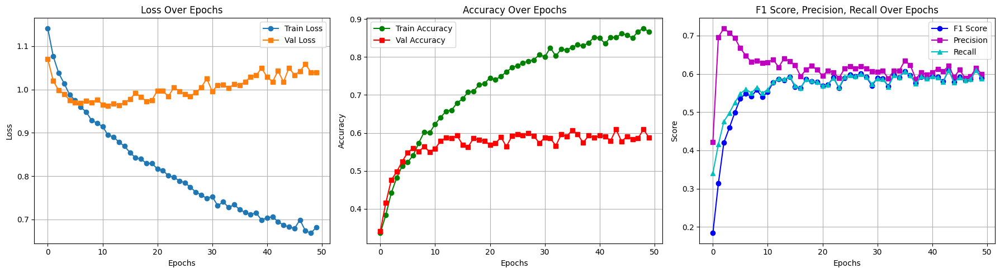

In [ ]:
best_val_accuracy = 0
best_model = None

# for train_idx, val_idx in kfold.split(X_embedd_train, y_train):
  # print(f"\n Fold {fold}")
  # fold+=1

train_dataset = StrokeDataset(X_train, y_train)
val_dataset = StrokeDataset(X_val, y_val)

print("Train dataset size: ", len(train_dataset))
print("Validation dataset size: ", len(val_dataset))

BATCH_SIZE=32

# instantiate the DataLoaders
train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)
validation_dataloader = DataLoader(
    dataset=val_dataset,
    batch_size=BATCH_SIZE
)

input_dim = X_embedd_train.shape[1]
print("Input dimension: ", input_dim)
normal_model = StrokeClassifier(
    input_size = input_dim,
    hidden_size_1 = 400,
    hidden_size_2 = 300,
    hidden_size_3 = 200,
    hidden_size_4 = 100,
    hidden_size_5 = 50,
    activation_fn = nn.LeakyReLU()
)

num_params = 0
print("Model's parameters: ")
for n, p in normal_model.named_parameters():
    print('\t', n, ': ', p.size())
    num_params += p.numel()
print("Number of model parameters: ", num_params)


optimizer = torch.optim.Adam(normal_model.parameters(), lr=0.001, weight_decay=0.0003)
normal_loss_fn = nn.CrossEntropyLoss(label_smoothing=0.2)
normal_epochs = 10

normal_model, train_losses, val_losses, train_accuracies, val_accuracies, val_scores = train(normal_model, normal_loss_fn, optimizer, 50)
plot_training_curves(
    range(len(train_losses)),
    train_losses,
    val_losses,
    train_accuracies,
    val_accuracies,
    val_scores
)

val_acc = sum(val_accuracies)/len(val_accuracies)
if val_acc > best_val_accuracy:
  best_val_accuracy = val_acc
  best_model = copy.deepcopy(normal_model)


38it [00:00, 484.92it/s]


validation labels:  390 433
validation predicted:  370 482
validation accuracy:  0.5825082508250825
precision:  0.585677835871696
recall:  0.5825082508250825
f1 score:  0.5831018859600301


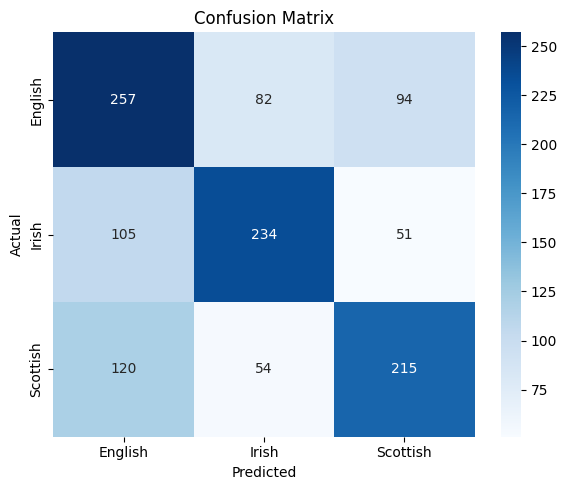

In [ ]:
test_dataset = StrokeDataset(X_embedd_test, y_test)
test_dataloader = DataLoader(
      dataset=test_dataset,
      batch_size=BATCH_SIZE
  )

final_eval(normal_model, test_dataloader, normal_loss_fn, device)

In [ ]:
X = my_df['en']
y = my_df['label']

embedding_transformer = CLSEmbeddingTransformer(model_name='bert-base-uncased')
# kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# fold=0

X_embedd = embedding_transformer.fit_transform(X)
X_embedd_train, X_embedd_test, y_train, y_test = train_test_split(X_embedd, y, test_size=0.2, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_embedd_train, y_train, test_size=0.2, random_state=42)


In [ ]:
best_val_accuracy = 0
best_model = None

# for train_idx, val_idx in kfold.split(X_embedd_train, y_train):
  # print(f"\n Fold {fold}")
  # fold+=1

train_dataset = StrokeDataset(X_train, y_train)
val_dataset = StrokeDataset(X_val, y_val)

print("Train dataset size: ", len(train_dataset))
print("Validation dataset size: ", len(val_dataset))

BATCH_SIZE=32

# instantiate the DataLoaders
train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)
validation_dataloader = DataLoader(
    dataset=val_dataset,
    batch_size=BATCH_SIZE
)

input_dim = X_embedd_train.shape[1]
print("Input dimension: ", input_dim)
normal_model = StrokeClassifier(
    input_size = input_dim,
    hidden_size_1 = 400,
    hidden_size_2 = 300,
    hidden_size_3 = 200,
    hidden_size_4 = 100,
    hidden_size_5 = 50,
    activation_fn = nn.LeakyReLU()
)

num_params = 0
print("Model's parameters: ")
for n, p in normal_model.named_parameters():
    print('\t', n, ': ', p.size())
    num_params += p.numel()
print("Number of model parameters: ", num_params)


optimizer = torch.optim.Adam(normal_model.parameters(), lr=0.001, weight_decay=0.0003)
normal_loss_fn = nn.CrossEntropyLoss(label_smoothing=0.2)
normal_epochs = 10

normal_model, train_losses, val_losses, train_accuracies, val_accuracies, val_scores = train(normal_model, normal_loss_fn, optimizer, 50)
plot_training_curves(
    range(len(train_losses)),
    train_losses,
    val_losses,
    train_accuracies,
    val_accuracies,
    val_scores
)

val_acc = sum(val_accuracies)/len(val_accuracies)
if val_acc > best_val_accuracy:
  best_val_accuracy = val_acc
  best_model = copy.deepcopy(normal_model)


In [ ]:
test_dataset = StrokeDataset(X_embedd_test, y_test)
test_dataloader = DataLoader(
      dataset=test_dataset,
      batch_size=BATCH_SIZE
  )

final_eval(normal_model, test_dataloader, normal_loss_fn, device)

# SVM



 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6815
              precision    recall  f1-score   support

           0       0.64      0.63      0.64       202
           1       0.69      0.81      0.75       202
           2       0.72      0.60      0.66       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



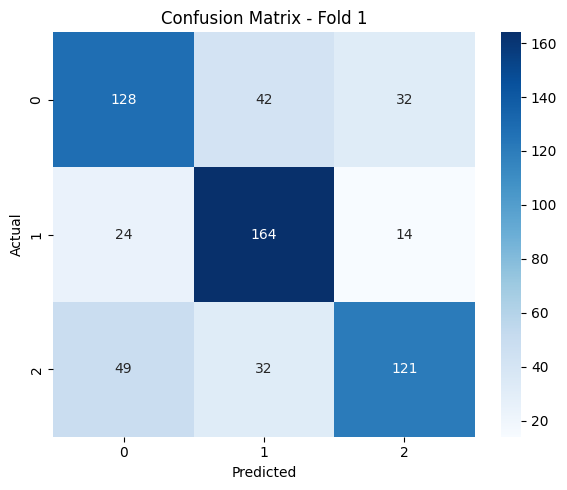


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6898
              precision    recall  f1-score   support

           0       0.63      0.71      0.67       202
           1       0.74      0.77      0.75       202
           2       0.72      0.58      0.64       202

    accuracy                           0.69       606
   macro avg       0.69      0.69      0.69       606
weighted avg       0.69      0.69      0.69       606



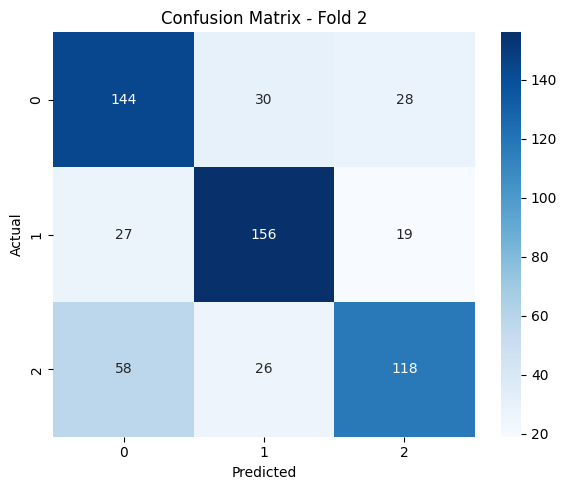


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7079
              precision    recall  f1-score   support

           0       0.67      0.70      0.68       202
           1       0.71      0.87      0.78       202
           2       0.77      0.55      0.65       202

    accuracy                           0.71       606
   macro avg       0.71      0.71      0.70       606
weighted avg       0.71      0.71      0.70       606



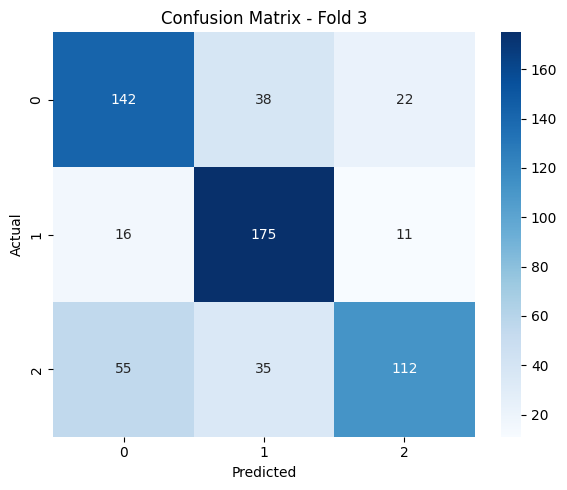


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6799
              precision    recall  f1-score   support

           0       0.64      0.61      0.63       202
           1       0.68      0.82      0.74       202
           2       0.73      0.61      0.66       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



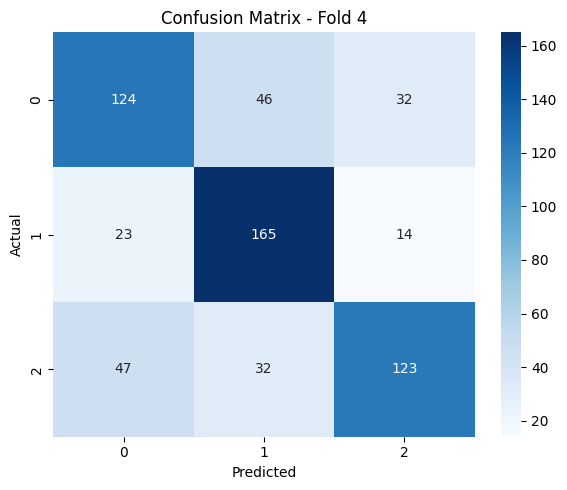


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6947
              precision    recall  f1-score   support

           0       0.66      0.71      0.69       202
           1       0.70      0.79      0.74       202
           2       0.73      0.58      0.64       202

    accuracy                           0.69       606
   macro avg       0.70      0.69      0.69       606
weighted avg       0.70      0.69      0.69       606



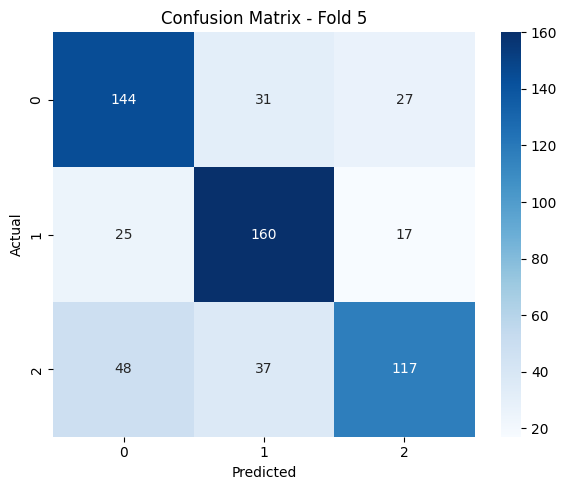


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6716
              precision    recall  f1-score   support

           0       0.61      0.66      0.63       202
           1       0.71      0.83      0.76       202
           2       0.70      0.53      0.60       202

    accuracy                           0.67       606
   macro avg       0.67      0.67      0.67       606
weighted avg       0.67      0.67      0.67       606



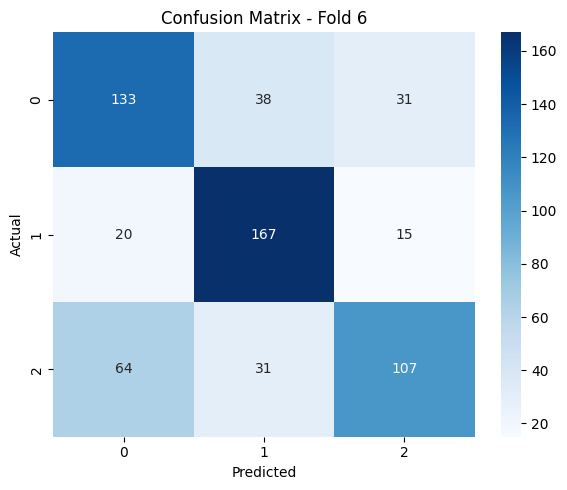


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7096
              precision    recall  f1-score   support

           0       0.67      0.72      0.70       202
           1       0.72      0.83      0.77       202
           2       0.75      0.57      0.65       202

    accuracy                           0.71       606
   macro avg       0.71      0.71      0.71       606
weighted avg       0.71      0.71      0.71       606



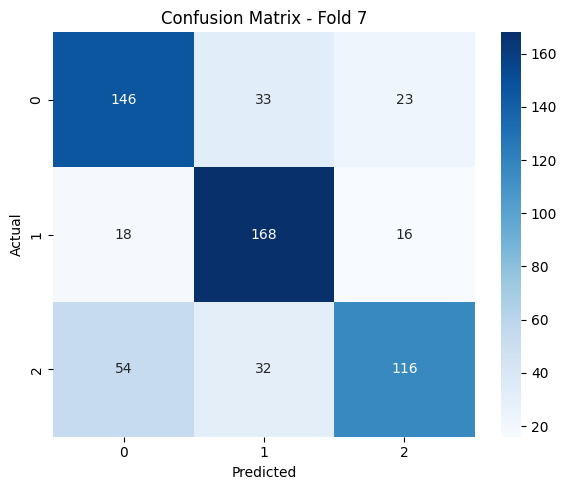


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6782
              precision    recall  f1-score   support

           0       0.63      0.72      0.67       202
           1       0.68      0.78      0.73       202
           2       0.75      0.54      0.63       202

    accuracy                           0.68       606
   macro avg       0.69      0.68      0.67       606
weighted avg       0.69      0.68      0.67       606



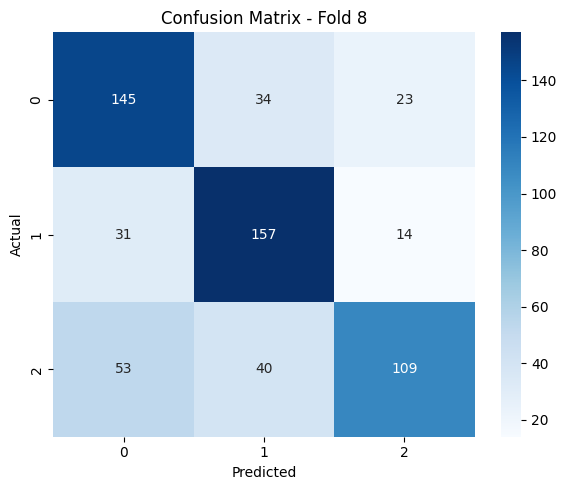


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7030
              precision    recall  f1-score   support

           0       0.65      0.69      0.67       202
           1       0.71      0.80      0.75       202
           2       0.77      0.62      0.69       202

    accuracy                           0.70       606
   macro avg       0.71      0.70      0.70       606
weighted avg       0.71      0.70      0.70       606



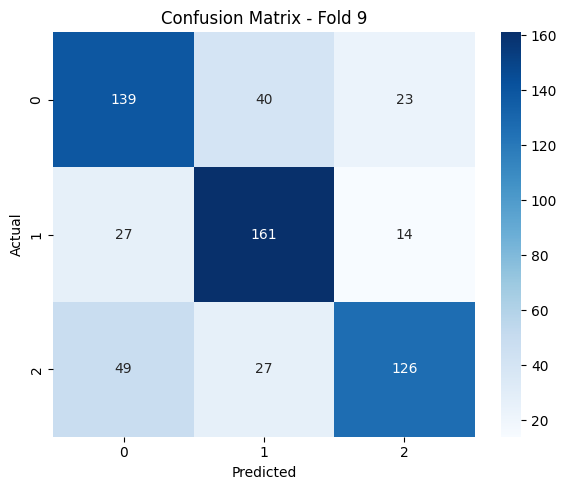


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7046
              precision    recall  f1-score   support

           0       0.66      0.73      0.69       202
           1       0.73      0.77      0.75       202
           2       0.73      0.61      0.67       202

    accuracy                           0.70       606
   macro avg       0.71      0.70      0.70       606
weighted avg       0.71      0.70      0.70       606



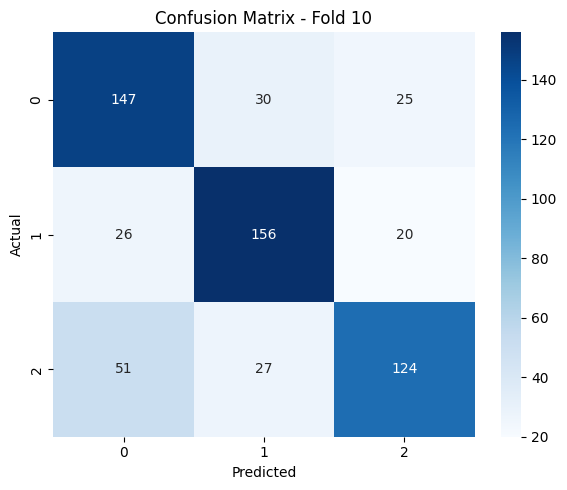


 Average Accuracy: 0.6921


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 3), tokenizer = spacy_tokenizer_all_words) # unigrams + bigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "svm"
my_f_ext_name = 'tfidf'

linear_svm_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)


In [ ]:
import pickle

with open('/content/drive/MyDrive/licenta/Models/scv_model2_pipeline.pkl', 'wb') as f:
    pickle.dump(linear_svm_pipeline, f)

print("✅ Model saved as model_pipeline.pkl.")


✅ Model saved as model_pipeline.pkl.


# Shap for linear SVC

In [ ]:
import shap
import numpy as np

# Get the fitted TF-IDF vectorizer and classifier
tfidf = linear_svm_pipeline.named_steps['tfidf']
selector = linear_svm_pipeline.named_steps['select'] # Get the SelectKBest step
clf = linear_svm_pipeline.named_steps['clf']
feature_names = tfidf.get_feature_names_out()

# Transform your test data to dense arrays (important!)
X_test_tfidf = tfidf.transform(X_test) # Keep as sparse for now
X_test_selected = selector.transform(X_test_tfidf).toarray() # Apply feature selection and convert to dense

# SHAP expects background data from the same feature space
# Apply feature selection to background data as well
background_tfidf = tfidf.transform(shap.sample(X_test, 100, random_state=42)) # Transform sample data
background_selected = selector.transform(background_tfidf).toarray() # Apply feature selection and convert to dense


# Create SHAP explainer
explainer = shap.LinearExplainer(clf, background_selected)

# Compute SHAP values for a subset of examples
# Use the data after feature selection
shap_values = explainer.shap_values(X_test_selected[:10])

<Figure size 640x480 with 0 Axes>

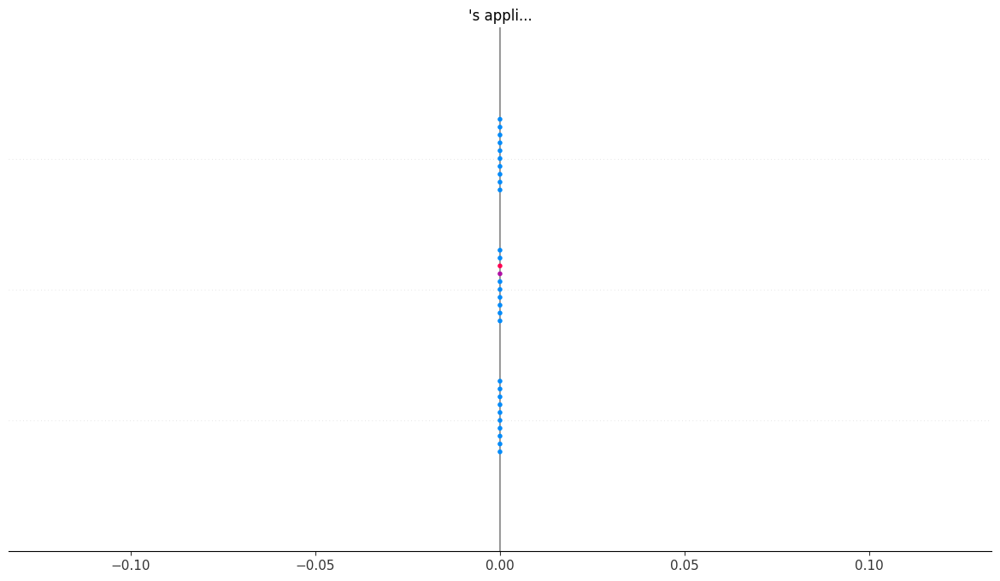

In [ ]:
# Get the fitted TF-IDF vectorizer and classifier
tfidf = linear_svm_pipeline.named_steps['tfidf']
selector = linear_svm_pipeline.named_steps['select'] # Get the SelectKBest step
clf = linear_svm_pipeline.named_steps['clf']
feature_names = tfidf.get_feature_names_out()

# Transform your test data to dense arrays (important!)
X_test_tfidf = tfidf.transform(X_test) # Keep as sparse for now
X_test_selected = selector.transform(X_test_tfidf).toarray() # Apply feature selection and convert to dense

# SHAP expects background data from the same feature space
# Apply feature selection to background data as well
background_tfidf = tfidf.transform(shap.sample(X_test, 100, random_state=42)) # Transform sample data
background_selected = selector.transform(background_tfidf).toarray() # Apply feature selection and convert to dense

# Create SHAP explainer
explainer = shap.LinearExplainer(clf, background_selected)

# Compute SHAP values for a subset of examples
# Use the data after feature selection
shap_values = explainer.shap_values(X_test_selected[:10])

# Filter feature_names to include only the selected features
selected_feature_names = feature_names[selector.get_support()]

shap.summary_plot(
    shap_values,
    features=X_test_selected[:10], # Use the data after feature selection
    feature_names=selected_feature_names # Use the filtered feature names
)

In [ ]:
import shap
X_test_tfidf = linear_svm_pipeline.named_steps['tfidf'].transform(X_test)
clf = linear_svm_pipeline.named_steps['clf']
feature_names = linear_svm_pipeline.named_steps['tfidf'].get_feature_names_out()

# Use a small background dataset for SHAP (for speed & stability)
background = X_test_tfidf[:100].toarray()

explainer = shap.LinearExplainer(clf, background, feature_perturbation="interventional")

# Compute SHAP values for some samples
shap_values = explainer.shap_values(X_test_tfidf[:10].toarray())


ValueError: shapes (3,10000) and (1187114,) not aligned: 10000 (dim 1) != 1187114 (dim 0)

In [ ]:
shap.summary_plot(shap_values, features=X_test_tfidf[:10].toarray(), feature_names=feature_names)



 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6815
              precision    recall  f1-score   support

           0       0.64      0.63      0.64       202
           1       0.69      0.81      0.75       202
           2       0.72      0.60      0.66       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



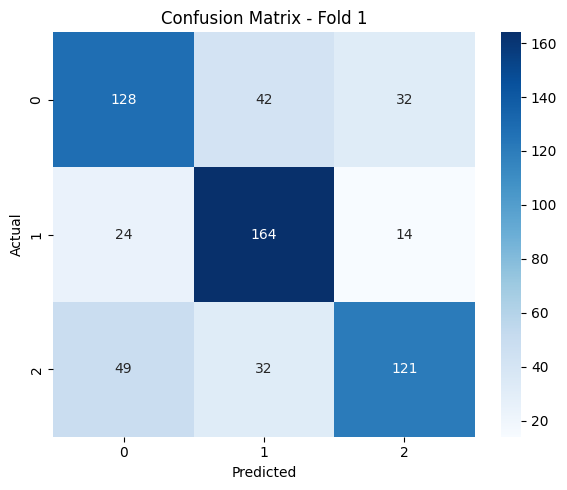


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6898
              precision    recall  f1-score   support

           0       0.63      0.71      0.67       202
           1       0.74      0.77      0.75       202
           2       0.72      0.58      0.64       202

    accuracy                           0.69       606
   macro avg       0.69      0.69      0.69       606
weighted avg       0.69      0.69      0.69       606



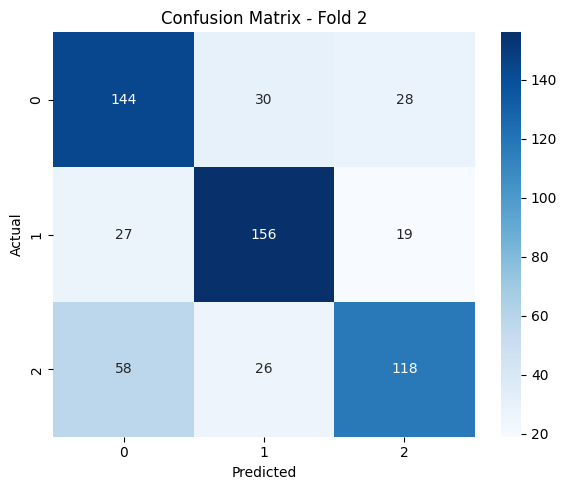


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7079
              precision    recall  f1-score   support

           0       0.67      0.70      0.68       202
           1       0.71      0.87      0.78       202
           2       0.77      0.55      0.65       202

    accuracy                           0.71       606
   macro avg       0.71      0.71      0.70       606
weighted avg       0.71      0.71      0.70       606



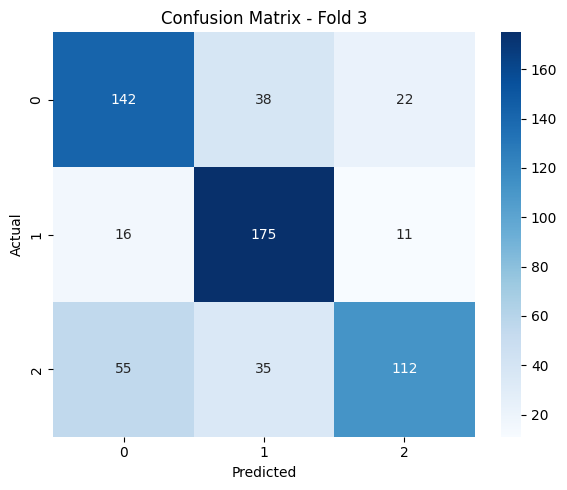


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6799
              precision    recall  f1-score   support

           0       0.64      0.61      0.63       202
           1       0.68      0.82      0.74       202
           2       0.73      0.61      0.66       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



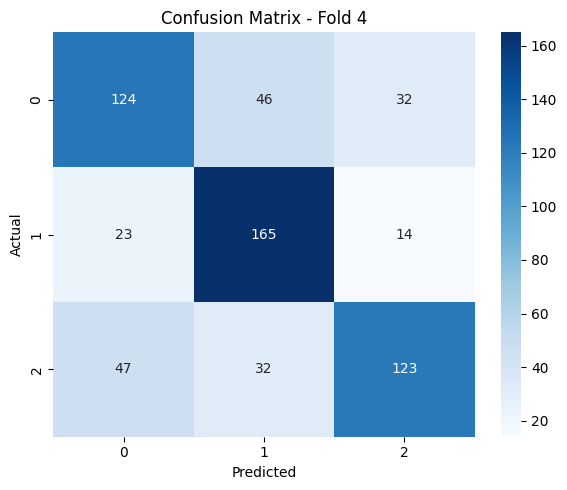


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6947
              precision    recall  f1-score   support

           0       0.66      0.71      0.69       202
           1       0.70      0.79      0.74       202
           2       0.73      0.58      0.64       202

    accuracy                           0.69       606
   macro avg       0.70      0.69      0.69       606
weighted avg       0.70      0.69      0.69       606



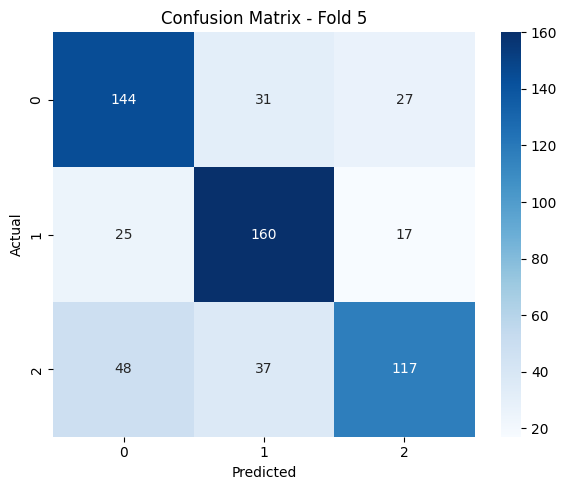


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6716
              precision    recall  f1-score   support

           0       0.61      0.66      0.63       202
           1       0.71      0.83      0.76       202
           2       0.70      0.53      0.60       202

    accuracy                           0.67       606
   macro avg       0.67      0.67      0.67       606
weighted avg       0.67      0.67      0.67       606



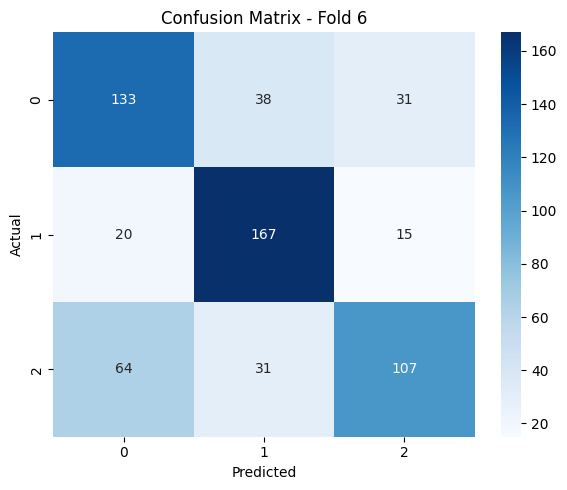


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7096
              precision    recall  f1-score   support

           0       0.67      0.72      0.70       202
           1       0.72      0.83      0.77       202
           2       0.75      0.57      0.65       202

    accuracy                           0.71       606
   macro avg       0.71      0.71      0.71       606
weighted avg       0.71      0.71      0.71       606



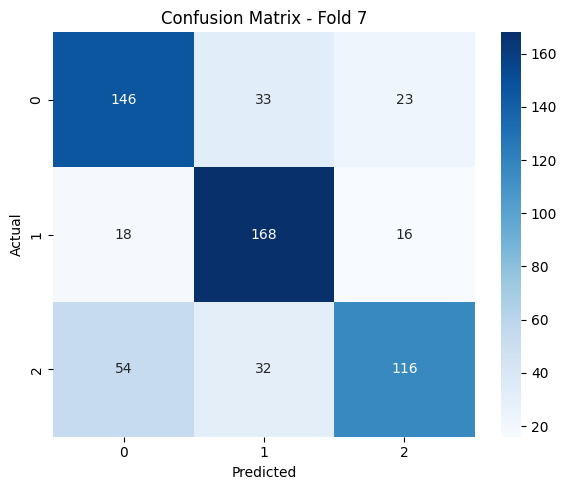


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6782
              precision    recall  f1-score   support

           0       0.63      0.72      0.67       202
           1       0.68      0.78      0.73       202
           2       0.75      0.54      0.63       202

    accuracy                           0.68       606
   macro avg       0.69      0.68      0.67       606
weighted avg       0.69      0.68      0.67       606



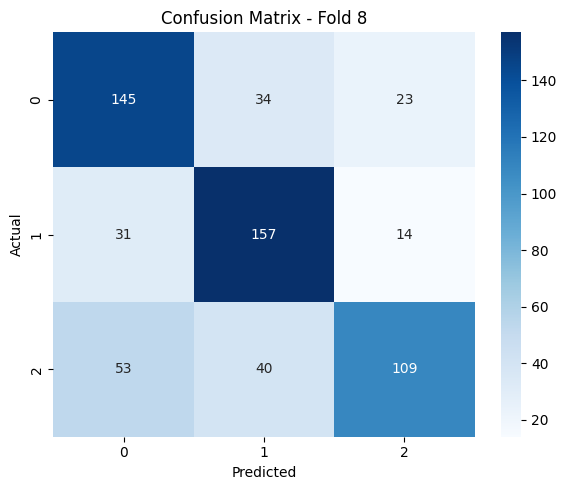


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7030
              precision    recall  f1-score   support

           0       0.65      0.69      0.67       202
           1       0.71      0.80      0.75       202
           2       0.77      0.62      0.69       202

    accuracy                           0.70       606
   macro avg       0.71      0.70      0.70       606
weighted avg       0.71      0.70      0.70       606



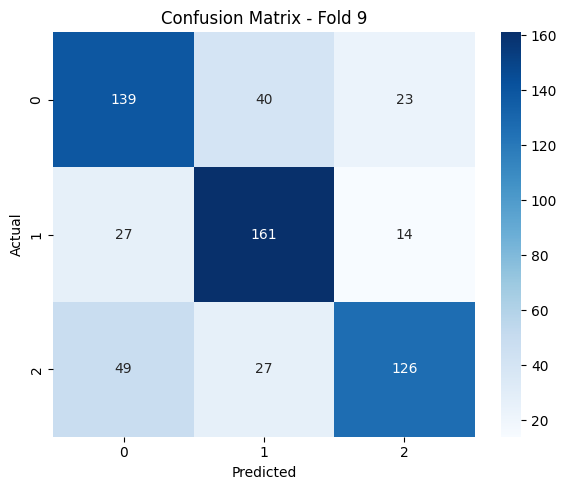


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7046
              precision    recall  f1-score   support

           0       0.66      0.73      0.69       202
           1       0.73      0.77      0.75       202
           2       0.73      0.61      0.67       202

    accuracy                           0.70       606
   macro avg       0.71      0.70      0.70       606
weighted avg       0.71      0.70      0.70       606



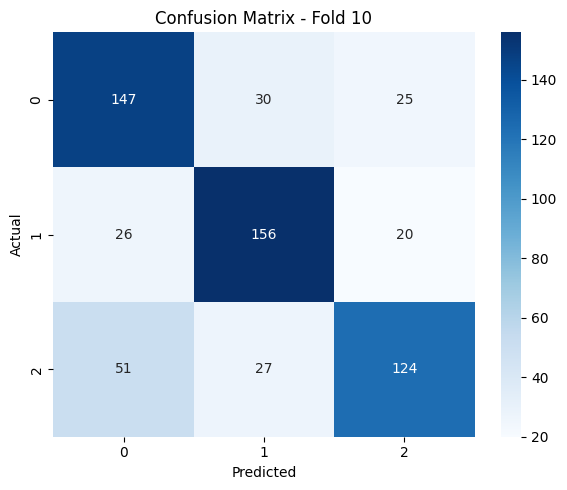


 Average Accuracy: 0.6921


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 3), tokenizer = spacy_tokenizer_all_words) # unigrams + bigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "svm"
my_f_ext_name = 'tfidf'

svm_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6650
              precision    recall  f1-score   support

           0       0.61      0.62      0.62       202
           1       0.78      0.69      0.73       202
           2       0.62      0.68      0.65       202

    accuracy                           0.67       606
   macro avg       0.67      0.67      0.67       606
weighted avg       0.67      0.67      0.67       606



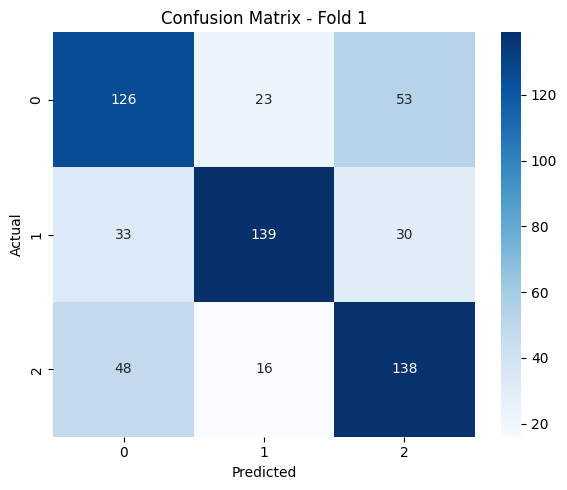


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6683
              precision    recall  f1-score   support

           0       0.59      0.68      0.63       202
           1       0.78      0.67      0.72       202
           2       0.66      0.65      0.65       202

    accuracy                           0.67       606
   macro avg       0.68      0.67      0.67       606
weighted avg       0.68      0.67      0.67       606



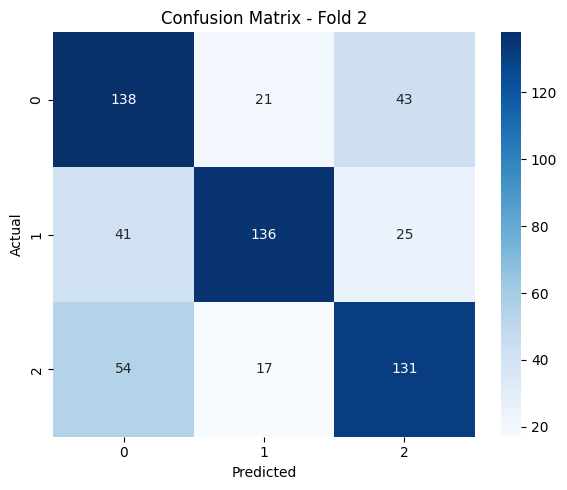


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.7030
              precision    recall  f1-score   support

           0       0.65      0.70      0.67       202
           1       0.81      0.76      0.78       202
           2       0.66      0.65      0.66       202

    accuracy                           0.70       606
   macro avg       0.71      0.70      0.70       606
weighted avg       0.71      0.70      0.70       606



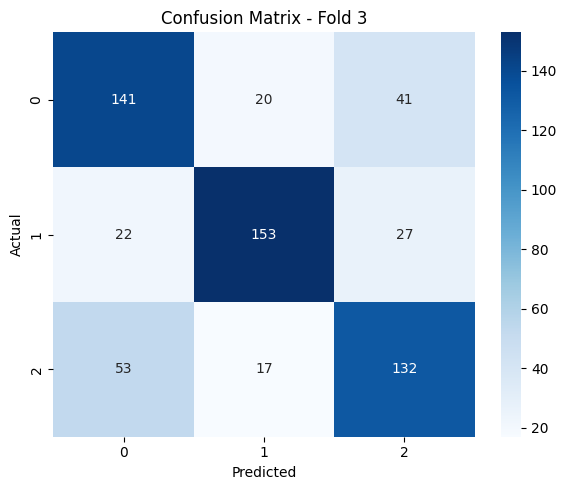


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6947
              precision    recall  f1-score   support

           0       0.67      0.68      0.67       202
           1       0.76      0.70      0.73       202
           2       0.66      0.70      0.68       202

    accuracy                           0.69       606
   macro avg       0.70      0.69      0.70       606
weighted avg       0.70      0.69      0.70       606



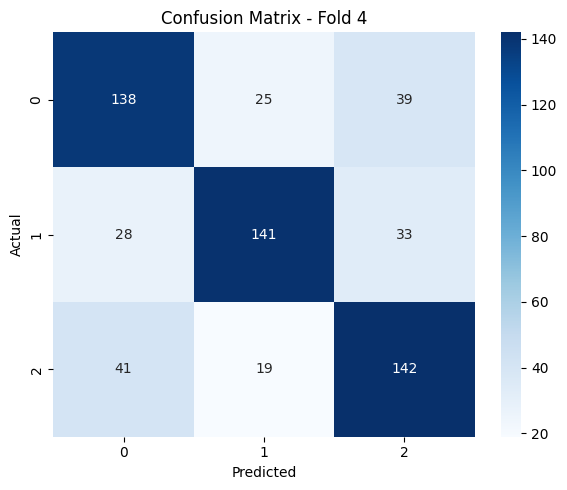


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6914
              precision    recall  f1-score   support

           0       0.65      0.73      0.69       202
           1       0.77      0.69      0.73       202
           2       0.66      0.65      0.66       202

    accuracy                           0.69       606
   macro avg       0.70      0.69      0.69       606
weighted avg       0.70      0.69      0.69       606



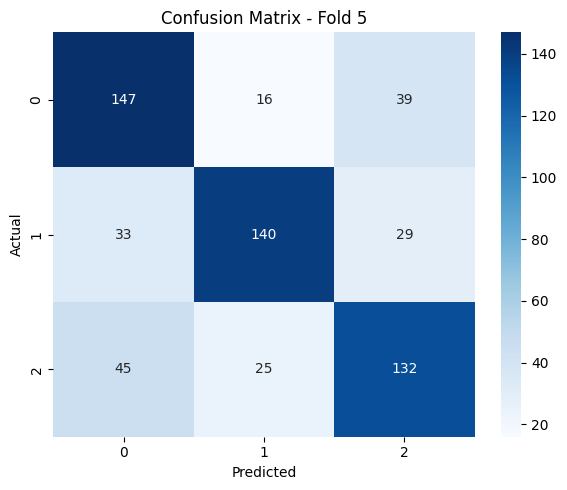


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6452
              precision    recall  f1-score   support

           0       0.57      0.62      0.59       202
           1       0.77      0.70      0.74       202
           2       0.61      0.61      0.61       202

    accuracy                           0.65       606
   macro avg       0.65      0.65      0.65       606
weighted avg       0.65      0.65      0.65       606



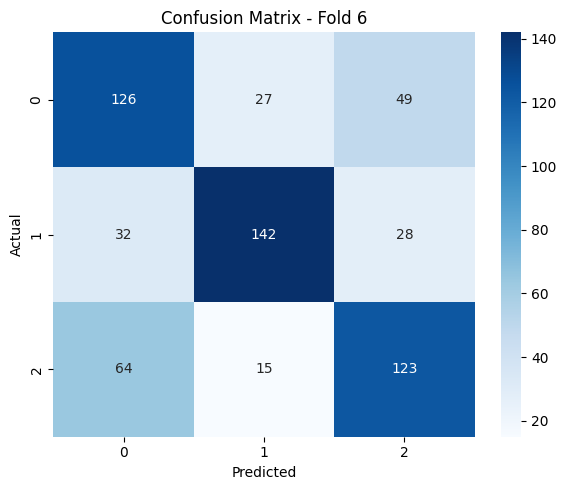


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6848
              precision    recall  f1-score   support

           0       0.62      0.69      0.65       202
           1       0.81      0.72      0.76       202
           2       0.64      0.65      0.65       202

    accuracy                           0.68       606
   macro avg       0.69      0.68      0.69       606
weighted avg       0.69      0.68      0.69       606



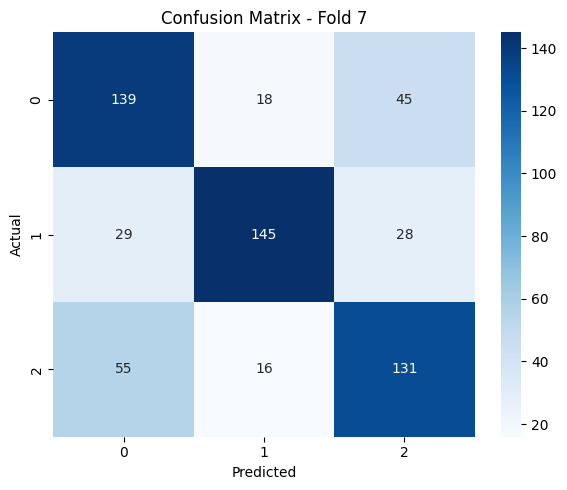


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(tokenizer = spacy_tokenizer_all_words) # unigrams + bigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "svm"
my_f_ext_name = 'tfidf'

svm_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 3), tokenizer = spacy_tokenizer_all_words) # unigrams + bigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "svm"
my_f_ext_name = 'count'

svm_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(tokenizer = spacy_tokenizer_all_words) # unigrams + bigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "svm"
my_f_ext_name = 'count'

svm_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

# Naive Bayes with TF-IDF


### Multinomial NB TFIDF bigrams- ALL WORDS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6172
              precision    recall  f1-score   support

           0       0.53      0.75      0.62       202
           1       0.65      0.78      0.71       202
           2       0.86      0.32      0.47       202

    accuracy                           0.62       606
   macro avg       0.68      0.62      0.60       606
weighted avg       0.68      0.62      0.60       606



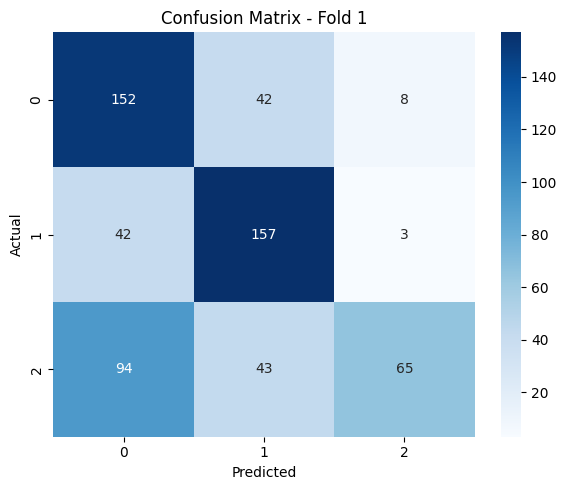


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6106
              precision    recall  f1-score   support

           0       0.51      0.80      0.63       202
           1       0.68      0.71      0.69       202
           2       0.80      0.33      0.46       202

    accuracy                           0.61       606
   macro avg       0.67      0.61      0.59       606
weighted avg       0.67      0.61      0.59       606



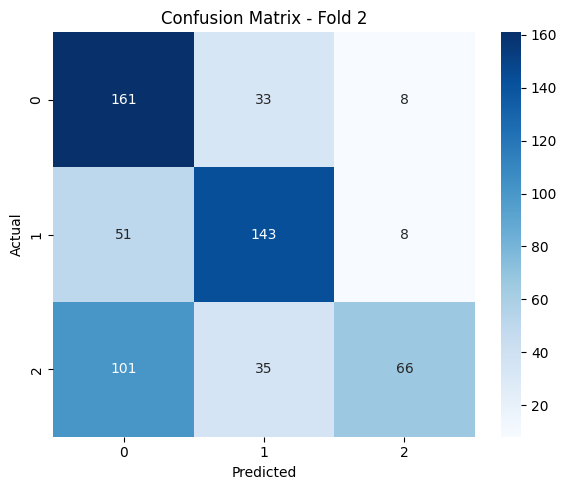


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6452
              precision    recall  f1-score   support

           0       0.57      0.78      0.66       202
           1       0.66      0.80      0.72       202
           2       0.85      0.35      0.50       202

    accuracy                           0.65       606
   macro avg       0.69      0.65      0.63       606
weighted avg       0.69      0.65      0.63       606



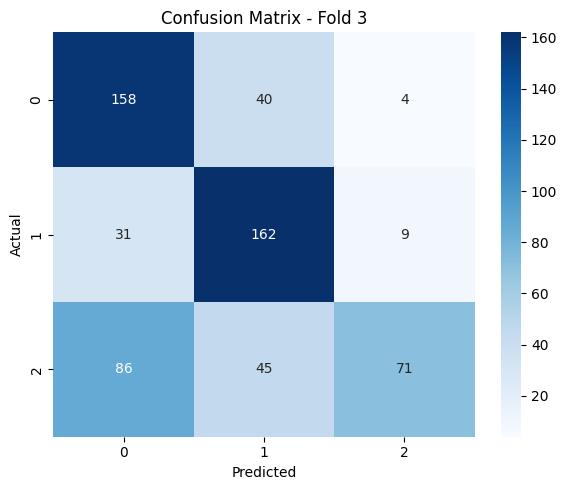


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6370
              precision    recall  f1-score   support

           0       0.57      0.73      0.64       202
           1       0.64      0.82      0.72       202
           2       0.85      0.36      0.50       202

    accuracy                           0.64       606
   macro avg       0.68      0.64      0.62       606
weighted avg       0.68      0.64      0.62       606



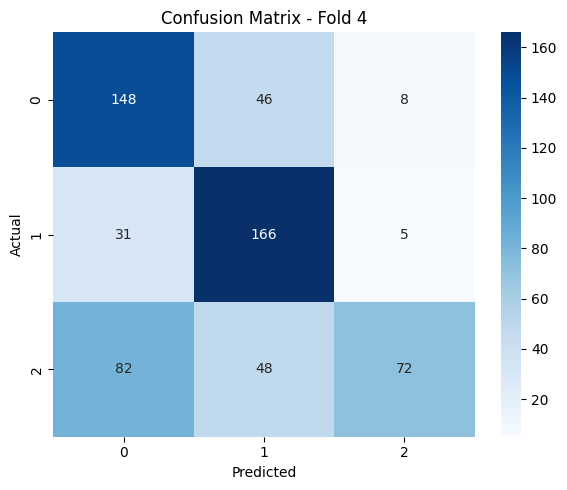


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6172
              precision    recall  f1-score   support

           0       0.55      0.79      0.65       202
           1       0.65      0.75      0.69       202
           2       0.79      0.31      0.45       202

    accuracy                           0.62       606
   macro avg       0.66      0.62      0.60       606
weighted avg       0.66      0.62      0.60       606



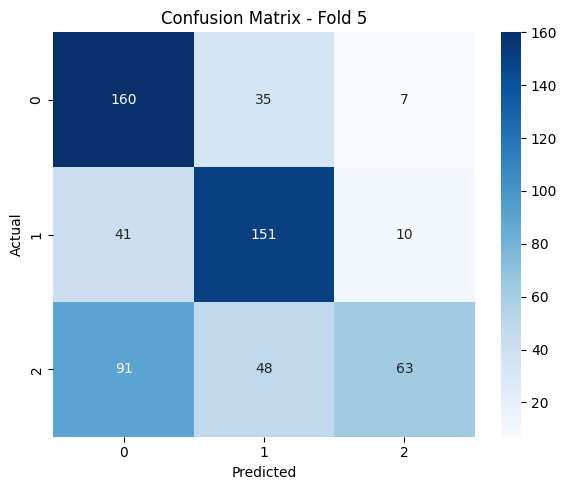


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5990
              precision    recall  f1-score   support

           0       0.51      0.71      0.59       202
           1       0.64      0.81      0.72       202
           2       0.82      0.27      0.41       202

    accuracy                           0.60       606
   macro avg       0.66      0.60      0.57       606
weighted avg       0.66      0.60      0.57       606



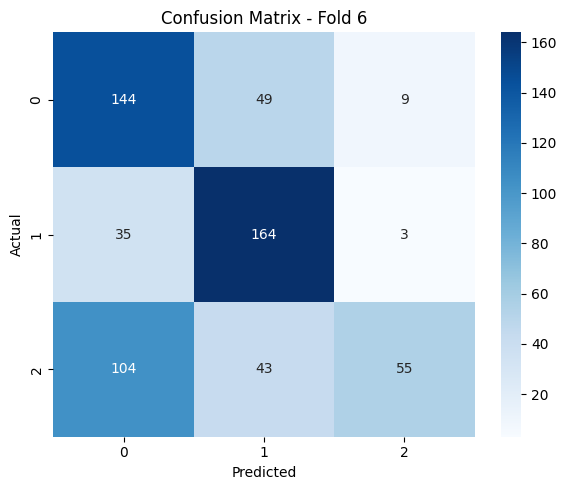


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6452
              precision    recall  f1-score   support

           0       0.56      0.77      0.65       202
           1       0.68      0.82      0.75       202
           2       0.81      0.34      0.48       202

    accuracy                           0.65       606
   macro avg       0.69      0.65      0.63       606
weighted avg       0.69      0.65      0.63       606



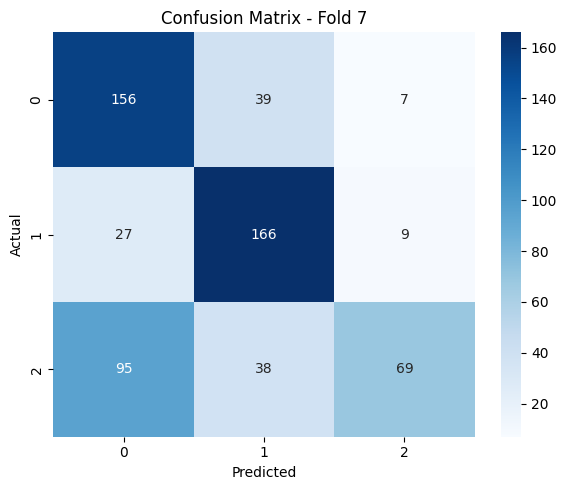


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6056
              precision    recall  f1-score   support

           0       0.52      0.73      0.61       202
           1       0.64      0.80      0.71       202
           2       0.85      0.29      0.43       202

    accuracy                           0.61       606
   macro avg       0.67      0.61      0.58       606
weighted avg       0.67      0.61      0.58       606



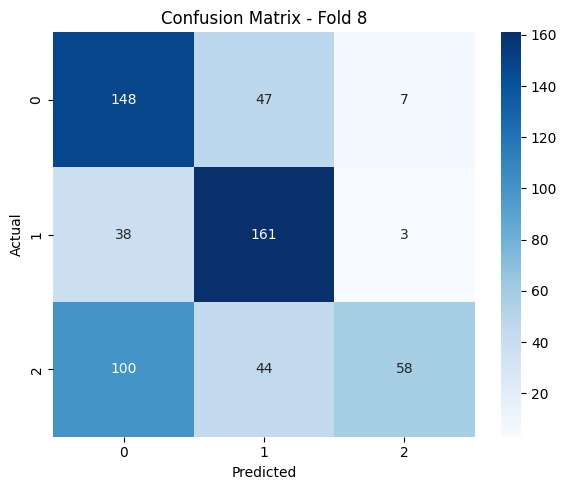


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6485
              precision    recall  f1-score   support

           0       0.56      0.73      0.63       202
           1       0.67      0.81      0.73       202
           2       0.85      0.41      0.55       202

    accuracy                           0.65       606
   macro avg       0.69      0.65      0.64       606
weighted avg       0.69      0.65      0.64       606



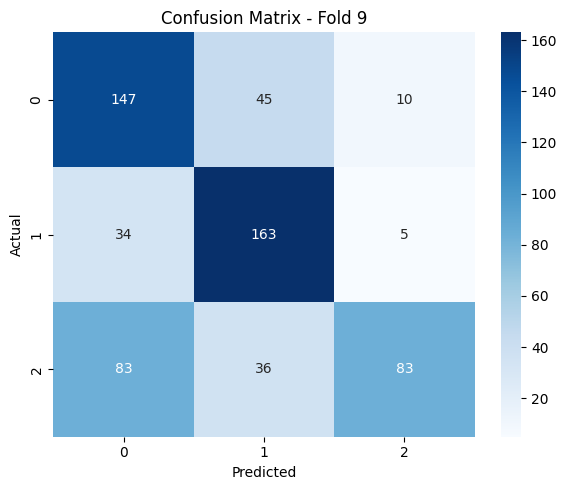


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6535
              precision    recall  f1-score   support

           0       0.57      0.85      0.68       202
           1       0.71      0.76      0.73       202
           2       0.82      0.35      0.49       202

    accuracy                           0.65       606
   macro avg       0.70      0.65      0.63       606
weighted avg       0.70      0.65      0.63       606



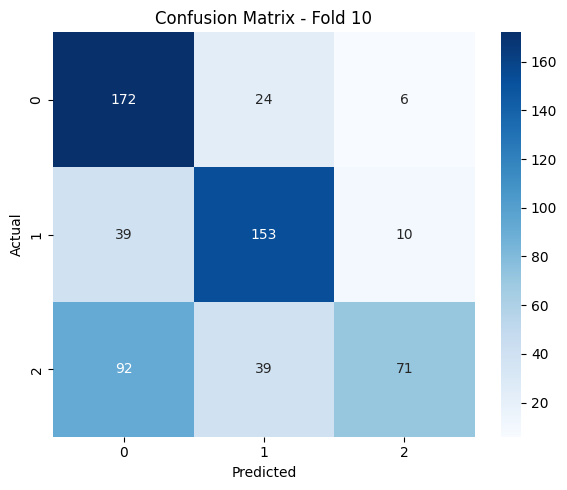


 Average Accuracy: 0.6279


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 3), tokenizer = spacy_tokenizer_all_words) # unigrams + bigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "multinomial"
my_f_ext_name = 'tfidf'

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

In [ ]:
explain_pipeline(multinomial_pipeline)

Text 1: Mr President, I should like to begin by congratulating Mr Lechner on his report and on the way in which he introduced it to this House. The point that he made very clearly is one which I believe to be very important - that this piece of legislation is one of a larger series of pieces of legislation which are going to regulate electronic commerce. That clearly is going to be very significant, not only for Europe, but for business round the whole world.In this context I should like to use my time to flag up one particular concern I have about the possible impact of the proposed - if I can use the horrid word - "Amsterdamised" versions of the Brussels and Rome Treaties relating to the operation of this part of the single market. As I understand the position, they may pose a serious threat to the market inasmuch as a number of the provisions look as if they will cut across the country of origin principle which, as the House knows, is the basis on which the single market is founded.

Text 2: I would like to thank you for your various answers here tonight. You referred to the Euratom regulations and directives a number of times, but the Euratom Treaty might as well be on the planet Zorg for all the democratic control that we have on it in this Union. It should have been reviewed well before now and incorporated into the Maastricht Treaty or gotten rid of totally.Would you confirm that the Dutch presidency has amendments to the Euratom Treaty on the table at the moment, during the IGC process and that it will look at those amendments and/or institute a review of the Euratom Treaty itself during the IGC negotiations?
True Label: 1
Predicted Label: 1


Text 3: Madam President, I would like to speak on the Commission communication on Europe's maritime future. I am sure you will agree, Madam President, that since 'all the nice girls love a sailor' , it is important that we nurture and support our maritime industries and, in particular, the seafarers and their training for which I would like to think that the British Government has set a positive example.I would like to throw down a challenge to Commissioner Bangemann and his colleagues today. We must ensure a level playing field throughout the European Union. I would urge the Commission to make sure that state aids to ports and ferry companies are phased out as far as possible. Currently there is no transparency in the application of state aids. I hope the Commissioner will agree that he must address this and that it cannot be right that, for example, Stena/Sealink are actually making British seafarers redundant because the Dutch government, as Mr Jarzembowski mentioned earlier, is cho

Text 4: Madam President, my Group welcomes some of the changes that have been made in this report insofar as a distinction is now being made between money for fishing rights and money for development. This should be applied to all fisheries agreements and not just this one. We feel that we need a clear separation with regard to what the money is there for.In development, the money would go to surveillance and scientific analysis etc., and there should also be the possibility of an audit of how the money is spent. There is a major vacuum here in that European taxpayers' money goes to fund these fisheries agreements without the possibility of looking to see how the money has been spent, particularly when it is in the area of development and surveillance. We – and European citizens – would like to see guarantees that this is where this money is going, rather than taking it at face value. In many cases I do not believe that we have a guarantee that the money has gone where we expect it to 

Text 5: Madam President, I would also like to congratulate Mr Bontempi on his report. In the context of this debate, I am taking the opportunity to raise what is, mercifully, still a relatively small area of activity which has in recent years been criminalized. I refer in this case to the transnational abduction of children by their parents and also the increasing problem of transnational abduction of children by criminal means.The fact that we are dealing here very often with delicate family matters is very often used by local police forces as an excuse not to become involved in these cases - that these are family matters and should be left to the lawyers to sort out. But behind the reluctance of police forces to implement court orders on the custody of children in one country when they are abducted into another Member State, very often lies the potential for great tragedy.Two weeks ago I spent the entire weekend and most of the week trying to negotiate for the handover of children wh

Text 6: on behalf of the ECR Group. - Mr President, I hope that I am proved to be wrong, but it looks to me increasingly unlikely that the talks begun and continued at Copenhagen will, in fact, lead to a legally binding treaty committing all of the major emitters in the world to large emission cuts.In those circumstances, I believe it would be very foolish for those of us in the EU debating these matters to agree to even further emissions reductions. A figure of 30% has been mentioned. Mrs Hassi just mentioned 40%.In the absence of a worldwide agreement, I think we would be crazy to agree to further reductions because what we will do is run the risk of saddling our consumers with some of the highest energy bills in the developed world, making European heavy industry and large energy consumers particularly uncompetitive in a worldwide environment.Already we have seen a lot of industry relocating to outside the EU, simply, of course, transferring emissions from the EU to China, India and

Text 7: Madam President, after the daylight drama that we had in Mr Cabrol's last report on the tobacco advertising ban, it is sad to be back to the late shift for health workers in this Parliament tonight. I find it rather ironic that we have been relegated to this time, given that the Commission rates this network on communicable diseases as one of the most important pieces of the post-Maastricht health framework, and also that the UK presidency gave its successful completion at conciliation a particularly high priority.Nevertheless, the work of Mr Cabrol in bringing some complex negotiations to a conclusion deserves a wider audience and our congratulations, as well as the vote of approval which it will undoubtedly achieve tomorrow, with the full support of my group.At second reading some formidable obstacles remained to be cleared. Principally those related to the budget - which seems to be a perennial health risk -, to the questions of external frontier control responsibility and, 

Text 8: . I welcome this proposed Directive on measures for the control of avian influenza. The proposed Directive aims to update EU measures based on lessons learned from recent epidemic scares and new scientific knowledge on how the disease spreads and risks to human health. The existing directive only establishes control measures against the 'highly pathogenic' avian influenza viruses, i.e. those causing major disease outbreaks in poultry and that may also occasionally infect humans.However, there is evidence that these highly pathogenic viruses actually originate from the so-called 'low - pathogenic' avian influenza viruses as a result of virus mutation. In order to prevent major avian influenza outbreaks, the new legislation would also establish compulsory surveillance and control measures against the low pathogenic avian influenza viruses that can be transmitted to domestic poultry from wild birds, such as ducks and geese. The low pathogenic viruses cannot be eradicated from wild

Text 9: . I registered an abstention on the final vote on the Berman report. As a vegetarian, I have strong reservations about the whole meat production business. If the business of rearing livestock for meat continues, and I accept that it will, then I very much believe it should be organic and natural. Failing that, standards must be as high as possible.
True Label: 0
Predicted Label: 0


Text 10: Mr President, I think it is a terrible shame that a so-called civilized country like the United States has to be criticized in this Parliament. It considers itself the moral police force of the world and yet it carries out the most appalling crime, basically a crime against humanity, in imposing the death sentence. I agree totally with the last speaker about the fact that a woman is being sentenced to death on 3 February. I call on the Americans and on the Texas authorities to commute her sentence and to put a stay on her execution. It is unacceptable that such a punishment is carried out in a country that considers itself advanced.It is quite clear that this form of punishment is not a deterrent to crime. In fact if you look at the rising crime figures in the United States it is clear that such an abhorrent punishment does not work and it is about time the Americans actually realised that they are way behind the rest of the international community and cannot point the finger 

Text 11: Mr President, I want to start by offering my congratulations to my colleague, Mr Paasilinna. I know how much careful preparation and extensive consultation has gone into his report. I commend him on it.Colleagues, it is normal when considering issues like this to look to the future. But I want to illustrate my own comments on Mr Paasilinna's work and the Commission proposals by looking to the past, to a book written by Mark Twain called 'A Connecticut Yankee at the Court of King Arthur'. The Connecticut Yankee was a telephone engineer in America who sustained a blow to his head and was transported back to the time of King Arthur. He used his skills and knowledge to intervene in the wars of that time, mainly to save his own skin - it has to be said - rather than from any philanthropic designs. He understood from his own practical experience the importance of access to networks and services. He knew, as does Mr Paasilinna, that these proposals are not just about technology, they

Text 12: Madam President, we live in a global environment and many of our political problems are tackled within a multilateral framework. This is clearly, therefore, the structure we should use in addressing global problems such as poverty.I welcome – as most people do – the recent initiative by the G8 to implement further the process of debt relief for the Third World. This is only right and proper, as debt relief is presently crippling many countries in the Third World. The Highly Indebted Poor Countries Initiative achieved moderate success in tackling debt relief for the 42 poorest countries in the world, but this was only an initial effort by the developed world to tackle the problem of debt relief itself. The European Union is the largest contributor of development aid in the world and therefore must continue to show real leadership when it comes to addressing humanitarian and development aid problems in the world.I also believe that the WTO is the best structure to open up compet

Text 13: Madam President, on the same point of order that Mr Duff raised earlier, the roll-call vote has just shown that we are not quorate, so therefore, under the same rules, I would like to ask for the quorum to be established and I call on Members to support me by standing.(19 Members rose)President. The request is withdrawn.Relating to Amendment No 10
True Label: 0
Predicted Label: 0


Text 14: Mr President, firstly I would like to congratulate the rapporteur on a piece of very good work. I believe we now have a reasonable decision from conciliation. It is a sensible and workable decision, through which we have limited the scope of this directive. However, we will still ensure that workers exposed to optical radiation will be fully protected and that their health and safety will be looked after.As far as natural radiation is concerned, risks must be pointed out and reasonable precautions must be taken, but Member States should have the responsibility for drawing up the action plan, and that should give legal certainty to workers and employers in different countries. However powerful we may consider ourselves to be in this Parliament, we cannot legislate for sunshine or rain across 25 Member States. In Ireland, partly because of our own inaction and through our own fault, we currently have a nitrates directive based on rainfall, weather and climate, which is totally u

Text 15: Mr President, I should like to begin by congratulating Mr Lechner on his report and on the way in which he introduced it to this House. The point that he made very clearly is one which I believe to be very important - that this piece of legislation is one of a larger series of pieces of legislation which are going to regulate electronic commerce. That clearly is going to be very significant, not only for Europe, but for business round the whole world.In this context I should like to use my time to flag up one particular concern I have about the possible impact of the proposed - if I can use the horrid word - "Amsterdamised" versions of the Brussels and Rome Treaties relating to the operation of this part of the single market. As I understand the position, they may pose a serious threat to the market inasmuch as a number of the provisions look as if they will cut across the country of origin principle which, as the House knows, is the basis on which the single market is founded

Text 16: Mr President, on behalf of the British Conservatives and the rest of the PPE-DE Group I would like to say that we strongly support the compromise set out in the von Wogau report and reiterated by Mr Prodi this morning. Parliament has secured significant concessions on transparency, on consultation and on oversight. Parliament's rapporteur is to be congratulated for securing those. Parliament should also express its appreciation to Mr Bolkestein and his staff, and to the Commission, for responding to the concerns that we raised about these matters. Mr von Wogau deserves much praise for drawing to a conclusion the lengthy negotiations that we have had on this important issue.We in Parliament have taken a pragmatic approach. This is a workable interim solution pending final resolution of the whole matter of delegated legislation in 2004, when Parliament could and should ask for a legally binding call-back mechanism, which is desirable but, sadly, not permissible within the terms 

Text 17: Mr President, thankfully we live in a Community where the weapons of war these days are economic rather than military. It is important that we seize the opportunity to get our economies together to prevent future conflict. It is a bit like the difference between nuclear fusion and nuclear fission. We all know that nuclear fission is an inherently dangerous process, as indeed is a fission in our economies. But if we were able to achieve the economic equivalent of nuclear fusion and fuse our economies together, we all know that the benefits would be great and that we would produce a lot of economic energy through a growth in trade on our continent and a lot more jobs, which is so important.I belong to a tradition of a party in Great Britain which has always believed in the United Kingdom's full participation in economic and monetary union. Indeed, one of the more eminent members of my party, Mr Roy Jenkins, in his time as President of the Commission, was one of the main proponen

Text 18: Mr President, fraud is not merely a financial crime which cheats the European budget and the European taxpayer. It is increasingly a cancer in the body politic of the European Union. In my opinion it is disproportionately eroding our credibility with European citizens and provides opponents of the Union and national governments alike with an easy alibi on which they can blame all evils. Citizens have a greater negative image from the allegations of the incidence of fraud than for any other reason. That is why these reports we are debating this morning are so important.I should first like to congratulate Mrs Wemheuer on her excellent report. It sets out quite clearly and pragmatically the intention to work with the Commission in the new culture which is very evident in the Commission to take the fight against fraud more seriously now than perhaps has historically been the case. It adds some very sensible, pragmatic proposals as to the sort of things that ought to happen in the 

Text 19: in writing. - I voted for this report, which is a simple piece of housekeeping updating the existing agreement to take into account the accession of Bulgaria and Romania. The proposal has no impact on the EU budget and is uncontroversial.
True Label: 2
Predicted Label: 2


Text 20: . This report is an essential element of the financial services industry, bringing together internationally agreed banking rules.The Labour Group has supported the work undertaken by the rapporteur and services of Parliament to ensure that the European Parliament maintains its legal/political powers. To this effect, the EPLP can support the measures introduced to enable the right of call-back and sunset clauses contained within this directive, which is not an imposition on national powers.
True Label: 0
Predicted Label: 0


### Multinomial TFIDF with unigrams- ALL WORDS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6188
              precision    recall  f1-score   support

           0       0.55      0.71      0.62       202
           1       0.62      0.79      0.70       202
           2       0.82      0.36      0.50       202

    accuracy                           0.62       606
   macro avg       0.66      0.62      0.60       606
weighted avg       0.66      0.62      0.60       606



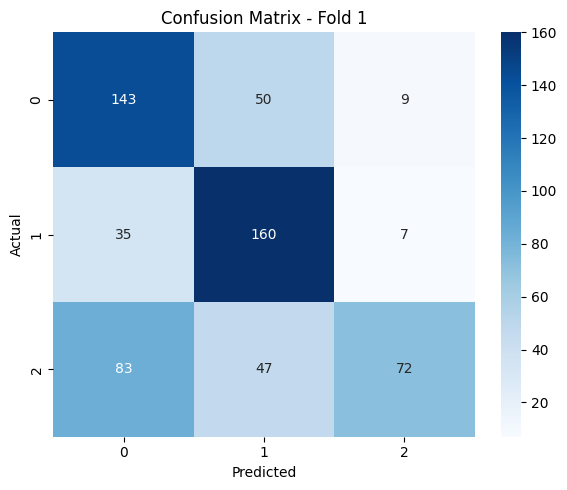


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5660
              precision    recall  f1-score   support

           0       0.52      0.74      0.61       202
           1       0.56      0.68      0.61       202
           2       0.76      0.28      0.41       202

    accuracy                           0.57       606
   macro avg       0.61      0.57      0.54       606
weighted avg       0.61      0.57      0.54       606



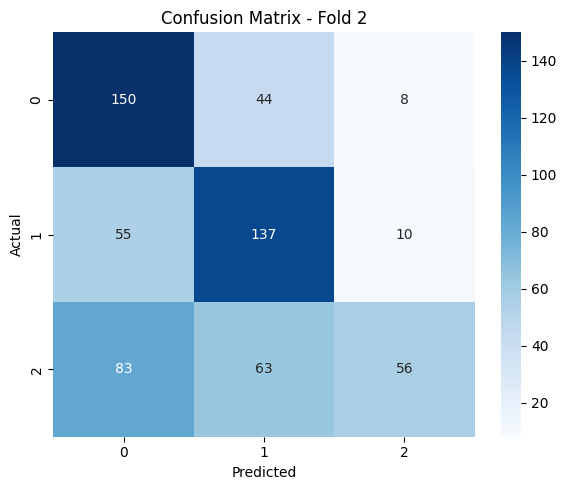


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6337
              precision    recall  f1-score   support

           0       0.59      0.76      0.66       202
           1       0.62      0.79      0.70       202
           2       0.81      0.35      0.49       202

    accuracy                           0.63       606
   macro avg       0.67      0.63      0.62       606
weighted avg       0.67      0.63      0.62       606



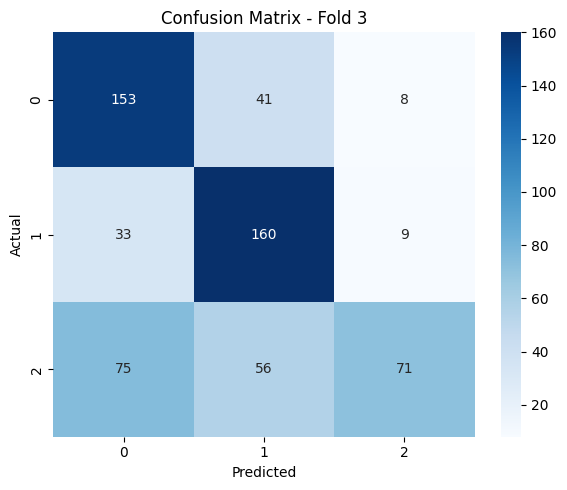


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6271
              precision    recall  f1-score   support

           0       0.56      0.76      0.64       202
           1       0.64      0.77      0.70       202
           2       0.83      0.35      0.49       202

    accuracy                           0.63       606
   macro avg       0.68      0.63      0.61       606
weighted avg       0.68      0.63      0.61       606



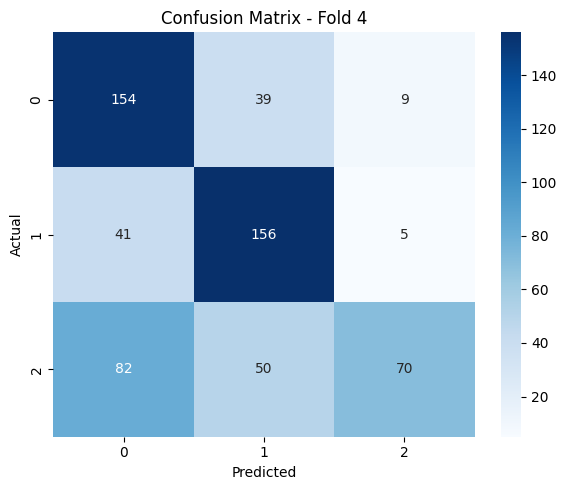


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5891
              precision    recall  f1-score   support

           0       0.56      0.75      0.64       202
           1       0.58      0.74      0.65       202
           2       0.74      0.27      0.40       202

    accuracy                           0.59       606
   macro avg       0.63      0.59      0.56       606
weighted avg       0.63      0.59      0.56       606



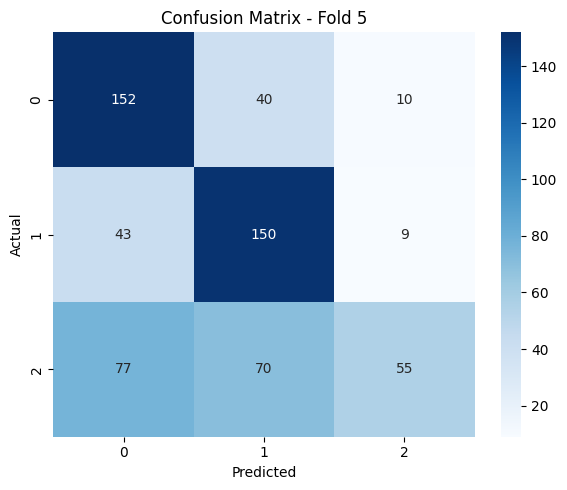


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5677
              precision    recall  f1-score   support

           0       0.48      0.71      0.58       202
           1       0.62      0.75      0.68       202
           2       0.75      0.24      0.37       202

    accuracy                           0.57       606
   macro avg       0.62      0.57      0.54       606
weighted avg       0.62      0.57      0.54       606



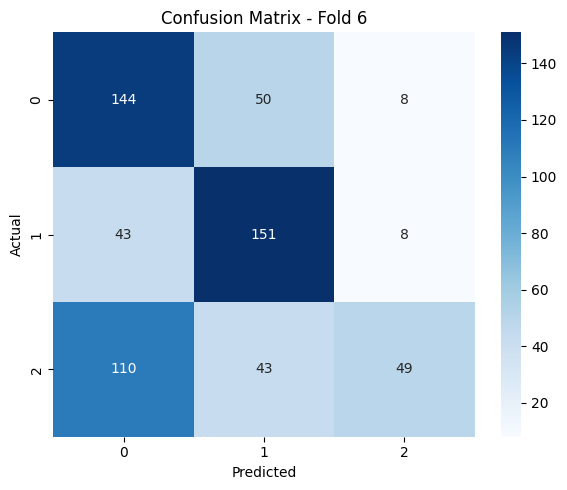


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6271
              precision    recall  f1-score   support

           0       0.56      0.74      0.64       202
           1       0.64      0.79      0.71       202
           2       0.80      0.35      0.49       202

    accuracy                           0.63       606
   macro avg       0.67      0.63      0.61       606
weighted avg       0.67      0.63      0.61       606



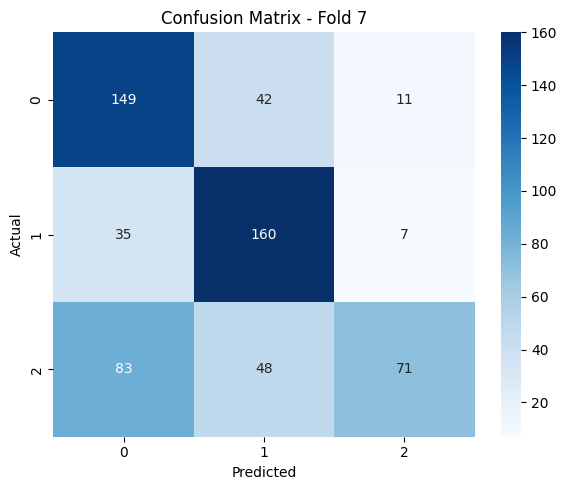


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5776
              precision    recall  f1-score   support

           0       0.51      0.63      0.56       202
           1       0.57      0.78      0.66       202
           2       0.86      0.32      0.47       202

    accuracy                           0.58       606
   macro avg       0.64      0.58      0.56       606
weighted avg       0.64      0.58      0.56       606



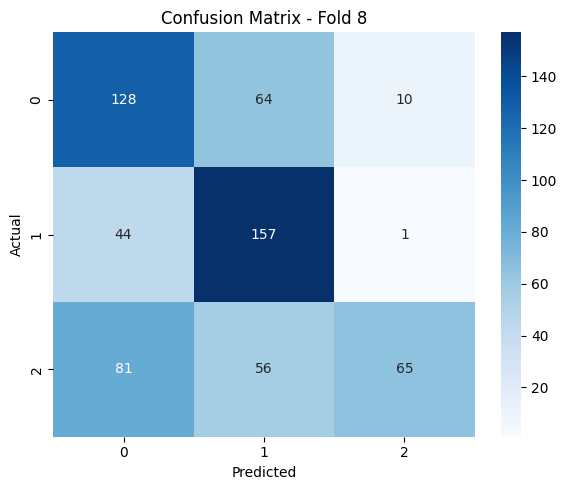


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6040
              precision    recall  f1-score   support

           0       0.55      0.71      0.62       202
           1       0.59      0.75      0.66       202
           2       0.80      0.35      0.49       202

    accuracy                           0.60       606
   macro avg       0.65      0.60      0.59       606
weighted avg       0.65      0.60      0.59       606



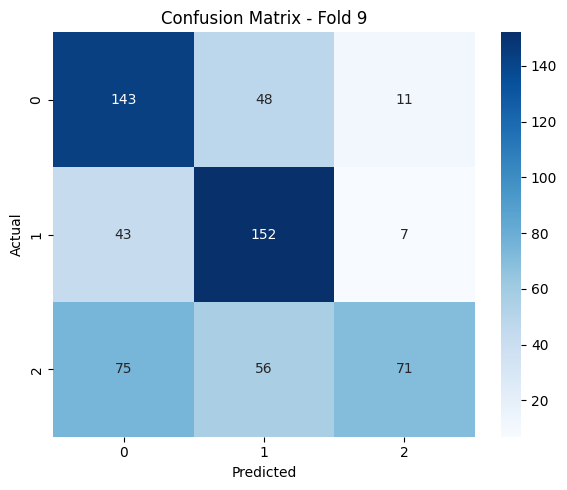


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6485
              precision    recall  f1-score   support

           0       0.59      0.84      0.69       202
           1       0.67      0.75      0.71       202
           2       0.79      0.36      0.49       202

    accuracy                           0.65       606
   macro avg       0.68      0.65      0.63       606
weighted avg       0.68      0.65      0.63       606



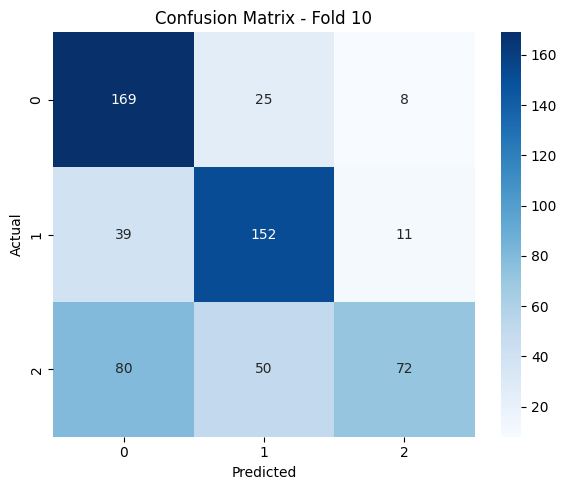


 Average Accuracy: 0.6059


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 1), tokenizer = spacy_tokenizer_all_words) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "multinomial"
my_f_ext_name = 'tfidf'

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

### Multinomial TFIDF with unigrams- NO STOPWORDS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6188
              precision    recall  f1-score   support

           0       0.58      0.63      0.60       202
           1       0.59      0.82      0.69       202
           2       0.77      0.41      0.53       202

    accuracy                           0.62       606
   macro avg       0.65      0.62      0.61       606
weighted avg       0.65      0.62      0.61       606



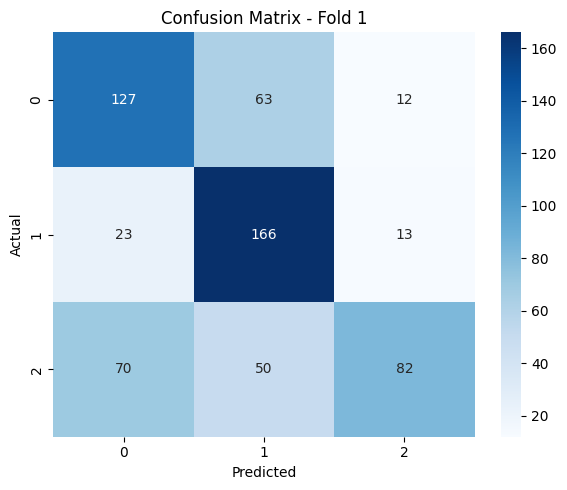


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5759
              precision    recall  f1-score   support

           0       0.54      0.69      0.61       202
           1       0.55      0.68      0.61       202
           2       0.72      0.35      0.47       202

    accuracy                           0.58       606
   macro avg       0.61      0.58      0.56       606
weighted avg       0.61      0.58      0.56       606



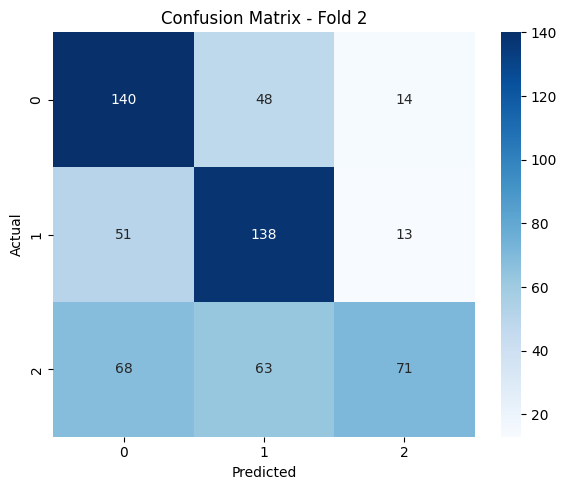


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 1), tokenizer = spacy_tokenizer_without_stopwords) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "multinomial"
my_f_ext_name = 'tfidf'

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

### Multinomial TFIDF with unigrams- JUST STOPWORDS

In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 1), tokenizer = spacy_tokenizer_only_stopwords) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "multinomial"
my_f_ext_name = 'tfidf'

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

### Multinomial CountVEctorizer unigrams- ALL WORDS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6452
              precision    recall  f1-score   support

           0       0.59      0.66      0.62       202
           1       0.67      0.69      0.68       202
           2       0.69      0.58      0.63       202

    accuracy                           0.65       606
   macro avg       0.65      0.65      0.65       606
weighted avg       0.65      0.65      0.65       606



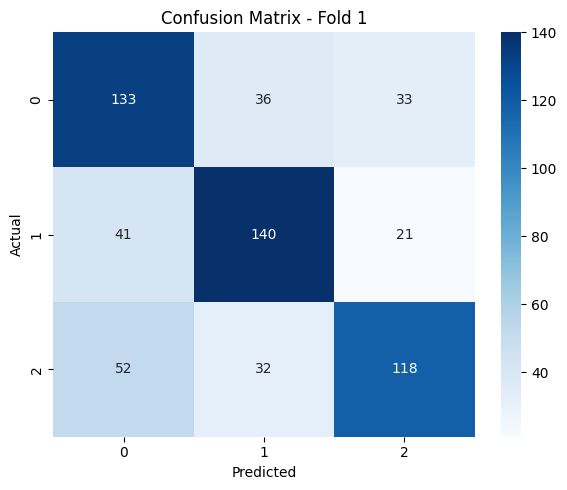


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6056
              precision    recall  f1-score   support

           0       0.54      0.70      0.61       202
           1       0.66      0.63      0.64       202
           2       0.64      0.49      0.56       202

    accuracy                           0.61       606
   macro avg       0.62      0.61      0.60       606
weighted avg       0.62      0.61      0.60       606



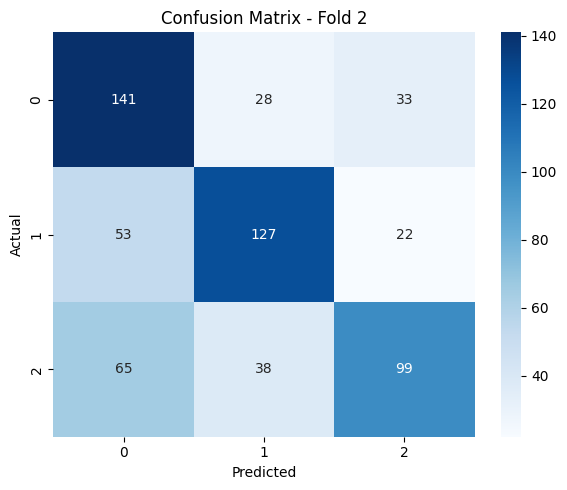


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6584
              precision    recall  f1-score   support

           0       0.63      0.74      0.68       202
           1       0.69      0.71      0.70       202
           2       0.65      0.52      0.58       202

    accuracy                           0.66       606
   macro avg       0.66      0.66      0.66       606
weighted avg       0.66      0.66      0.66       606



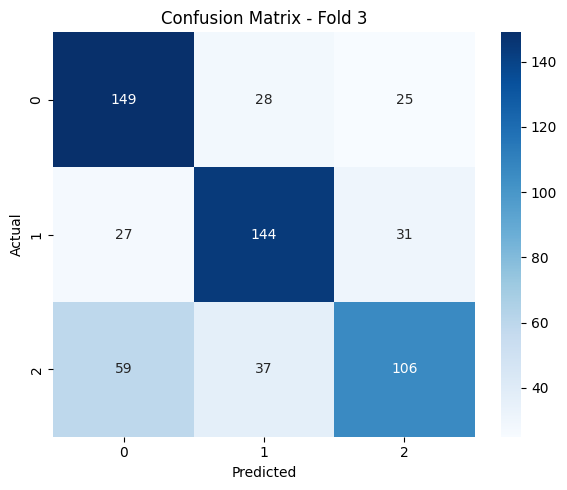


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6551
              precision    recall  f1-score   support

           0       0.58      0.70      0.64       202
           1       0.70      0.68      0.69       202
           2       0.70      0.58      0.64       202

    accuracy                           0.66       606
   macro avg       0.66      0.66      0.66       606
weighted avg       0.66      0.66      0.66       606



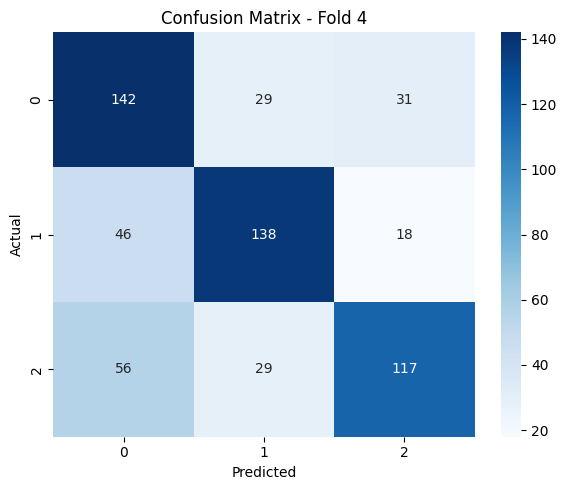


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6221
              precision    recall  f1-score   support

           0       0.58      0.70      0.63       202
           1       0.68      0.66      0.67       202
           2       0.62      0.50      0.56       202

    accuracy                           0.62       606
   macro avg       0.63      0.62      0.62       606
weighted avg       0.63      0.62      0.62       606



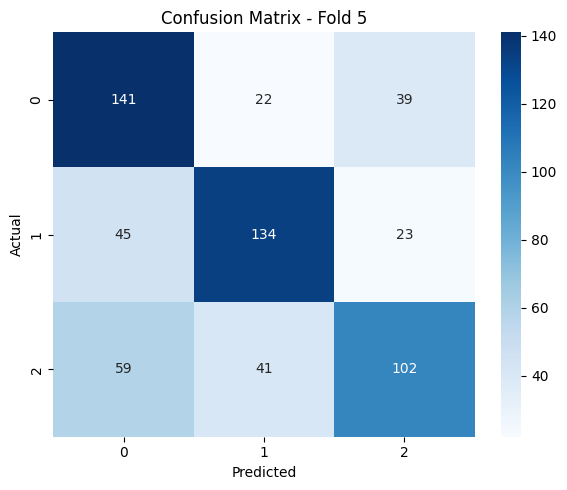


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6007
              precision    recall  f1-score   support

           0       0.53      0.69      0.60       202
           1       0.68      0.59      0.63       202
           2       0.63      0.52      0.57       202

    accuracy                           0.60       606
   macro avg       0.61      0.60      0.60       606
weighted avg       0.61      0.60      0.60       606



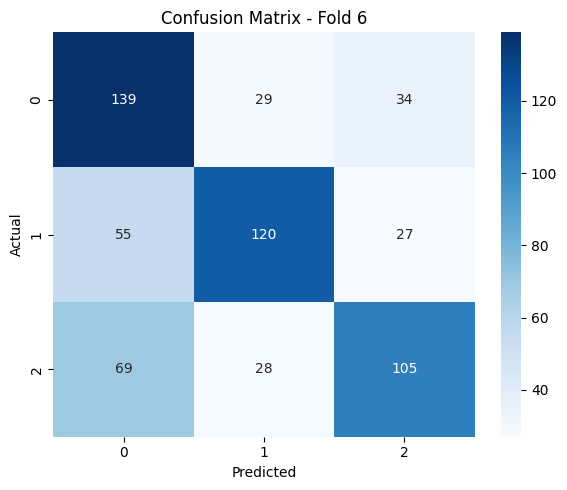


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6353
              precision    recall  f1-score   support

           0       0.58      0.68      0.63       202
           1       0.70      0.72      0.71       202
           2       0.64      0.50      0.57       202

    accuracy                           0.64       606
   macro avg       0.64      0.64      0.63       606
weighted avg       0.64      0.64      0.63       606



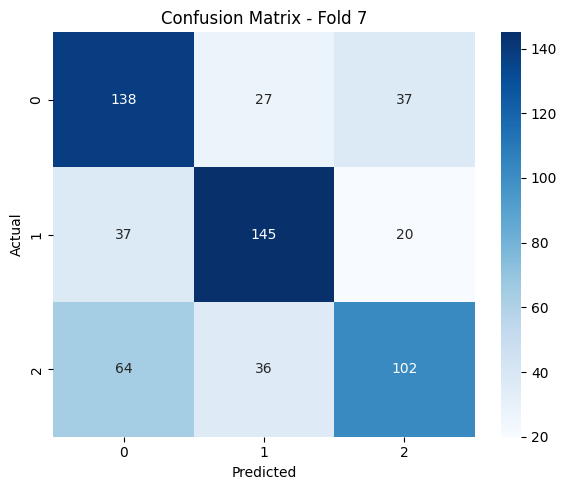


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6254
              precision    recall  f1-score   support

           0       0.55      0.66      0.60       202
           1       0.68      0.69      0.68       202
           2       0.68      0.52      0.59       202

    accuracy                           0.63       606
   macro avg       0.63      0.63      0.62       606
weighted avg       0.63      0.63      0.62       606



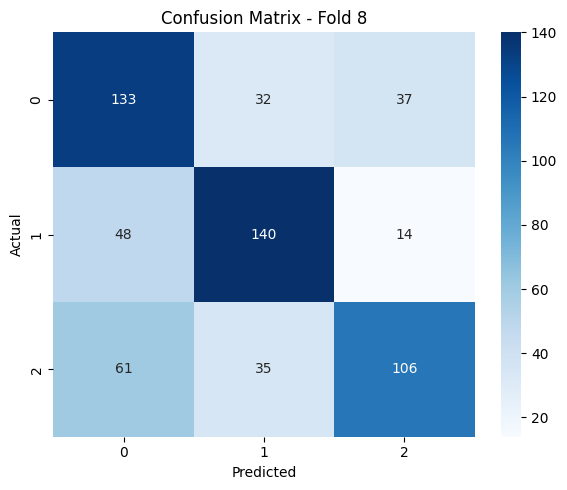


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6271
              precision    recall  f1-score   support

           0       0.55      0.66      0.60       202
           1       0.67      0.65      0.66       202
           2       0.68      0.56      0.62       202

    accuracy                           0.63       606
   macro avg       0.64      0.63      0.63       606
weighted avg       0.64      0.63      0.63       606



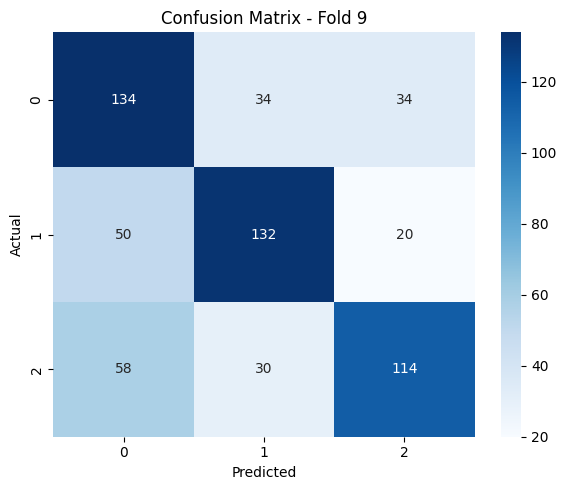


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6452
              precision    recall  f1-score   support

           0       0.59      0.78      0.67       202
           1       0.73      0.65      0.69       202
           2       0.64      0.50      0.56       202

    accuracy                           0.65       606
   macro avg       0.65      0.65      0.64       606
weighted avg       0.65      0.65      0.64       606



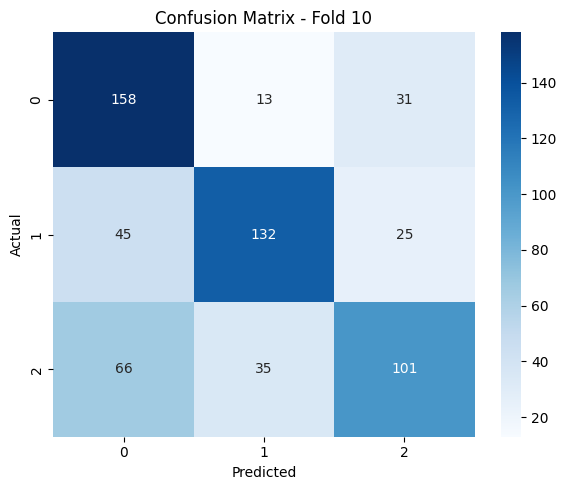


 Average Accuracy: 0.6320


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = CountVectorizer(ngram_range=(1, 1), tokenizer = spacy_tokenizer_all_words) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "multinomial"
my_f_ext_name = 'count'

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

### Multinomial Count Vectorizer Bigrams- ALL WORDS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6518
              precision    recall  f1-score   support

           0       0.59      0.71      0.64       202
           1       0.73      0.65      0.69       202
           2       0.67      0.59      0.63       202

    accuracy                           0.65       606
   macro avg       0.66      0.65      0.65       606
weighted avg       0.66      0.65      0.65       606



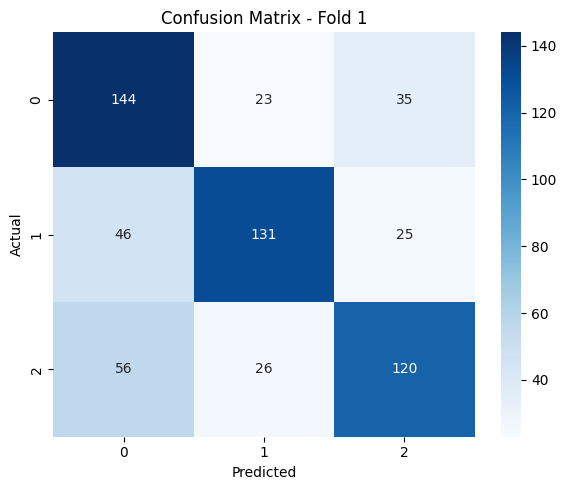


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6766
              precision    recall  f1-score   support

           0       0.60      0.77      0.67       202
           1       0.76      0.65      0.70       202
           2       0.71      0.61      0.65       202

    accuracy                           0.68       606
   macro avg       0.69      0.68      0.68       606
weighted avg       0.69      0.68      0.68       606



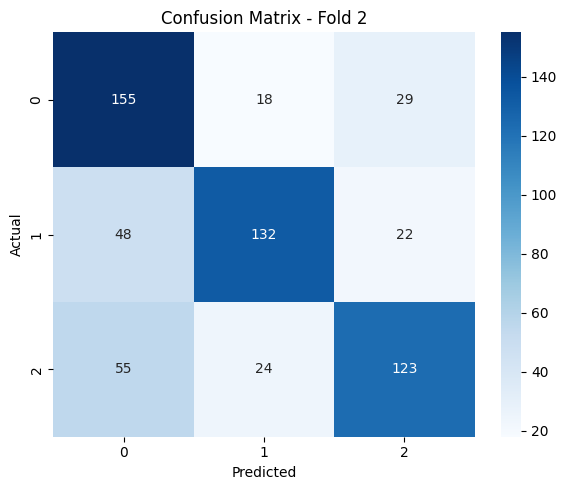


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6898
              precision    recall  f1-score   support

           0       0.62      0.74      0.68       202
           1       0.78      0.69      0.73       202
           2       0.68      0.63      0.66       202

    accuracy                           0.69       606
   macro avg       0.70      0.69      0.69       606
weighted avg       0.70      0.69      0.69       606



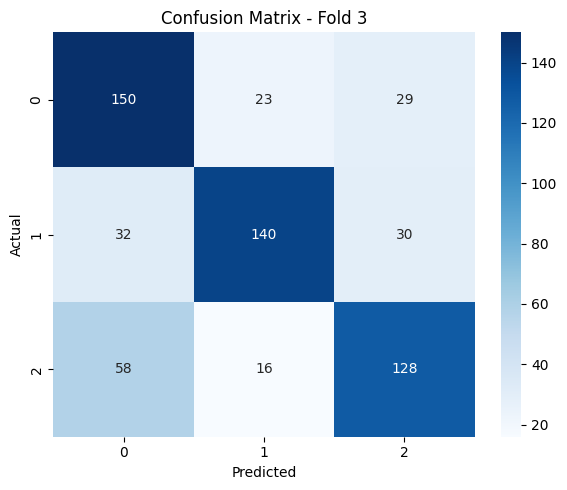


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6865
              precision    recall  f1-score   support

           0       0.64      0.67      0.66       202
           1       0.76      0.74      0.75       202
           2       0.67      0.65      0.66       202

    accuracy                           0.69       606
   macro avg       0.69      0.69      0.69       606
weighted avg       0.69      0.69      0.69       606



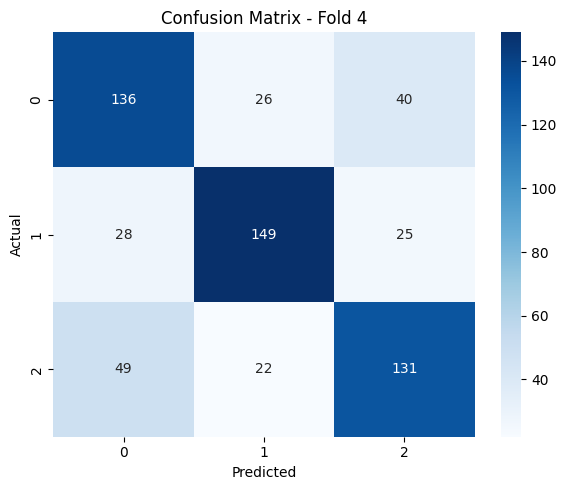


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6683
              precision    recall  f1-score   support

           0       0.61      0.74      0.67       202
           1       0.73      0.67      0.70       202
           2       0.68      0.59      0.63       202

    accuracy                           0.67       606
   macro avg       0.67      0.67      0.67       606
weighted avg       0.67      0.67      0.67       606



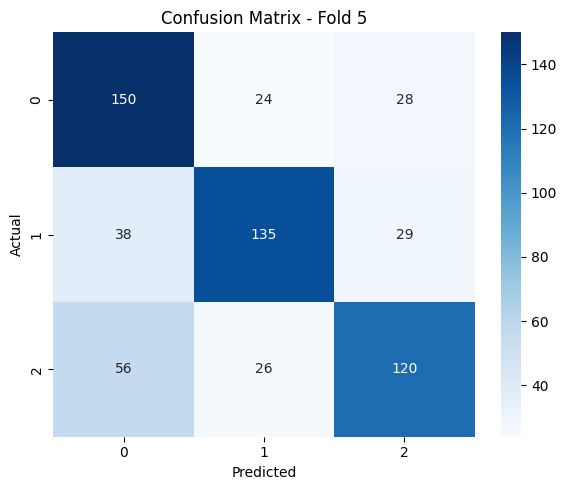


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6617
              precision    recall  f1-score   support

           0       0.57      0.73      0.64       202
           1       0.79      0.66      0.72       202
           2       0.67      0.59      0.63       202

    accuracy                           0.66       606
   macro avg       0.68      0.66      0.66       606
weighted avg       0.68      0.66      0.66       606



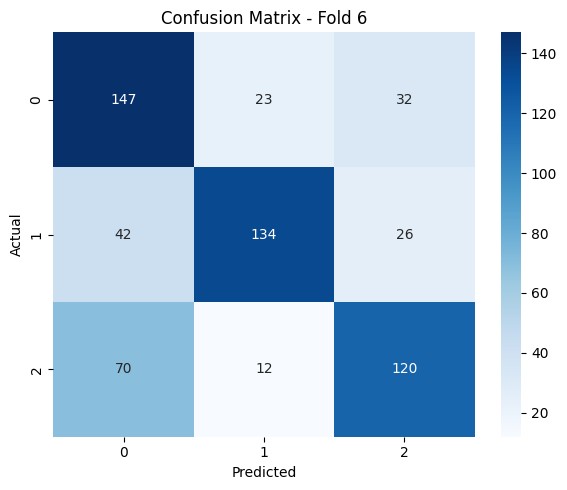


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6782
              precision    recall  f1-score   support

           0       0.61      0.67      0.64       202
           1       0.79      0.75      0.77       202
           2       0.65      0.61      0.63       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



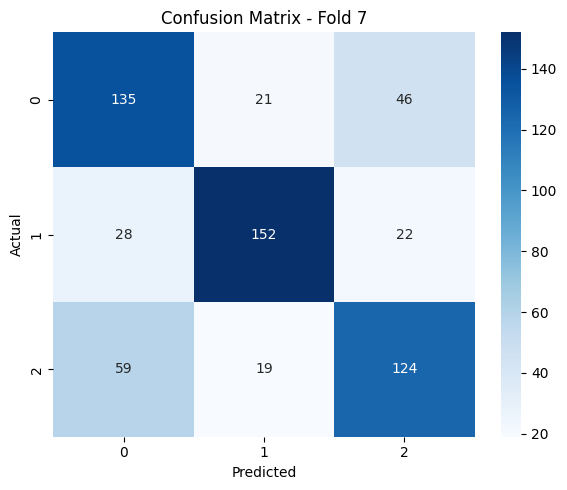


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6782
              precision    recall  f1-score   support

           0       0.59      0.73      0.65       202
           1       0.77      0.71      0.74       202
           2       0.71      0.59      0.65       202

    accuracy                           0.68       606
   macro avg       0.69      0.68      0.68       606
weighted avg       0.69      0.68      0.68       606



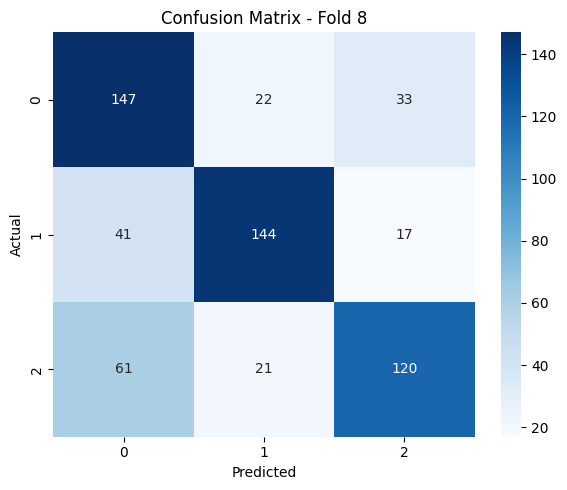


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6683
              precision    recall  f1-score   support

           0       0.60      0.71      0.65       202
           1       0.73      0.65      0.69       202
           2       0.70      0.65      0.67       202

    accuracy                           0.67       606
   macro avg       0.68      0.67      0.67       606
weighted avg       0.68      0.67      0.67       606



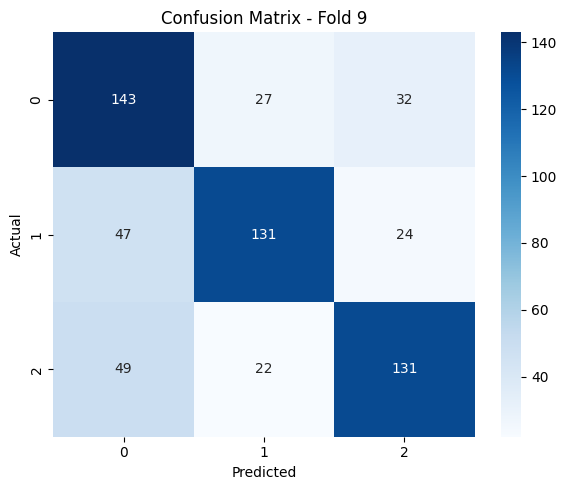


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6947
              precision    recall  f1-score   support

           0       0.62      0.81      0.70       202
           1       0.82      0.66      0.73       202
           2       0.70      0.61      0.65       202

    accuracy                           0.69       606
   macro avg       0.71      0.69      0.69       606
weighted avg       0.71      0.69      0.69       606



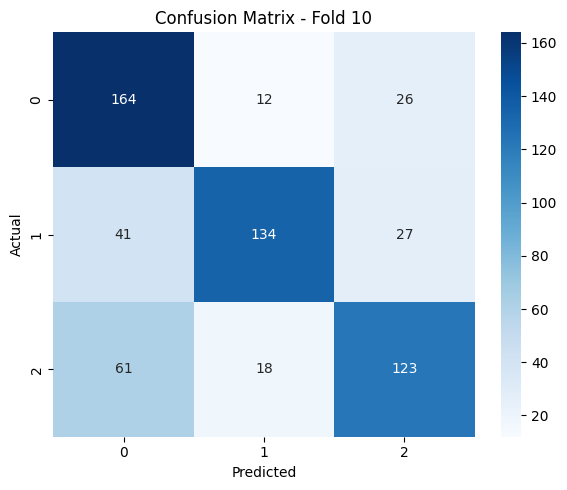


 Average Accuracy: 0.6754


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = CountVectorizer(ngram_range=(1, 3), tokenizer = spacy_tokenizer_all_words) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "multinomial"
my_f_ext_name = 'count'

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)

### Multinomial NB with embeddings

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]


 Fold 1
✅ Accuracy: 0.5050
              precision    recall  f1-score   support

           0       0.44      0.50      0.47       202
           1       0.60      0.53      0.56       202
           2       0.49      0.49      0.49       202

    accuracy                           0.50       606
   macro avg       0.51      0.50      0.51       606
weighted avg       0.51      0.50      0.51       606



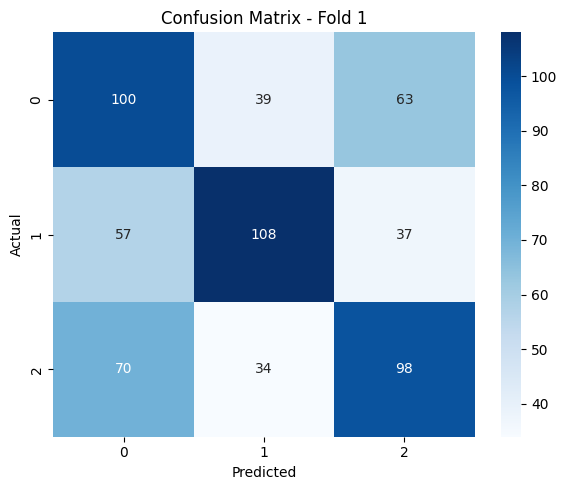


 Fold 2
✅ Accuracy: 0.5380
              precision    recall  f1-score   support

           0       0.48      0.55      0.51       202
           1       0.59      0.53      0.56       202
           2       0.56      0.53      0.54       202

    accuracy                           0.54       606
   macro avg       0.54      0.54      0.54       606
weighted avg       0.54      0.54      0.54       606



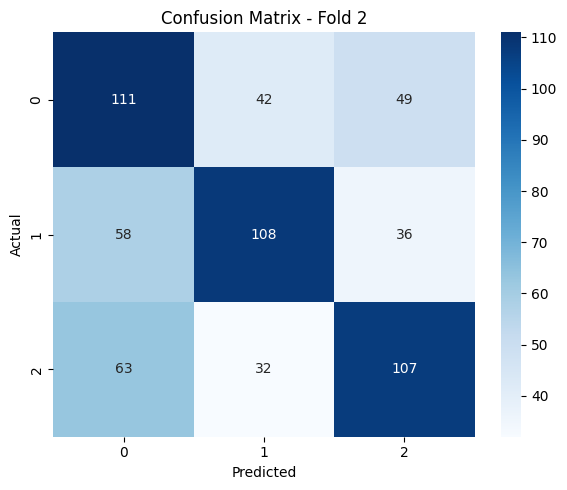


 Fold 3
✅ Accuracy: 0.5578
              precision    recall  f1-score   support

           0       0.51      0.62      0.56       202
           1       0.61      0.53      0.57       202
           2       0.58      0.52      0.55       202

    accuracy                           0.56       606
   macro avg       0.56      0.56      0.56       606
weighted avg       0.56      0.56      0.56       606



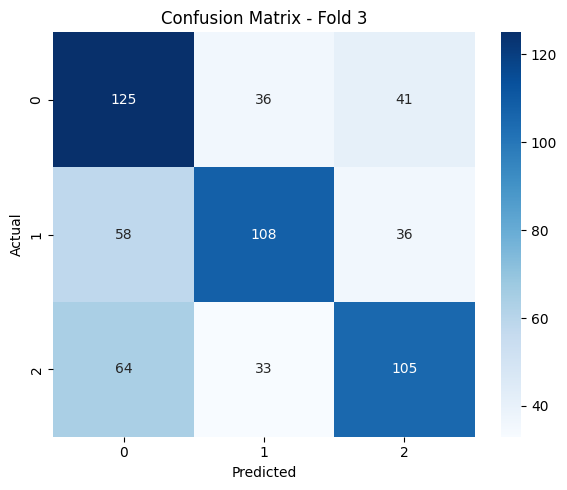


 Fold 4
✅ Accuracy: 0.5660
              precision    recall  f1-score   support

           0       0.53      0.54      0.54       202
           1       0.61      0.59      0.60       202
           2       0.56      0.56      0.56       202

    accuracy                           0.57       606
   macro avg       0.57      0.57      0.57       606
weighted avg       0.57      0.57      0.57       606



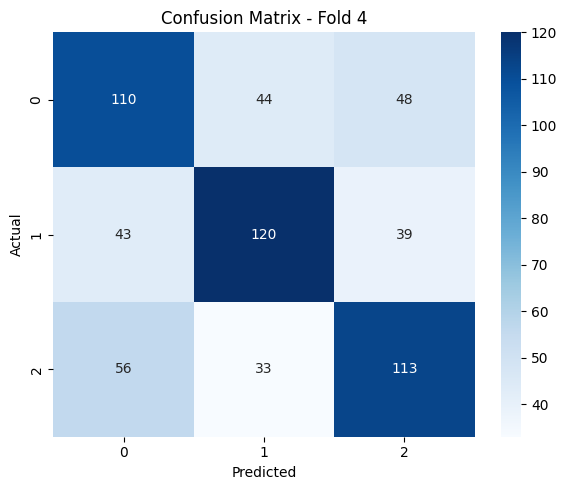


 Fold 5
✅ Accuracy: 0.5413
              precision    recall  f1-score   support

           0       0.47      0.56      0.51       202
           1       0.57      0.55      0.56       202
           2       0.60      0.51      0.55       202

    accuracy                           0.54       606
   macro avg       0.55      0.54      0.54       606
weighted avg       0.55      0.54      0.54       606



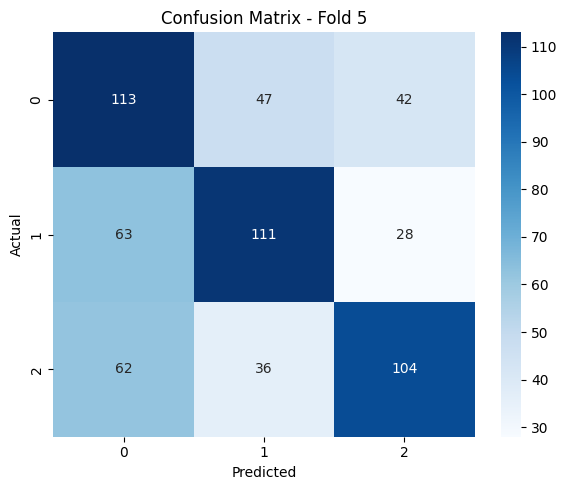


 Fold 6
✅ Accuracy: 0.5182
              precision    recall  f1-score   support

           0       0.45      0.56      0.50       202
           1       0.63      0.53      0.58       202
           2       0.51      0.46      0.48       202

    accuracy                           0.52       606
   macro avg       0.53      0.52      0.52       606
weighted avg       0.53      0.52      0.52       606



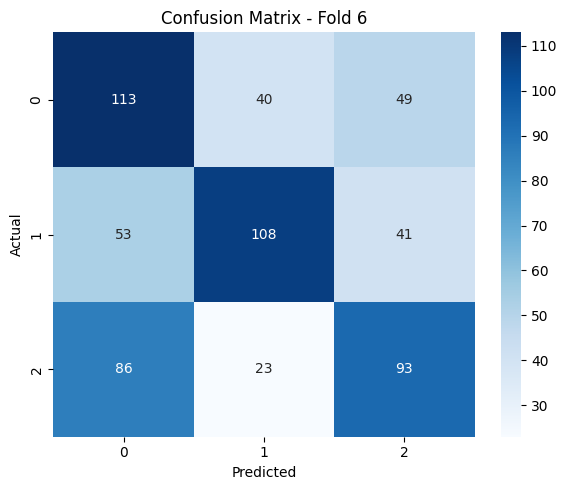


 Fold 7
✅ Accuracy: 0.5924
              precision    recall  f1-score   support

           0       0.55      0.65      0.60       202
           1       0.66      0.61      0.64       202
           2       0.58      0.51      0.54       202

    accuracy                           0.59       606
   macro avg       0.60      0.59      0.59       606
weighted avg       0.60      0.59      0.59       606



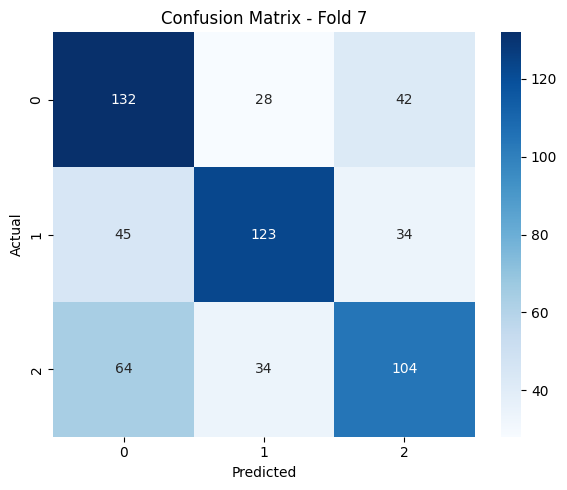


 Fold 8
✅ Accuracy: 0.5429
              precision    recall  f1-score   support

           0       0.48      0.50      0.49       202
           1       0.59      0.56      0.58       202
           2       0.56      0.56      0.56       202

    accuracy                           0.54       606
   macro avg       0.54      0.54      0.54       606
weighted avg       0.54      0.54      0.54       606



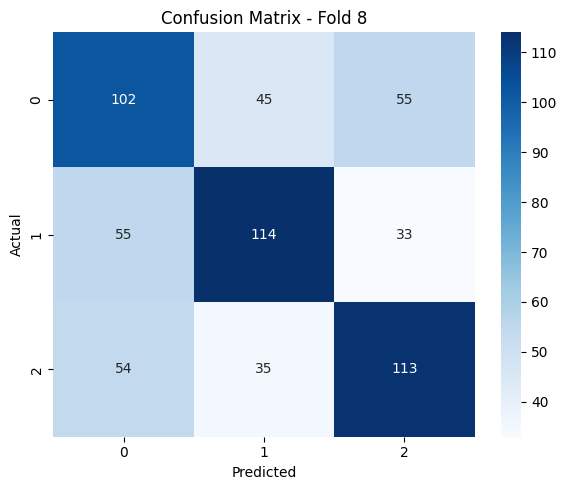


 Fold 9
✅ Accuracy: 0.5231
              precision    recall  f1-score   support

           0       0.48      0.52      0.50       202
           1       0.57      0.51      0.54       202
           2       0.54      0.54      0.54       202

    accuracy                           0.52       606
   macro avg       0.53      0.52      0.52       606
weighted avg       0.53      0.52      0.52       606



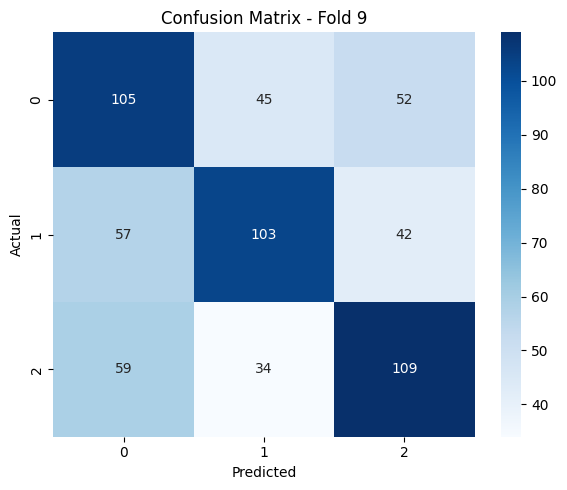


 Fold 10
✅ Accuracy: 0.5281
              precision    recall  f1-score   support

           0       0.49      0.56      0.52       202
           1       0.60      0.54      0.57       202
           2       0.51      0.48      0.49       202

    accuracy                           0.53       606
   macro avg       0.53      0.53      0.53       606
weighted avg       0.53      0.53      0.53       606



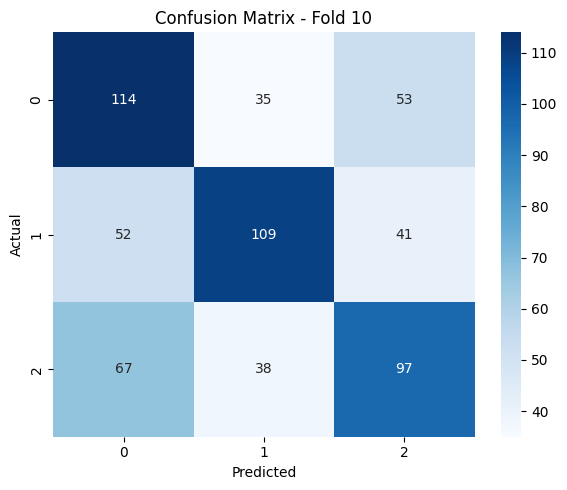


 Average Accuracy: 0.5413


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)
my_feature_extractor_name = 'sentence_embedding'

my_feature_extractor = SentenceEmbeddingTransformer(model_name='all-MiniLM-L6-v2')
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "multinomial"

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_feature_extractor_name)


### Bernoulli NB TFIDF multi-grams ALL WORDS



 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6106
              precision    recall  f1-score   support

           0       0.57      0.51      0.54       202
           1       0.81      0.61      0.69       202
           2       0.53      0.71      0.61       202

    accuracy                           0.61       606
   macro avg       0.64      0.61      0.61       606
weighted avg       0.64      0.61      0.61       606



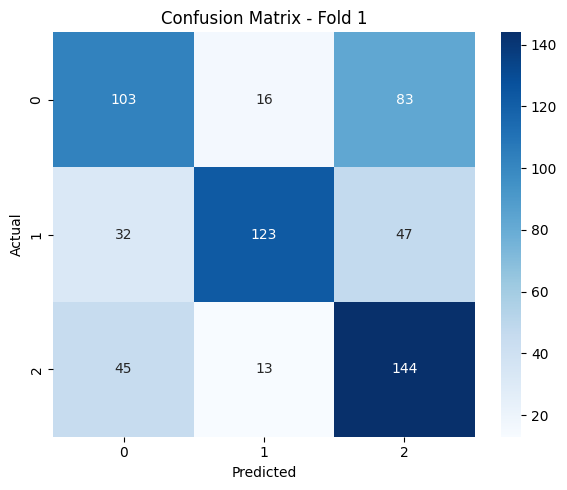


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6469
              precision    recall  f1-score   support

           0       0.63      0.60      0.61       202
           1       0.86      0.59      0.70       202
           2       0.55      0.74      0.63       202

    accuracy                           0.65       606
   macro avg       0.68      0.65      0.65       606
weighted avg       0.68      0.65      0.65       606



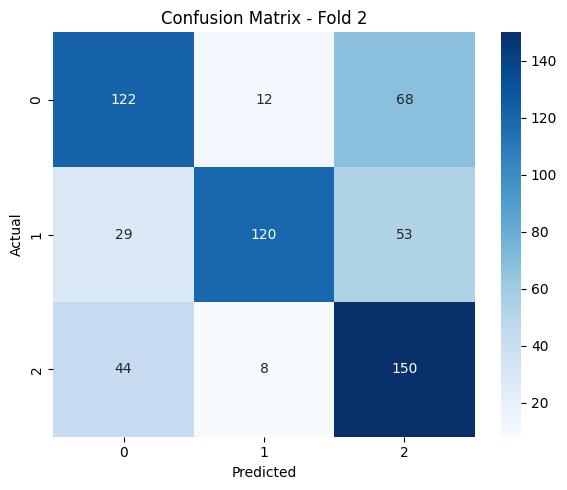


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6271
              precision    recall  f1-score   support

           0       0.63      0.58      0.60       202
           1       0.81      0.59      0.68       202
           2       0.53      0.71      0.61       202

    accuracy                           0.63       606
   macro avg       0.66      0.63      0.63       606
weighted avg       0.66      0.63      0.63       606



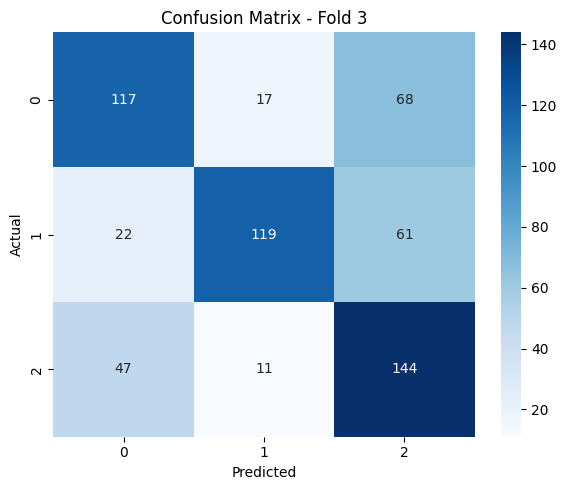


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6172
              precision    recall  f1-score   support

           0       0.62      0.51      0.56       202
           1       0.79      0.58      0.67       202
           2       0.53      0.75      0.62       202

    accuracy                           0.62       606
   macro avg       0.64      0.62      0.62       606
weighted avg       0.64      0.62      0.62       606



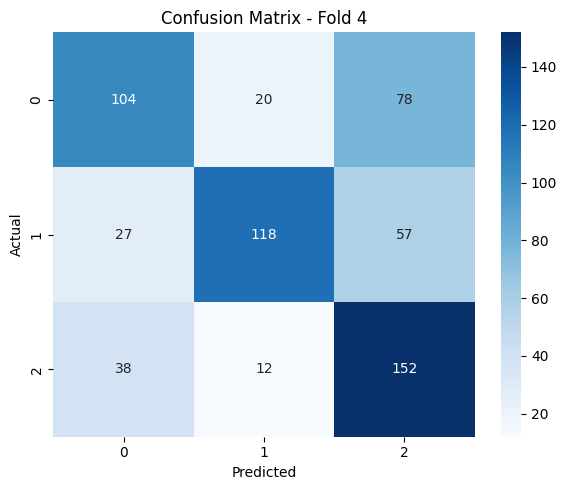


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6238
              precision    recall  f1-score   support

           0       0.61      0.58      0.60       202
           1       0.76      0.58      0.66       202
           2       0.55      0.71      0.62       202

    accuracy                           0.62       606
   macro avg       0.64      0.62      0.63       606
weighted avg       0.64      0.62      0.63       606



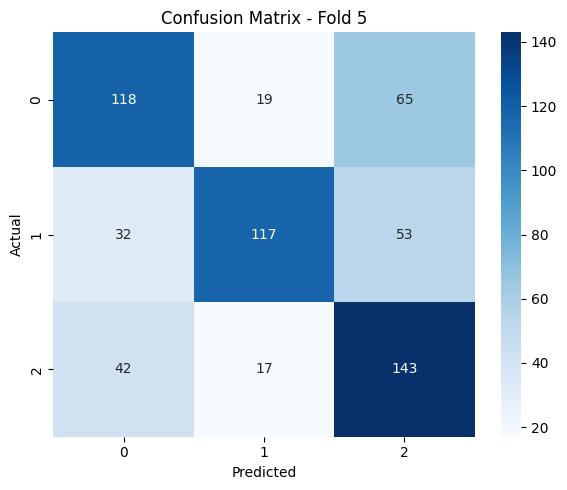


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6089
              precision    recall  f1-score   support

           0       0.60      0.56      0.58       202
           1       0.80      0.60      0.69       202
           2       0.51      0.66      0.57       202

    accuracy                           0.61       606
   macro avg       0.63      0.61      0.61       606
weighted avg       0.63      0.61      0.61       606



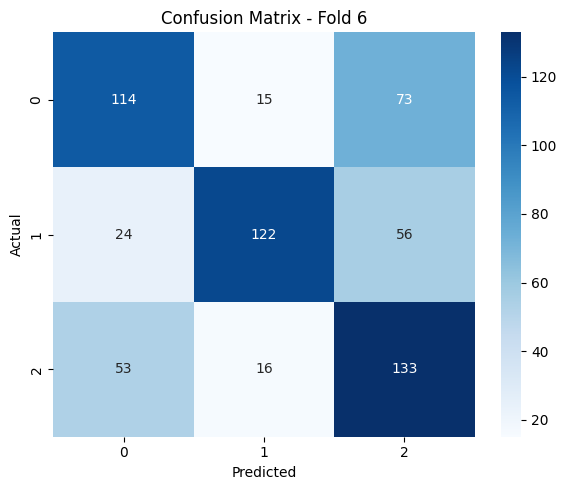


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6469
              precision    recall  f1-score   support

           0       0.66      0.59      0.62       202
           1       0.83      0.62      0.71       202
           2       0.54      0.73      0.62       202

    accuracy                           0.65       606
   macro avg       0.68      0.65      0.65       606
weighted avg       0.68      0.65      0.65       606



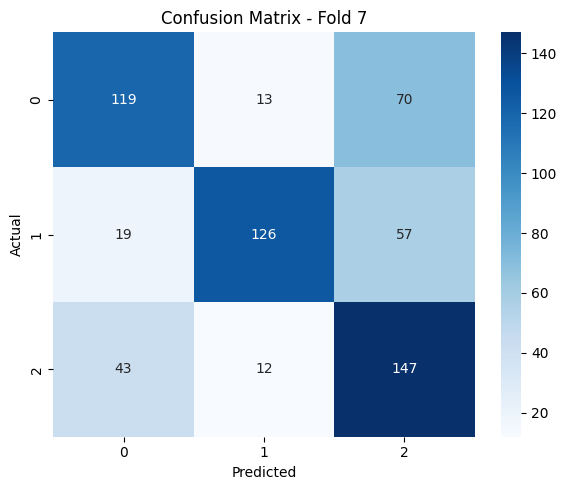


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6353
              precision    recall  f1-score   support

           0       0.61      0.60      0.61       202
           1       0.76      0.59      0.67       202
           2       0.57      0.71      0.63       202

    accuracy                           0.64       606
   macro avg       0.65      0.64      0.64       606
weighted avg       0.65      0.64      0.64       606



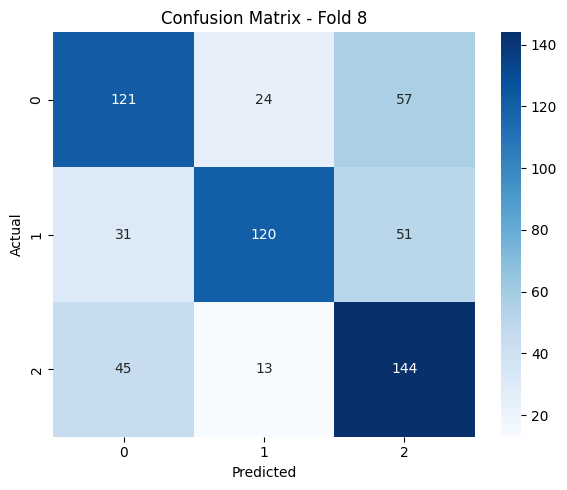


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6469
              precision    recall  f1-score   support

           0       0.65      0.56      0.60       202
           1       0.79      0.62      0.69       202
           2       0.56      0.76      0.65       202

    accuracy                           0.65       606
   macro avg       0.67      0.65      0.65       606
weighted avg       0.67      0.65      0.65       606



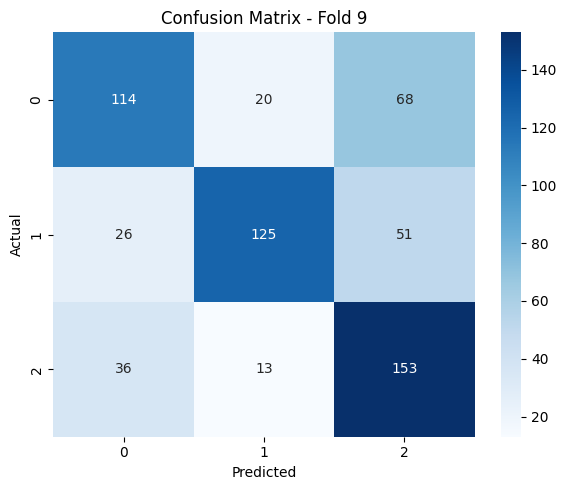


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6254
              precision    recall  f1-score   support

           0       0.60      0.60      0.60       202
           1       0.81      0.61      0.69       202
           2       0.54      0.67      0.59       202

    accuracy                           0.63       606
   macro avg       0.65      0.63      0.63       606
weighted avg       0.65      0.63      0.63       606



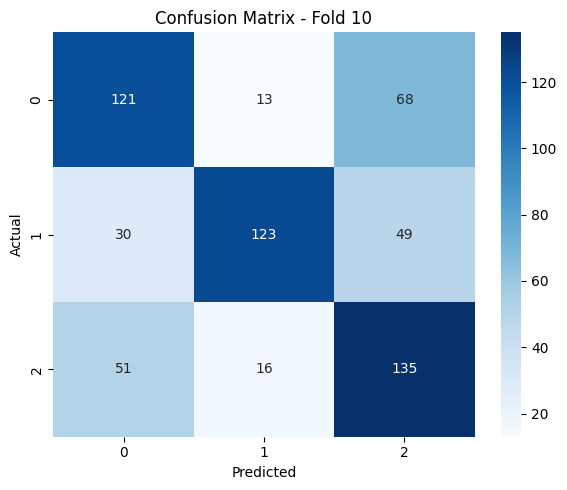


 Average Accuracy: 0.6289


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 3), tokenizer = spacy_tokenizer_all_words) # unigrams + bigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "bernoulli"
my_f_ext_name = 'tfidf'


bernoulli_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)


### Bernoulli TFIDF unigrams


 Fold 1
✅ Accuracy: 0.5693
              precision    recall  f1-score   support

           0       0.53      0.45      0.49       202
           1       0.73      0.55      0.63       202
           2       0.51      0.71      0.59       202

    accuracy                           0.57       606
   macro avg       0.59      0.57      0.57       606
weighted avg       0.59      0.57      0.57       606



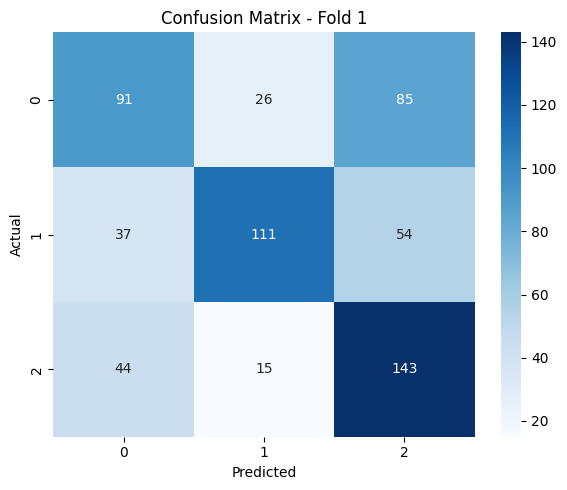


 Fold 2
✅ Accuracy: 0.5644
              precision    recall  f1-score   support

           0       0.55      0.45      0.49       202
           1       0.75      0.51      0.61       202
           2       0.49      0.74      0.59       202

    accuracy                           0.56       606
   macro avg       0.60      0.56      0.56       606
weighted avg       0.60      0.56      0.56       606



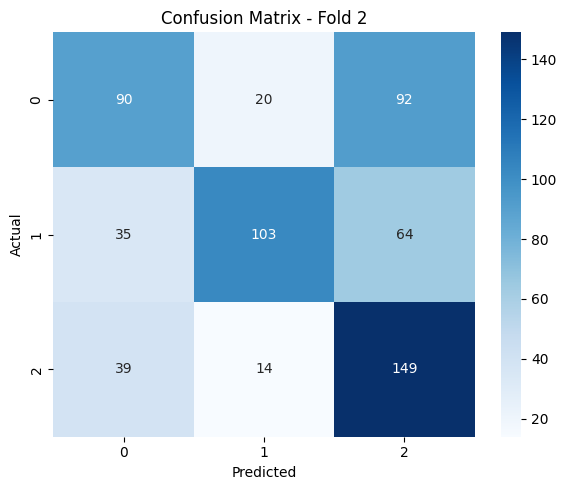


 Fold 3
✅ Accuracy: 0.5891
              precision    recall  f1-score   support

           0       0.64      0.50      0.57       202
           1       0.73      0.54      0.62       202
           2       0.49      0.72      0.58       202

    accuracy                           0.59       606
   macro avg       0.62      0.59      0.59       606
weighted avg       0.62      0.59      0.59       606



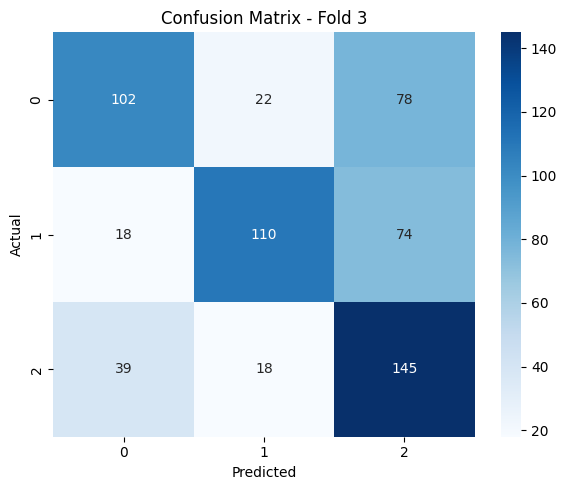


 Fold 4
✅ Accuracy: 0.5875
              precision    recall  f1-score   support

           0       0.61      0.45      0.52       202
           1       0.76      0.57      0.65       202
           2       0.49      0.74      0.59       202

    accuracy                           0.59       606
   macro avg       0.62      0.59      0.59       606
weighted avg       0.62      0.59      0.59       606



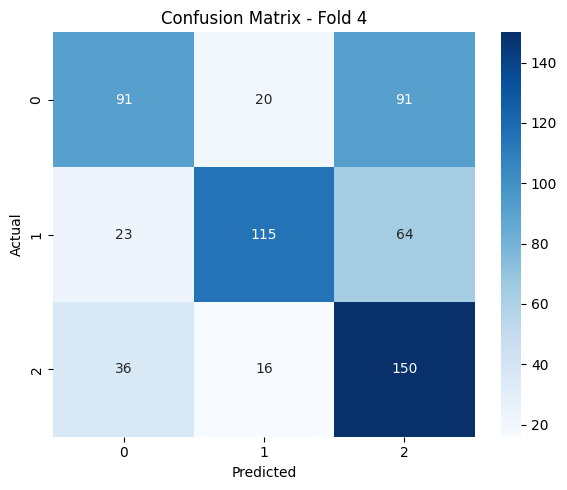


 Fold 5
✅ Accuracy: 0.5693
              precision    recall  f1-score   support

           0       0.58      0.51      0.55       202
           1       0.67      0.52      0.59       202
           2       0.50      0.67      0.57       202

    accuracy                           0.57       606
   macro avg       0.59      0.57      0.57       606
weighted avg       0.59      0.57      0.57       606



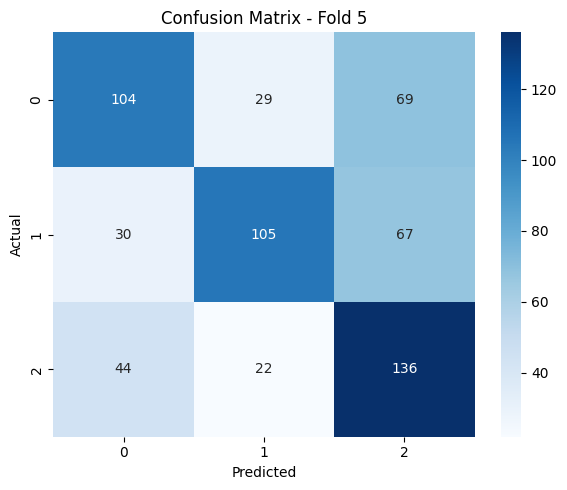


 Fold 6
✅ Accuracy: 0.5479
              precision    recall  f1-score   support

           0       0.55      0.48      0.51       202
           1       0.73      0.52      0.61       202
           2       0.45      0.64      0.53       202

    accuracy                           0.55       606
   macro avg       0.58      0.55      0.55       606
weighted avg       0.58      0.55      0.55       606



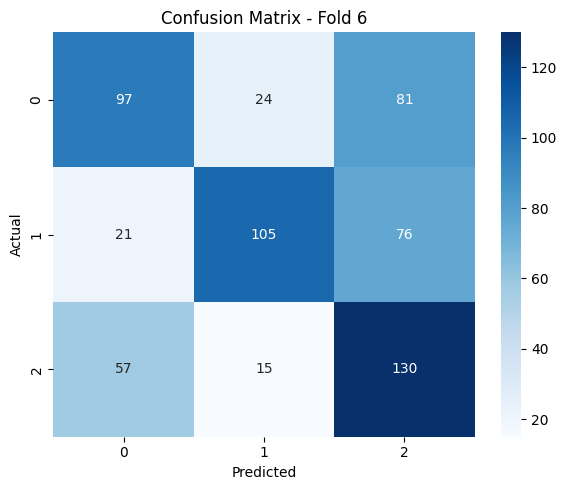


 Fold 7
✅ Accuracy: 0.6023
              precision    recall  f1-score   support

           0       0.65      0.53      0.59       202
           1       0.77      0.57      0.66       202
           2       0.49      0.70      0.58       202

    accuracy                           0.60       606
   macro avg       0.64      0.60      0.61       606
weighted avg       0.64      0.60      0.61       606



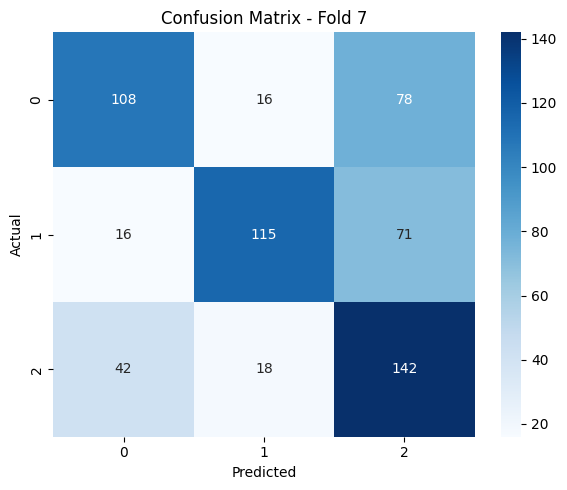


 Fold 8
✅ Accuracy: 0.5792
              precision    recall  f1-score   support

           0       0.57      0.45      0.50       202
           1       0.69      0.58      0.63       202
           2       0.52      0.71      0.60       202

    accuracy                           0.58       606
   macro avg       0.59      0.58      0.58       606
weighted avg       0.59      0.58      0.58       606



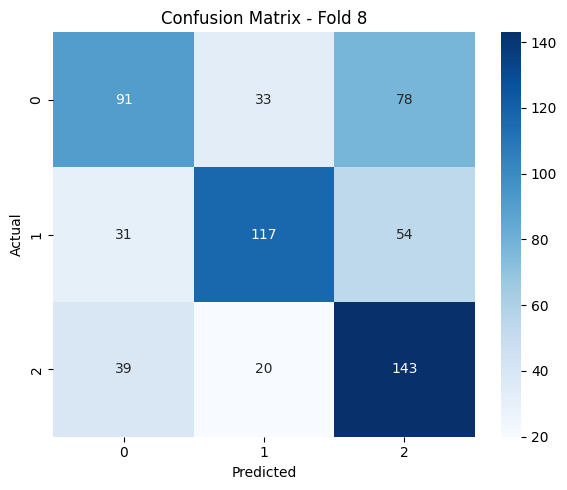


 Fold 9
✅ Accuracy: 0.5941
              precision    recall  f1-score   support

           0       0.63      0.51      0.56       202
           1       0.73      0.54      0.62       202
           2       0.51      0.73      0.60       202

    accuracy                           0.59       606
   macro avg       0.62      0.59      0.59       606
weighted avg       0.62      0.59      0.59       606



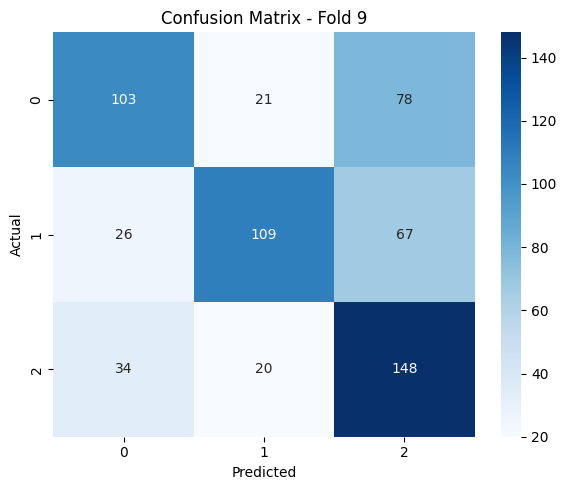


 Fold 10
✅ Accuracy: 0.5974
              precision    recall  f1-score   support

           0       0.60      0.58      0.59       202
           1       0.76      0.56      0.64       202
           2       0.50      0.65      0.57       202

    accuracy                           0.60       606
   macro avg       0.62      0.60      0.60       606
weighted avg       0.62      0.60      0.60       606



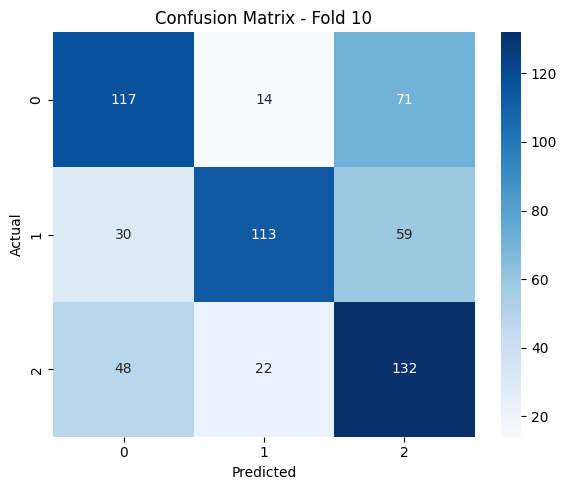


 Average Accuracy: 0.5800


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 1)) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "bernoulli"

bernoulli_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf)

### Bernoulli count vectorizer unigrams


 Fold 1
✅ Accuracy: 0.5644
              precision    recall  f1-score   support

           0       0.53      0.46      0.49       202
           1       0.77      0.53      0.63       202
           2       0.48      0.70      0.57       202

    accuracy                           0.56       606
   macro avg       0.59      0.56      0.57       606
weighted avg       0.59      0.56      0.57       606



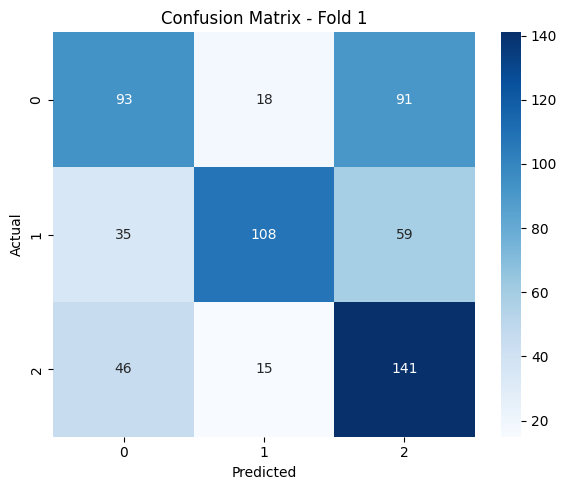


 Fold 2
✅ Accuracy: 0.5545
              precision    recall  f1-score   support

           0       0.55      0.43      0.48       202
           1       0.76      0.50      0.61       202
           2       0.47      0.73      0.57       202

    accuracy                           0.55       606
   macro avg       0.59      0.55      0.55       606
weighted avg       0.59      0.55      0.55       606



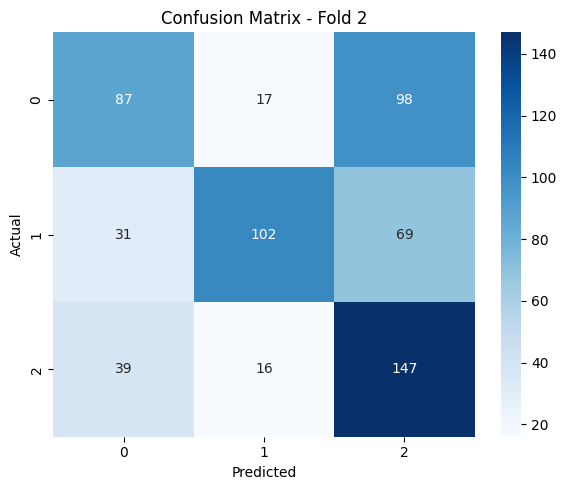


 Fold 3
✅ Accuracy: 0.5924
              precision    recall  f1-score   support

           0       0.65      0.50      0.56       202
           1       0.75      0.55      0.64       202
           2       0.49      0.73      0.58       202

    accuracy                           0.59       606
   macro avg       0.63      0.59      0.59       606
weighted avg       0.63      0.59      0.59       606



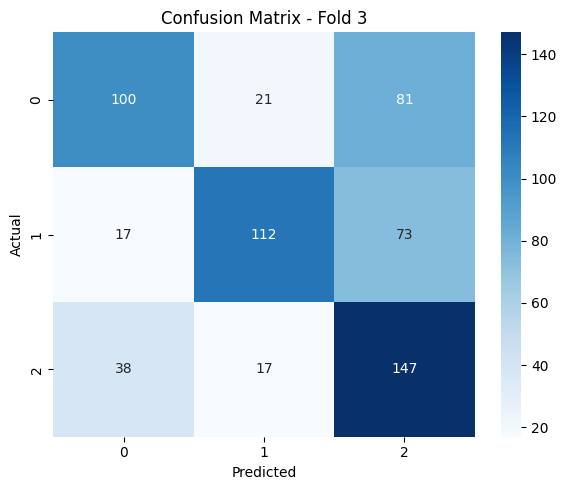


 Fold 4
✅ Accuracy: 0.5792
              precision    recall  f1-score   support

           0       0.61      0.43      0.50       202
           1       0.74      0.53      0.62       202
           2       0.49      0.78      0.60       202

    accuracy                           0.58       606
   macro avg       0.61      0.58      0.58       606
weighted avg       0.61      0.58      0.58       606



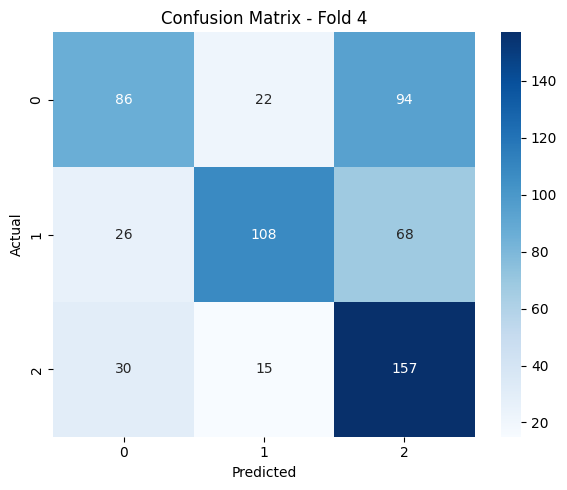


 Fold 5
✅ Accuracy: 0.5561
              precision    recall  f1-score   support

           0       0.60      0.48      0.53       202
           1       0.67      0.49      0.57       202
           2       0.48      0.70      0.57       202

    accuracy                           0.56       606
   macro avg       0.58      0.56      0.56       606
weighted avg       0.58      0.56      0.56       606



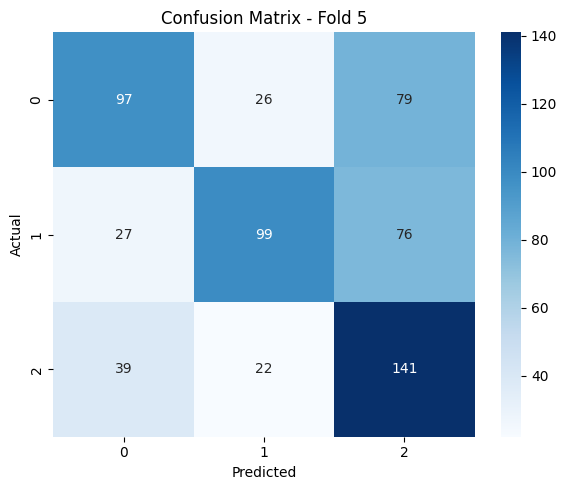


 Fold 6
✅ Accuracy: 0.5429
              precision    recall  f1-score   support

           0       0.57      0.48      0.52       202
           1       0.71      0.51      0.60       202
           2       0.44      0.64      0.52       202

    accuracy                           0.54       606
   macro avg       0.57      0.54      0.55       606
weighted avg       0.57      0.54      0.55       606



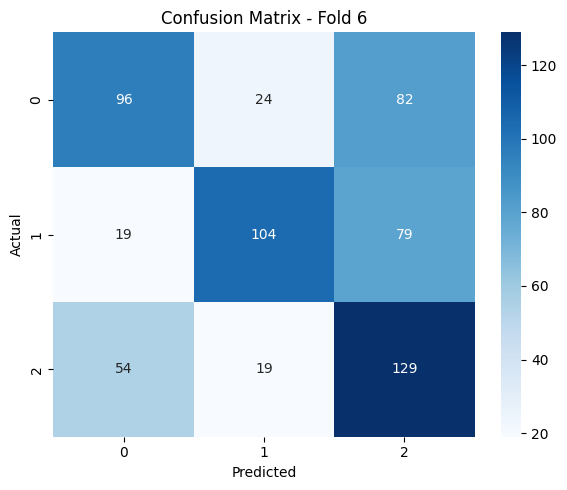


 Fold 7
✅ Accuracy: 0.5908
              precision    recall  f1-score   support

           0       0.66      0.53      0.59       202
           1       0.74      0.53      0.62       202
           2       0.48      0.71      0.57       202

    accuracy                           0.59       606
   macro avg       0.63      0.59      0.59       606
weighted avg       0.63      0.59      0.59       606



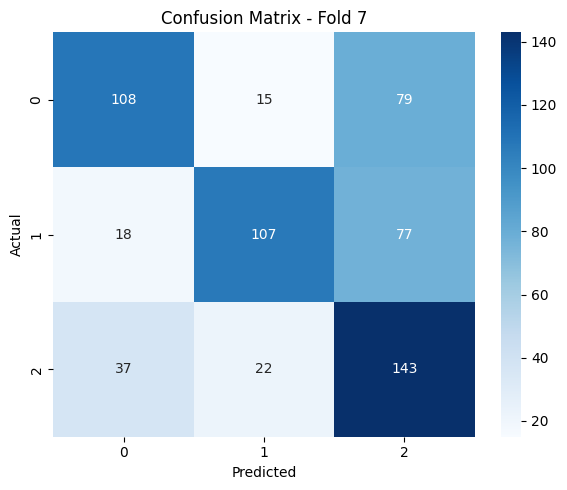


 Fold 8
✅ Accuracy: 0.5660
              precision    recall  f1-score   support

           0       0.59      0.45      0.51       202
           1       0.68      0.54      0.60       202
           2       0.49      0.70      0.58       202

    accuracy                           0.57       606
   macro avg       0.59      0.57      0.56       606
weighted avg       0.59      0.57      0.56       606



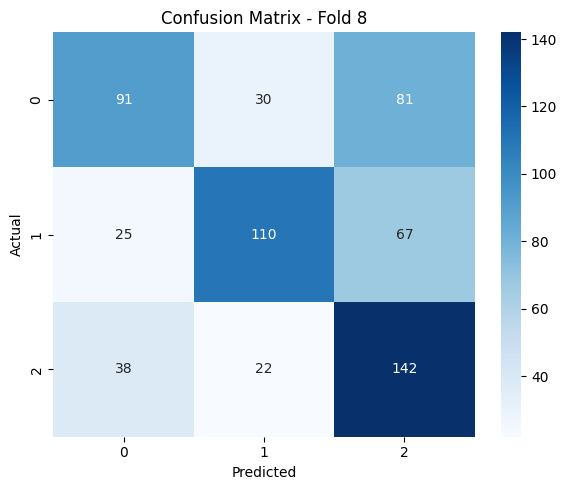


 Fold 9
✅ Accuracy: 0.5858
              precision    recall  f1-score   support

           0       0.64      0.52      0.57       202
           1       0.72      0.50      0.59       202
           2       0.49      0.74      0.59       202

    accuracy                           0.59       606
   macro avg       0.62      0.59      0.58       606
weighted avg       0.62      0.59      0.58       606



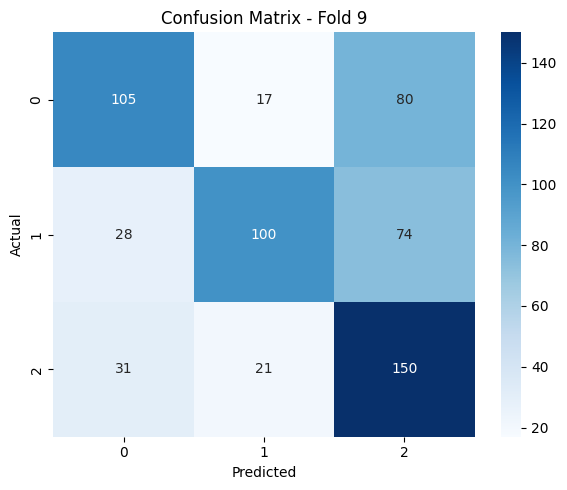


 Fold 10
✅ Accuracy: 0.5809
              precision    recall  f1-score   support

           0       0.58      0.56      0.57       202
           1       0.78      0.51      0.62       202
           2       0.49      0.67      0.56       202

    accuracy                           0.58       606
   macro avg       0.61      0.58      0.58       606
weighted avg       0.61      0.58      0.58       606



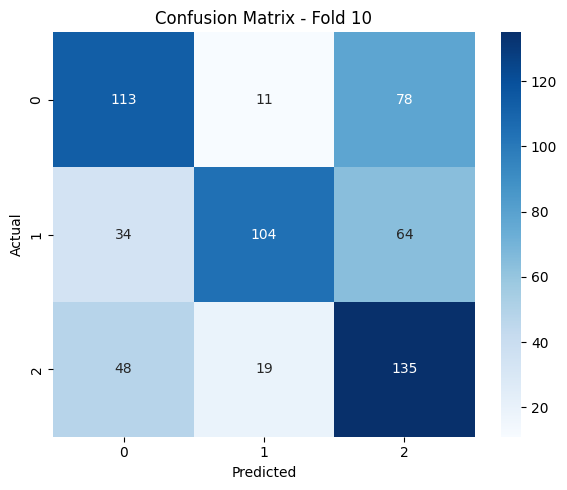


 Average Accuracy: 0.5713


In [ ]:
 # Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = CountVectorizer(ngram_range=(1, 1)) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "bernoulli"

bernoulli_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf)

### BErnoulli count vectorizer ngrams


 Fold 1
✅ Accuracy: 0.6089
              precision    recall  f1-score   support

           0       0.61      0.50      0.55       202
           1       0.83      0.61      0.70       202
           2       0.50      0.72      0.59       202

    accuracy                           0.61       606
   macro avg       0.64      0.61      0.61       606
weighted avg       0.64      0.61      0.61       606



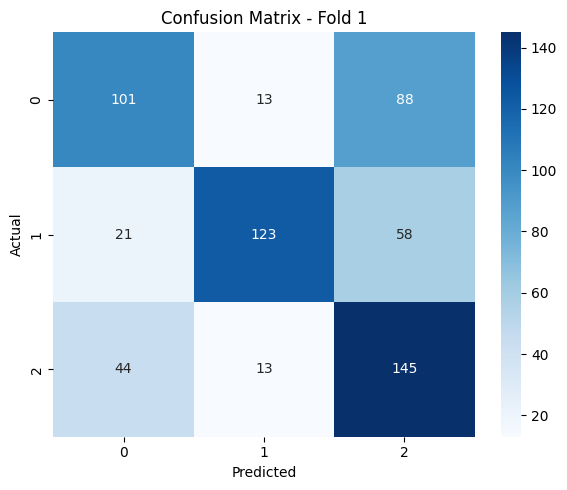


 Fold 2
✅ Accuracy: 0.5908
              precision    recall  f1-score   support

           0       0.58      0.48      0.52       202
           1       0.86      0.54      0.67       202
           2       0.49      0.75      0.59       202

    accuracy                           0.59       606
   macro avg       0.64      0.59      0.59       606
weighted avg       0.64      0.59      0.59       606



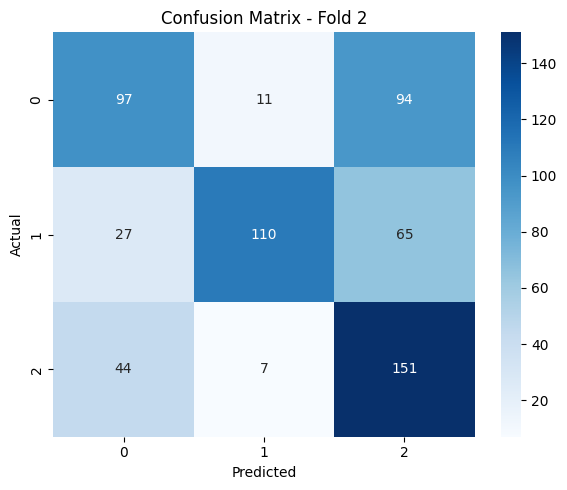


 Fold 3
✅ Accuracy: 0.6073
              precision    recall  f1-score   support

           0       0.67      0.55      0.61       202
           1       0.80      0.54      0.65       202
           2       0.49      0.72      0.58       202

    accuracy                           0.61       606
   macro avg       0.65      0.61      0.61       606
weighted avg       0.65      0.61      0.61       606



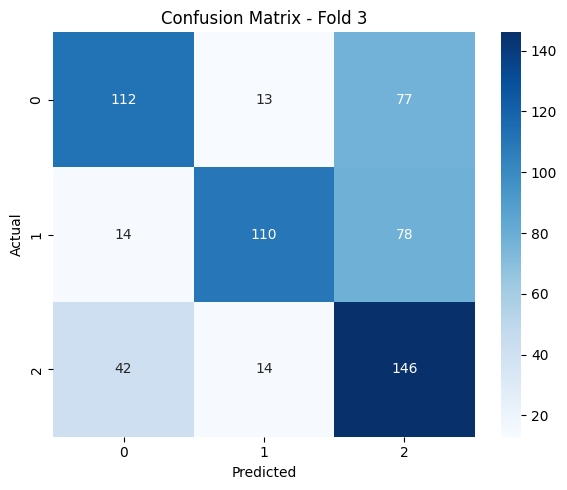


 Fold 4
✅ Accuracy: 0.6106
              precision    recall  f1-score   support

           0       0.64      0.47      0.54       202
           1       0.82      0.58      0.68       202
           2       0.50      0.78      0.61       202

    accuracy                           0.61       606
   macro avg       0.65      0.61      0.61       606
weighted avg       0.65      0.61      0.61       606



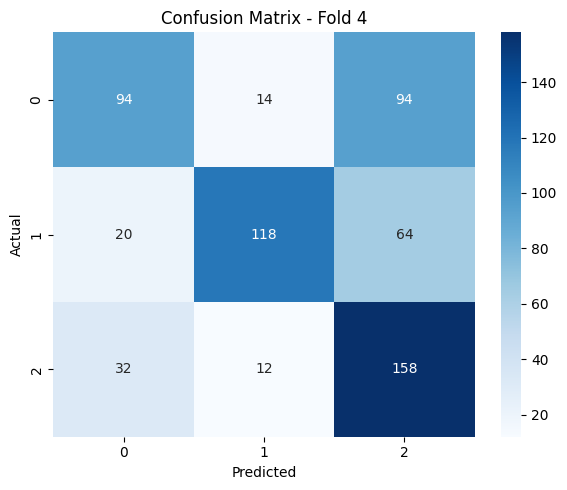


 Fold 5
✅ Accuracy: 0.6056
              precision    recall  f1-score   support

           0       0.62      0.55      0.59       202
           1       0.78      0.55      0.65       202
           2       0.51      0.71      0.59       202

    accuracy                           0.61       606
   macro avg       0.64      0.61      0.61       606
weighted avg       0.64      0.61      0.61       606



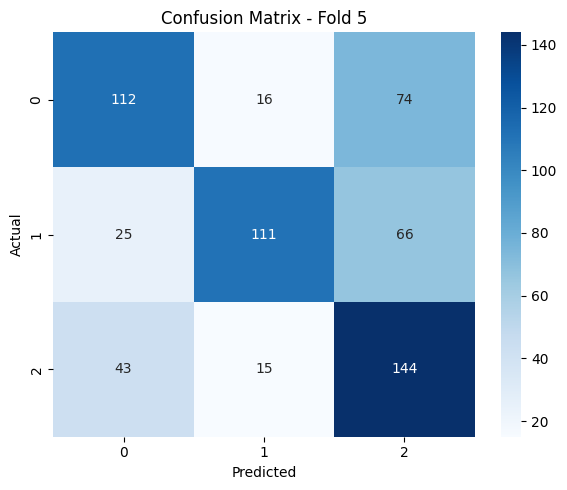


 Fold 6
✅ Accuracy: 0.5908
              precision    recall  f1-score   support

           0       0.61      0.53      0.57       202
           1       0.80      0.56      0.66       202
           2       0.48      0.68      0.56       202

    accuracy                           0.59       606
   macro avg       0.63      0.59      0.60       606
weighted avg       0.63      0.59      0.60       606



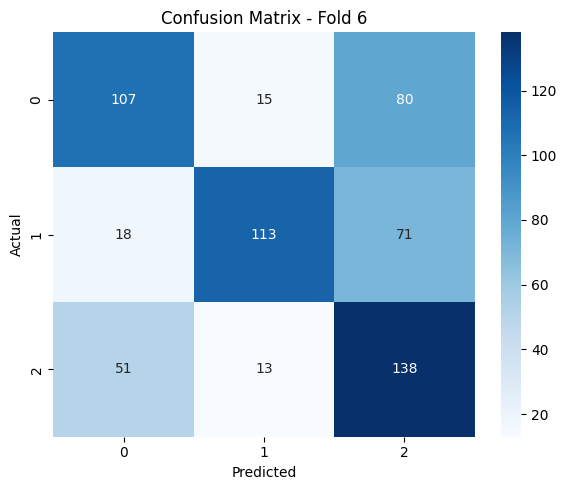


 Fold 7
✅ Accuracy: 0.6254
              precision    recall  f1-score   support

           0       0.65      0.53      0.59       202
           1       0.85      0.60      0.70       202
           2       0.50      0.74      0.60       202

    accuracy                           0.63       606
   macro avg       0.67      0.63      0.63       606
weighted avg       0.67      0.63      0.63       606



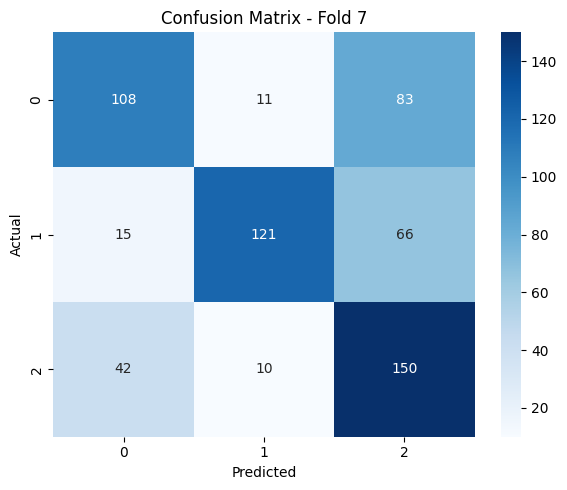


 Fold 8
✅ Accuracy: 0.6023
              precision    recall  f1-score   support

           0       0.63      0.53      0.57       202
           1       0.76      0.54      0.63       202
           2       0.51      0.74      0.60       202

    accuracy                           0.60       606
   macro avg       0.63      0.60      0.60       606
weighted avg       0.63      0.60      0.60       606



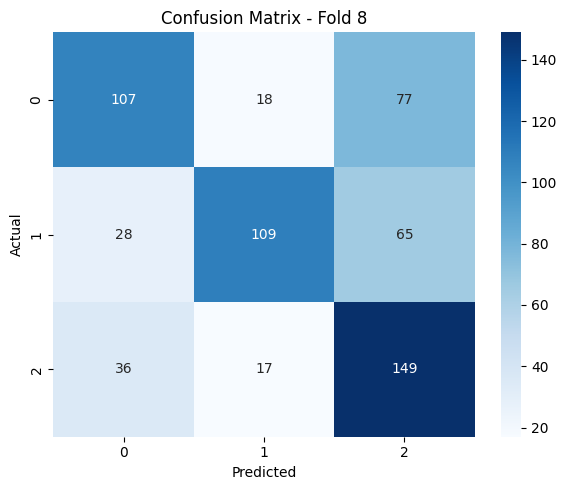


 Fold 9
✅ Accuracy: 0.6073
              precision    recall  f1-score   support

           0       0.63      0.52      0.57       202
           1       0.79      0.55      0.65       202
           2       0.51      0.74      0.60       202

    accuracy                           0.61       606
   macro avg       0.64      0.61      0.61       606
weighted avg       0.64      0.61      0.61       606



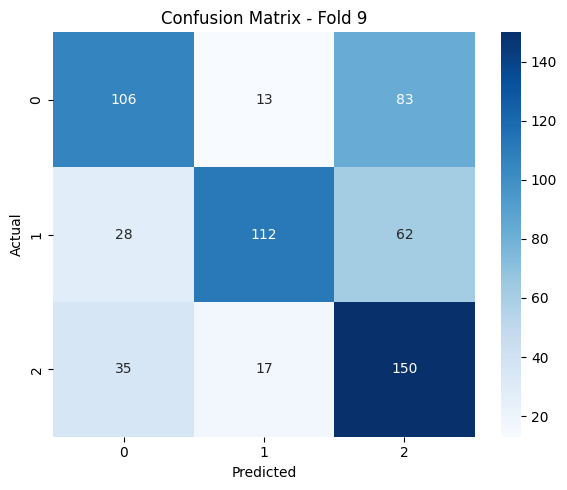


 Fold 10
✅ Accuracy: 0.6056
              precision    recall  f1-score   support

           0       0.58      0.57      0.57       202
           1       0.84      0.56      0.68       202
           2       0.51      0.68      0.58       202

    accuracy                           0.61       606
   macro avg       0.64      0.61      0.61       606
weighted avg       0.64      0.61      0.61       606



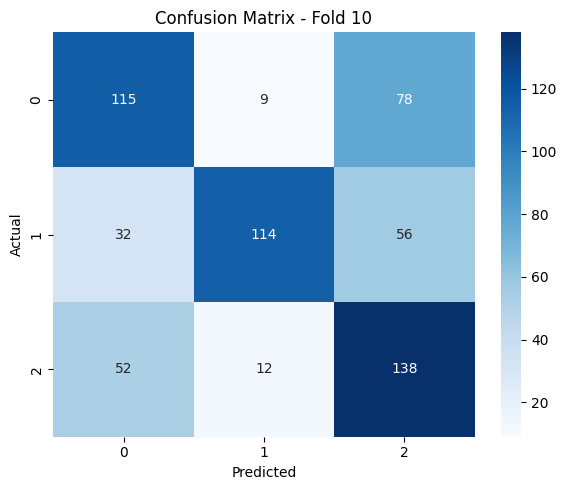


 Average Accuracy: 0.6054


In [ ]:
 # Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = CountVectorizer(ngram_range=(1, 3)) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "bernoulli"

bernoulli_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf)

## Bernoulli EMBEDDINGS

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]


 Fold 1
✅ Accuracy: 0.3333
              precision    recall  f1-score   support

           0       0.23      0.01      0.03       202
           1       0.33      0.96      0.50       202
           2       0.42      0.02      0.05       202

    accuracy                           0.33       606
   macro avg       0.33      0.33      0.19       606
weighted avg       0.33      0.33      0.19       606



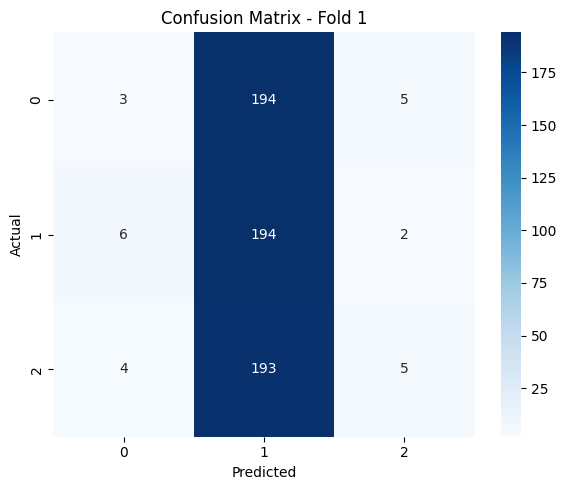


 Fold 2
✅ Accuracy: 0.3399
              precision    recall  f1-score   support

           0       0.34      0.97      0.50       202
           1       0.40      0.02      0.04       202
           2       0.33      0.03      0.05       202

    accuracy                           0.34       606
   macro avg       0.36      0.34      0.20       606
weighted avg       0.36      0.34      0.20       606



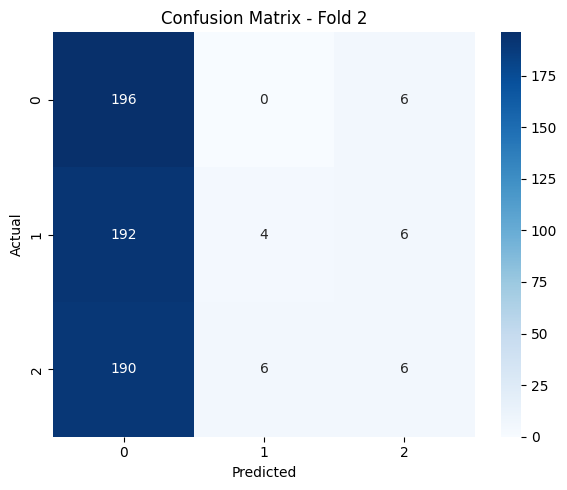


 Fold 3
✅ Accuracy: 0.3333
              precision    recall  f1-score   support

           0       0.22      0.01      0.02       202
           1       0.33      0.95      0.49       202
           2       0.47      0.04      0.07       202

    accuracy                           0.33       606
   macro avg       0.34      0.33      0.19       606
weighted avg       0.34      0.33      0.19       606



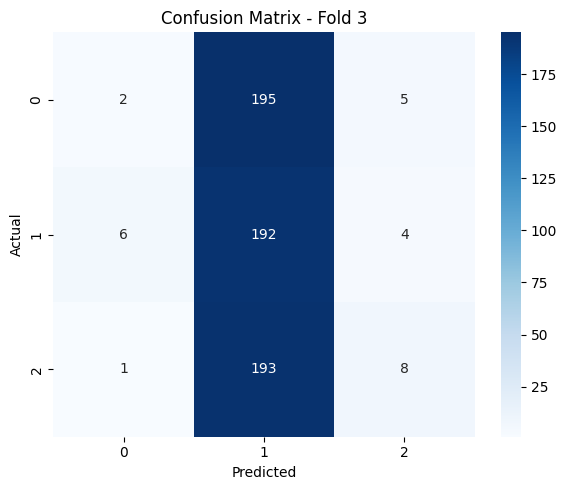


 Fold 4
✅ Accuracy: 0.3333
              precision    recall  f1-score   support

           0       0.33      0.94      0.49       202
           1       0.42      0.02      0.05       202
           2       0.38      0.04      0.07       202

    accuracy                           0.33       606
   macro avg       0.38      0.33      0.20       606
weighted avg       0.38      0.33      0.20       606



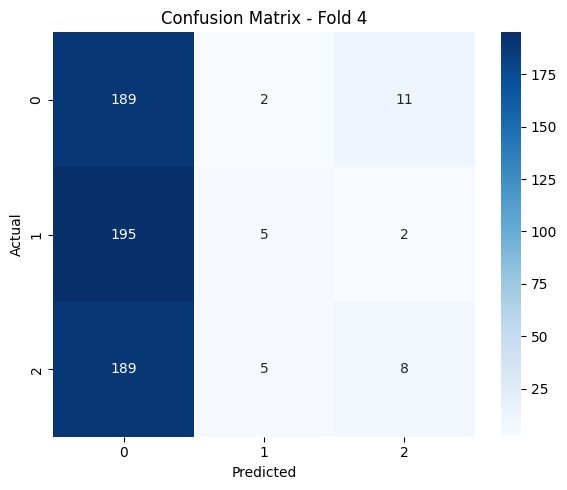


 Fold 5
✅ Accuracy: 0.3284
              precision    recall  f1-score   support

           0       0.21      0.01      0.03       202
           1       0.34      0.96      0.50       202
           2       0.14      0.01      0.02       202

    accuracy                           0.33       606
   macro avg       0.23      0.33      0.18       606
weighted avg       0.23      0.33      0.18       606



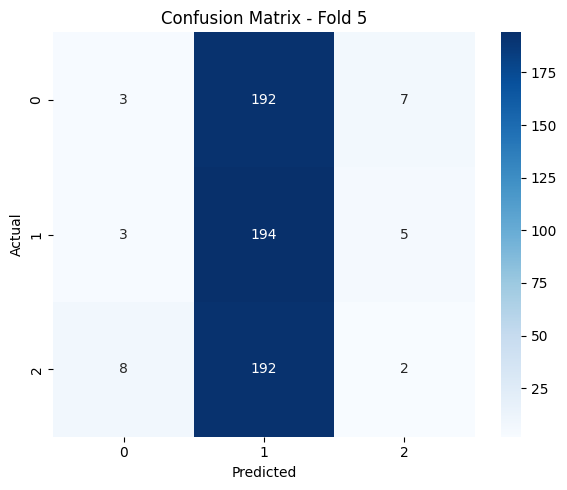


 Fold 6
✅ Accuracy: 0.3333
              precision    recall  f1-score   support

           0       0.34      0.96      0.50       202
           1       0.14      0.01      0.02       202
           2       0.44      0.03      0.06       202

    accuracy                           0.33       606
   macro avg       0.31      0.33      0.19       606
weighted avg       0.31      0.33      0.19       606



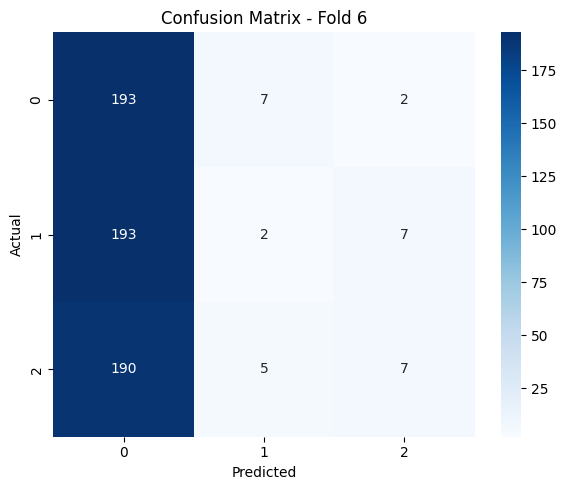


 Fold 7
✅ Accuracy: 0.3317
              precision    recall  f1-score   support

           0       0.33      0.94      0.49       202
           1       0.31      0.02      0.04       202
           2       0.47      0.04      0.07       202

    accuracy                           0.33       606
   macro avg       0.37      0.33      0.20       606
weighted avg       0.37      0.33      0.20       606



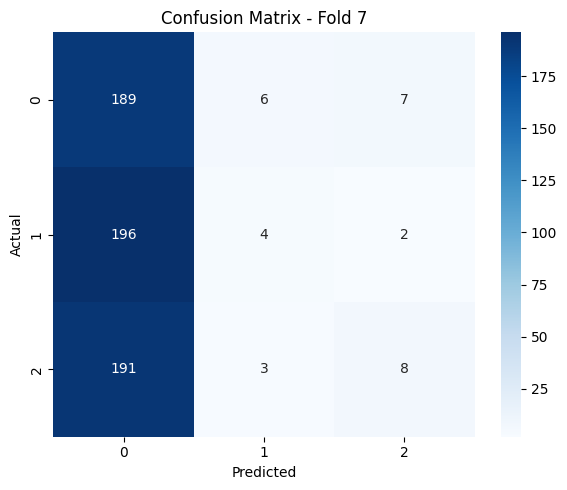


 Fold 8
✅ Accuracy: 0.3300
              precision    recall  f1-score   support

           0       0.10      0.00      0.01       202
           1       0.33      0.96      0.49       202
           2       0.38      0.02      0.05       202

    accuracy                           0.33       606
   macro avg       0.27      0.33      0.18       606
weighted avg       0.27      0.33      0.18       606



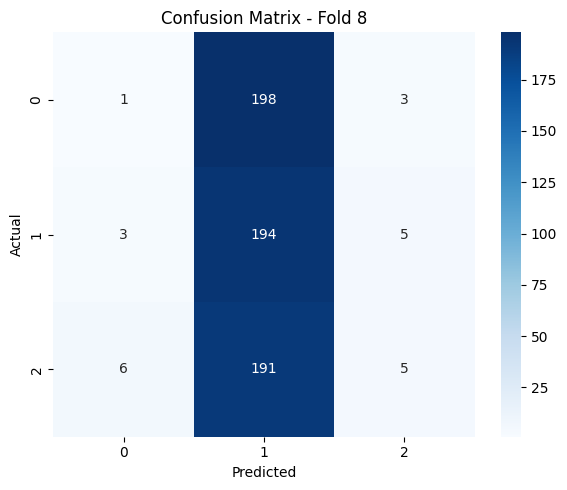


 Fold 9
✅ Accuracy: 0.3333
              precision    recall  f1-score   support

           0       0.33      0.96      0.49       202
           1       0.29      0.01      0.02       202
           2       0.39      0.03      0.06       202

    accuracy                           0.33       606
   macro avg       0.34      0.33      0.19       606
weighted avg       0.34      0.33      0.19       606



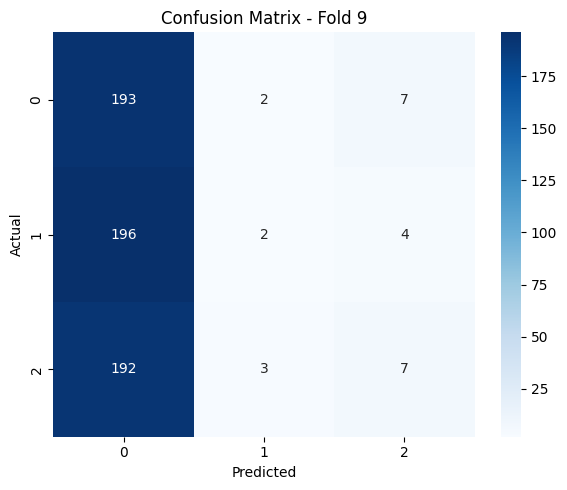


 Fold 10
✅ Accuracy: 0.3383
              precision    recall  f1-score   support

           0       0.34      0.96      0.50       202
           1       0.31      0.02      0.05       202
           2       0.47      0.03      0.06       202

    accuracy                           0.34       606
   macro avg       0.37      0.34      0.20       606
weighted avg       0.37      0.34      0.20       606



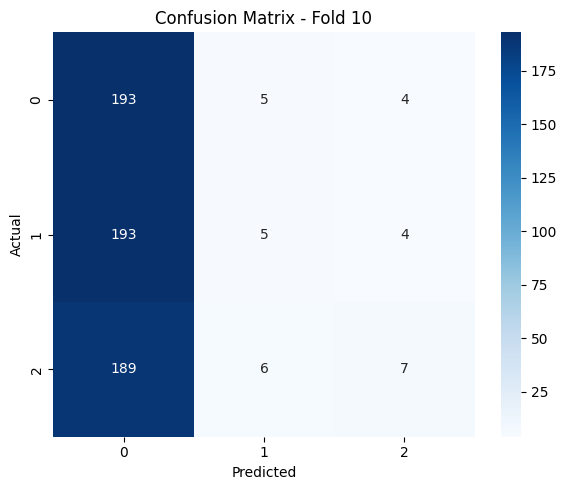


 Average Accuracy: 0.3335


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)
my_feature_extractor_name = 'sentence_embedding'

my_feature_extractor = SentenceEmbeddingTransformer(model_name='all-MiniLM-L6-v2')
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "bernoulli"

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_feature_extractor_name)


# LogRegression EMBEDDINGS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.5495
              precision    recall  f1-score   support

           0       0.47      0.47      0.47       202
           1       0.62      0.61      0.62       202
           2       0.55      0.56      0.56       202

    accuracy                           0.55       606
   macro avg       0.55      0.55      0.55       606
weighted avg       0.55      0.55      0.55       606



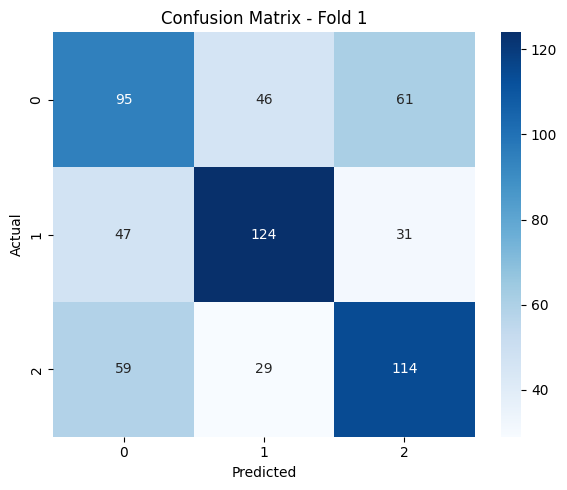


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6089
              precision    recall  f1-score   support

           0       0.53      0.59      0.56       202
           1       0.70      0.59      0.64       202
           2       0.62      0.64      0.63       202

    accuracy                           0.61       606
   macro avg       0.62      0.61      0.61       606
weighted avg       0.62      0.61      0.61       606



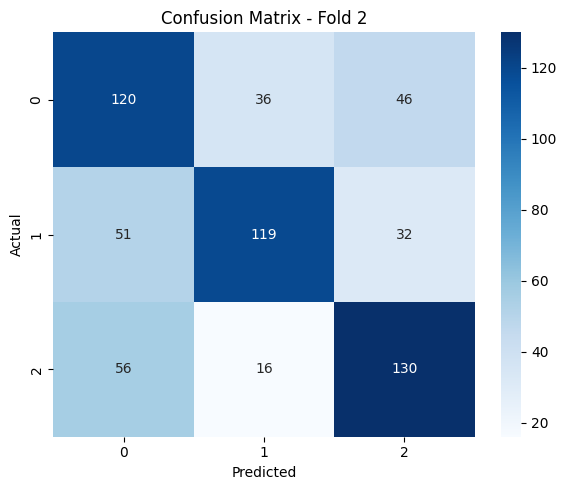


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6089
              precision    recall  f1-score   support

           0       0.56      0.58      0.57       202
           1       0.67      0.63      0.65       202
           2       0.61      0.61      0.61       202

    accuracy                           0.61       606
   macro avg       0.61      0.61      0.61       606
weighted avg       0.61      0.61      0.61       606



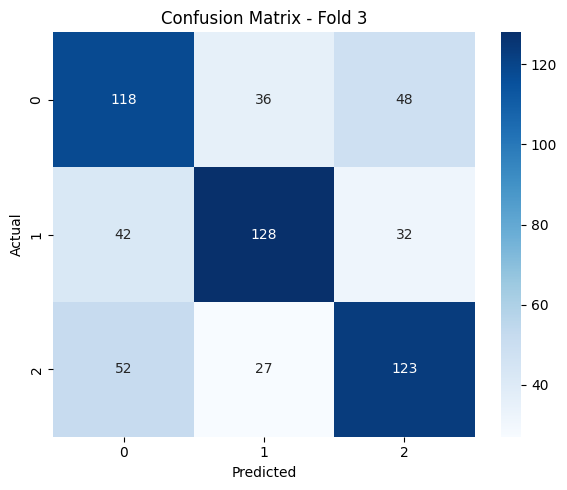


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.5908
              precision    recall  f1-score   support

           0       0.57      0.51      0.54       202
           1       0.61      0.64      0.63       202
           2       0.58      0.62      0.60       202

    accuracy                           0.59       606
   macro avg       0.59      0.59      0.59       606
weighted avg       0.59      0.59      0.59       606



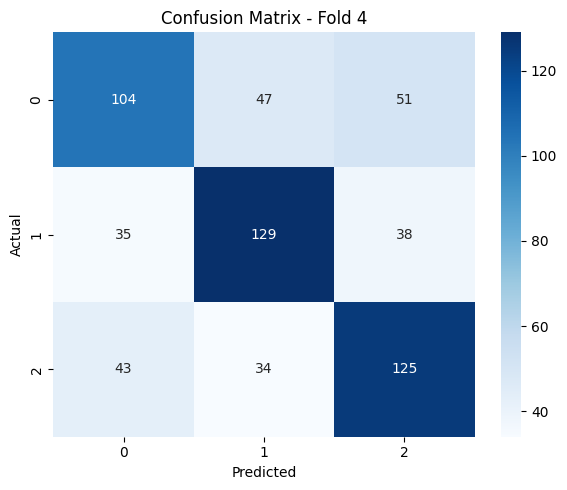


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.5891
              precision    recall  f1-score   support

           0       0.53      0.61      0.57       202
           1       0.62      0.64      0.63       202
           2       0.62      0.51      0.56       202

    accuracy                           0.59       606
   macro avg       0.59      0.59      0.59       606
weighted avg       0.59      0.59      0.59       606



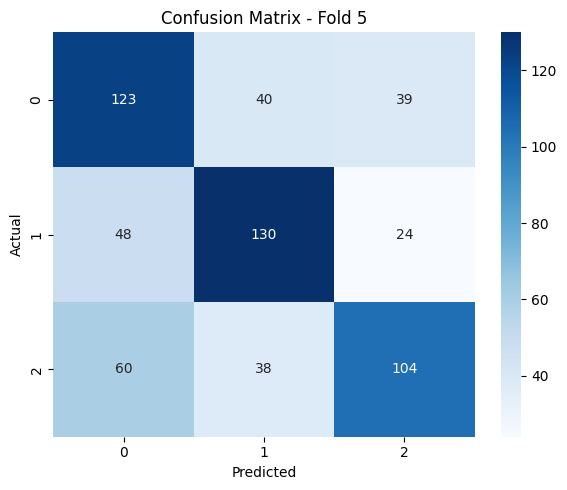


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.5462
              precision    recall  f1-score   support

           0       0.51      0.55      0.53       202
           1       0.62      0.60      0.61       202
           2       0.51      0.48      0.50       202

    accuracy                           0.55       606
   macro avg       0.55      0.55      0.55       606
weighted avg       0.55      0.55      0.55       606



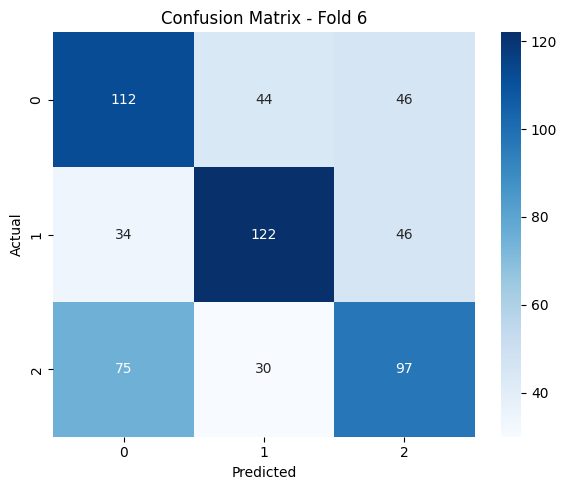


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.5924
              precision    recall  f1-score   support

           0       0.54      0.59      0.56       202
           1       0.63      0.62      0.62       202
           2       0.61      0.57      0.59       202

    accuracy                           0.59       606
   macro avg       0.59      0.59      0.59       606
weighted avg       0.59      0.59      0.59       606



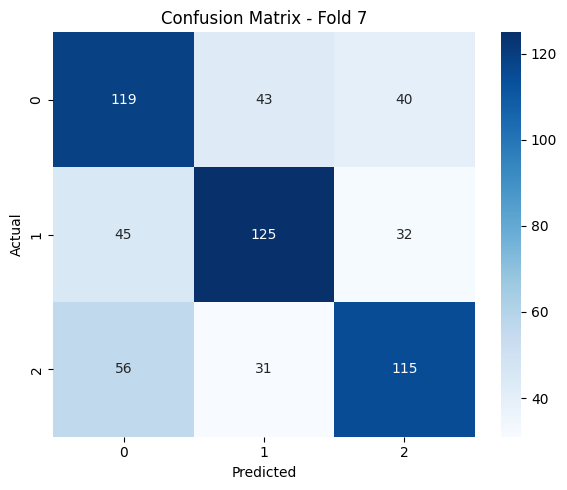


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.5908
              precision    recall  f1-score   support

           0       0.52      0.53      0.53       202
           1       0.65      0.66      0.65       202
           2       0.60      0.58      0.59       202

    accuracy                           0.59       606
   macro avg       0.59      0.59      0.59       606
weighted avg       0.59      0.59      0.59       606



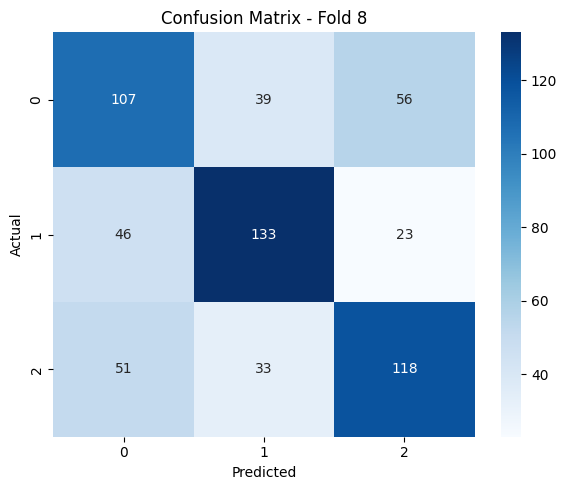


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.5759
              precision    recall  f1-score   support

           0       0.52      0.50      0.51       202
           1       0.62      0.60      0.61       202
           2       0.59      0.62      0.61       202

    accuracy                           0.58       606
   macro avg       0.58      0.58      0.58       606
weighted avg       0.58      0.58      0.58       606



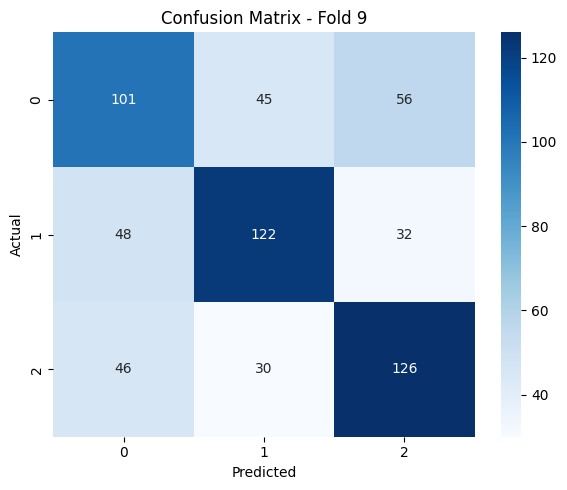


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.5677
              precision    recall  f1-score   support

           0       0.50      0.52      0.51       202
           1       0.62      0.64      0.63       202
           2       0.59      0.54      0.56       202

    accuracy                           0.57       606
   macro avg       0.57      0.57      0.57       606
weighted avg       0.57      0.57      0.57       606



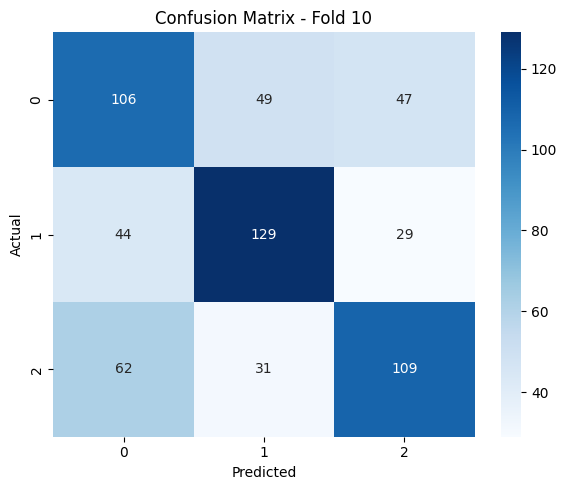


 Average Accuracy: 0.5820


In [ ]:
# Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)
my_feature_extractor_name = 'sentence_embedding'

my_feature_extractor = SentenceEmbeddingTransformer(model_name='all-MiniLM-L6-v2')
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf = "logistic"

multinomial_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_feature_extractor_name)


## LogREgression TFIDF ngrams - ALL WORDS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6106
              precision    recall  f1-score   support

           0       0.55      0.67      0.60       202
           1       0.64      0.74      0.69       202
           2       0.69      0.42      0.52       202

    accuracy                           0.61       606
   macro avg       0.62      0.61      0.60       606
weighted avg       0.62      0.61      0.60       606



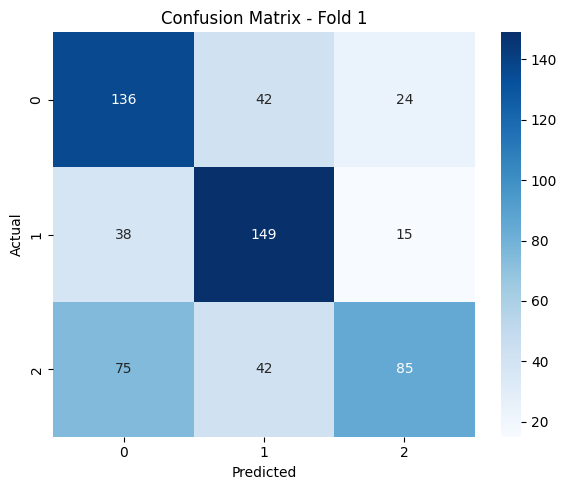


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6304
              precision    recall  f1-score   support

           0       0.55      0.67      0.60       202
           1       0.69      0.70      0.69       202
           2       0.69      0.52      0.59       202

    accuracy                           0.63       606
   macro avg       0.64      0.63      0.63       606
weighted avg       0.64      0.63      0.63       606



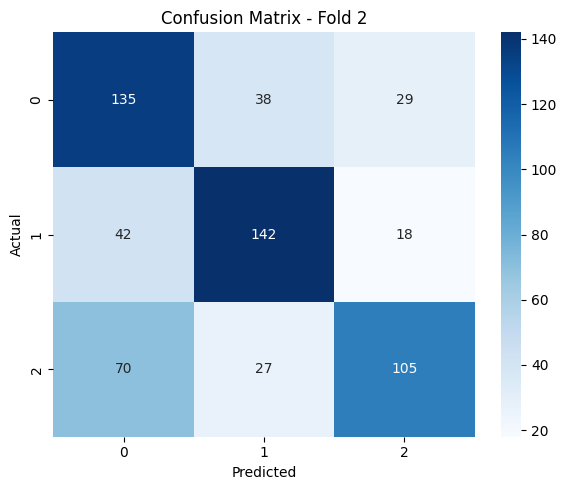


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6964
              precision    recall  f1-score   support

           0       0.63      0.78      0.70       202
           1       0.73      0.78      0.76       202
           2       0.75      0.53      0.62       202

    accuracy                           0.70       606
   macro avg       0.71      0.70      0.69       606
weighted avg       0.71      0.70      0.69       606



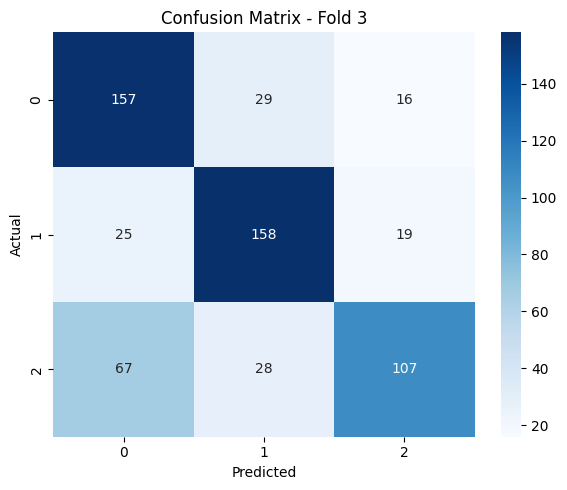


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6865
              precision    recall  f1-score   support

           0       0.64      0.68      0.66       202
           1       0.69      0.83      0.75       202
           2       0.75      0.55      0.63       202

    accuracy                           0.69       606
   macro avg       0.69      0.69      0.68       606
weighted avg       0.69      0.69      0.68       606



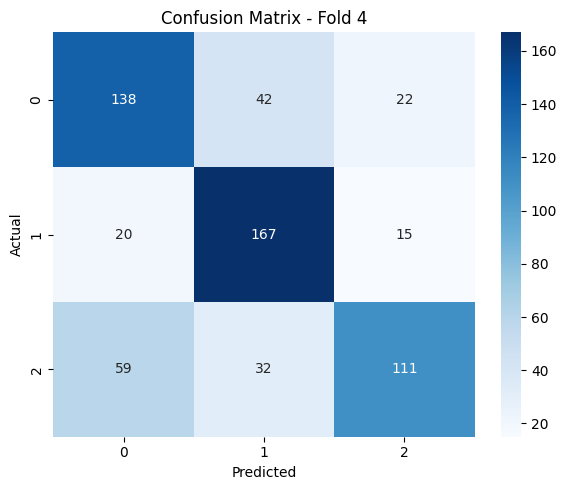


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6370
              precision    recall  f1-score   support

           0       0.58      0.69      0.63       202
           1       0.67      0.72      0.70       202
           2       0.67      0.50      0.57       202

    accuracy                           0.64       606
   macro avg       0.64      0.64      0.63       606
weighted avg       0.64      0.64      0.63       606



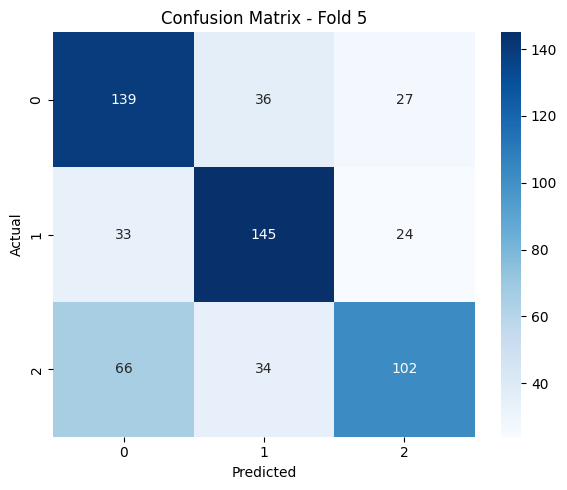


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6254
              precision    recall  f1-score   support

           0       0.56      0.67      0.61       202
           1       0.67      0.77      0.72       202
           2       0.66      0.44      0.53       202

    accuracy                           0.63       606
   macro avg       0.63      0.63      0.62       606
weighted avg       0.63      0.63      0.62       606



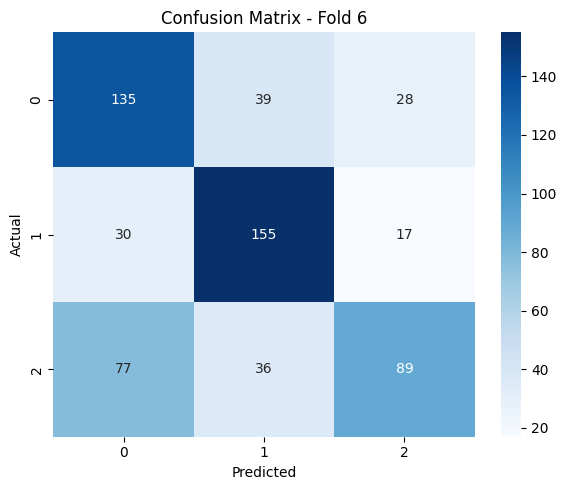


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6799
              precision    recall  f1-score   support

           0       0.60      0.70      0.65       202
           1       0.74      0.79      0.76       202
           2       0.71      0.55      0.62       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



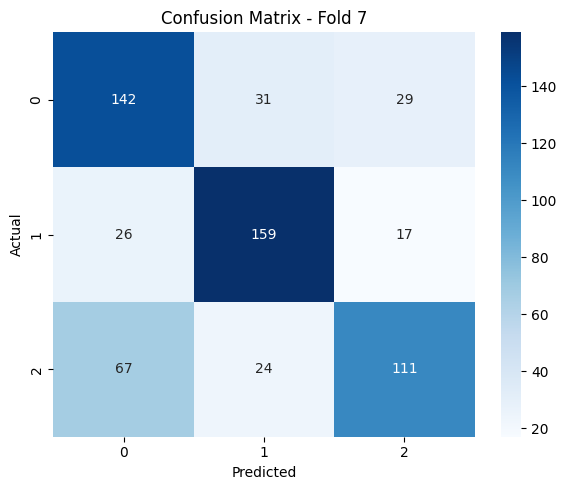


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6617
              precision    recall  f1-score   support

           0       0.58      0.75      0.66       202
           1       0.72      0.75      0.74       202
           2       0.72      0.48      0.58       202

    accuracy                           0.66       606
   macro avg       0.68      0.66      0.66       606
weighted avg       0.68      0.66      0.66       606



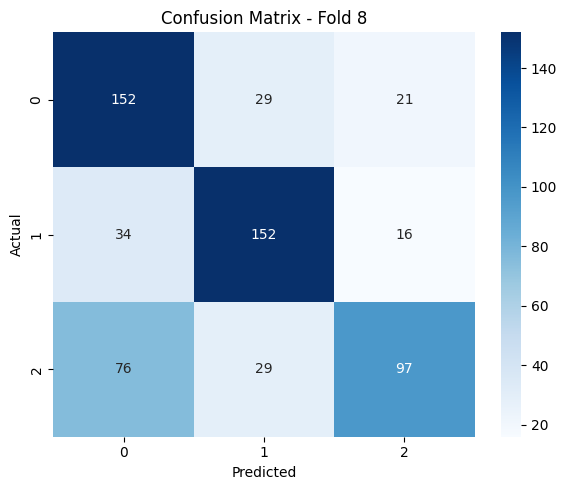


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6650
              precision    recall  f1-score   support

           0       0.58      0.67      0.62       202
           1       0.69      0.75      0.72       202
           2       0.76      0.57      0.65       202

    accuracy                           0.67       606
   macro avg       0.68      0.67      0.66       606
weighted avg       0.68      0.67      0.66       606



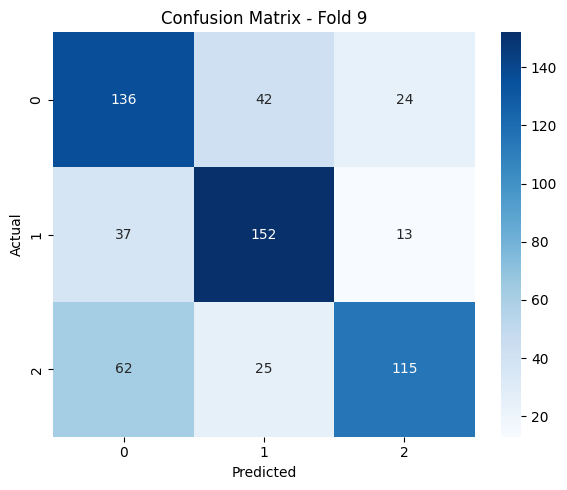


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6535
              precision    recall  f1-score   support

           0       0.59      0.77      0.67       202
           1       0.69      0.73      0.71       202
           2       0.72      0.46      0.56       202

    accuracy                           0.65       606
   macro avg       0.67      0.65      0.65       606
weighted avg       0.67      0.65      0.65       606



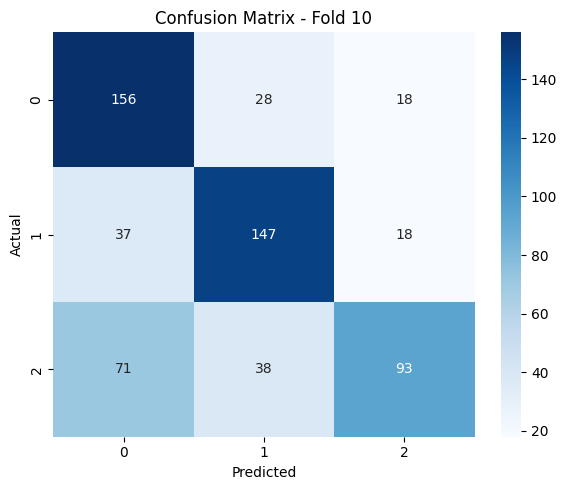


 Average Accuracy: 0.6546


In [ ]:
 # Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 3), tokenizer = spacy_tokenizer_all_words) # multigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "logistic"
my_f_ext_name = 'tfidf'

log_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)


In [ ]:
y_pred = log_pipeline.predict(X_test)
acc = accuracy_score(y_test, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=pipeline.classes_)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=pipeline.classes_,
            yticklabels=pipeline.classes_)
plt.title(f'Confusion Matrix - Fold {fold}')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()


In [ ]:
explain_pipeline(log_pipeline)

## LogREgression TFIDF ngrams - JUST STOPWORDS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5347
              precision    recall  f1-score   support

           0       0.51      0.52      0.51       202
           1       0.56      0.57      0.56       202
           2       0.54      0.51      0.52       202

    accuracy                           0.53       606
   macro avg       0.53      0.53      0.53       606
weighted avg       0.53      0.53      0.53       606



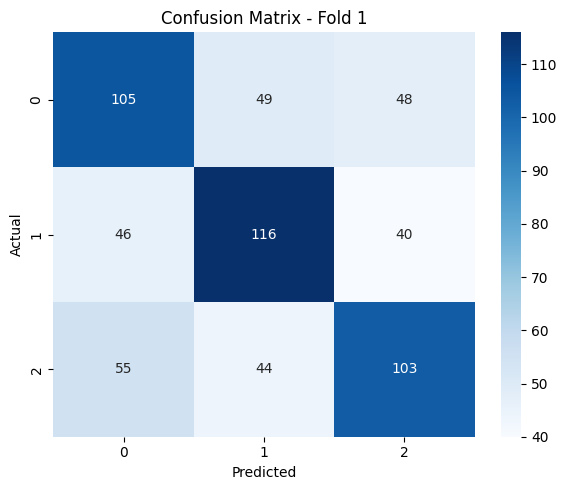


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5149
              precision    recall  f1-score   support

           0       0.46      0.50      0.48       202
           1       0.56      0.57      0.56       202
           2       0.54      0.48      0.51       202

    accuracy                           0.51       606
   macro avg       0.52      0.51      0.52       606
weighted avg       0.52      0.51      0.52       606



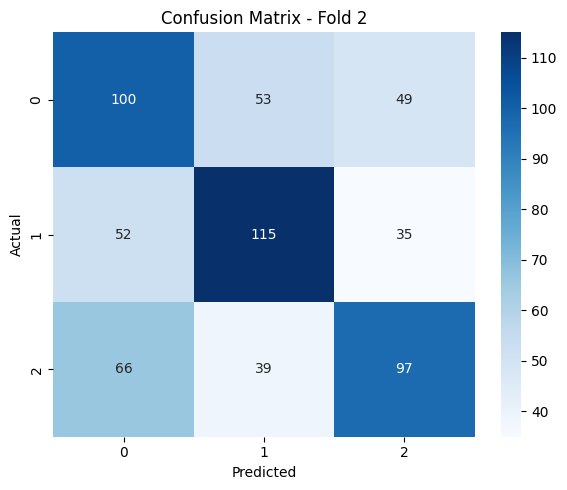


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5660
              precision    recall  f1-score   support

           0       0.53      0.53      0.53       202
           1       0.58      0.62      0.60       202
           2       0.58      0.54      0.56       202

    accuracy                           0.57       606
   macro avg       0.57      0.57      0.57       606
weighted avg       0.57      0.57      0.57       606



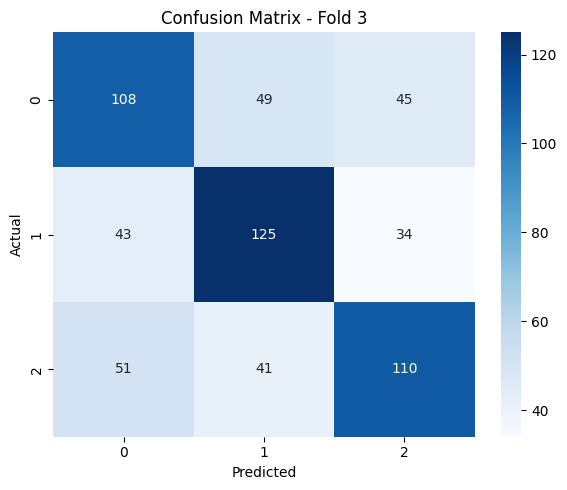


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5561
              precision    recall  f1-score   support

           0       0.57      0.50      0.54       202
           1       0.57      0.64      0.60       202
           2       0.53      0.52      0.53       202

    accuracy                           0.56       606
   macro avg       0.56      0.56      0.55       606
weighted avg       0.56      0.56      0.55       606



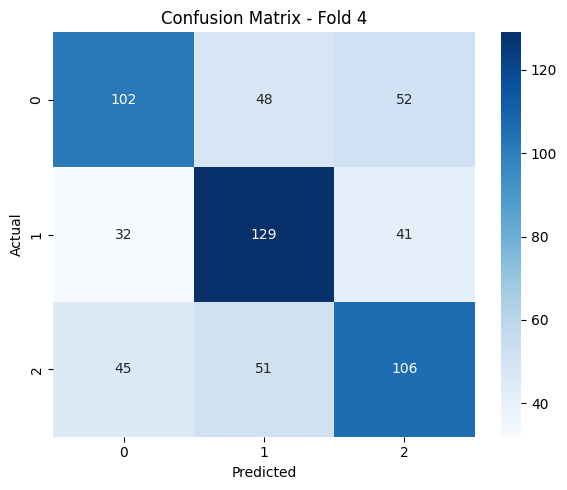


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5512
              precision    recall  f1-score   support

           0       0.52      0.51      0.51       202
           1       0.60      0.64      0.62       202
           2       0.53      0.50      0.52       202

    accuracy                           0.55       606
   macro avg       0.55      0.55      0.55       606
weighted avg       0.55      0.55      0.55       606



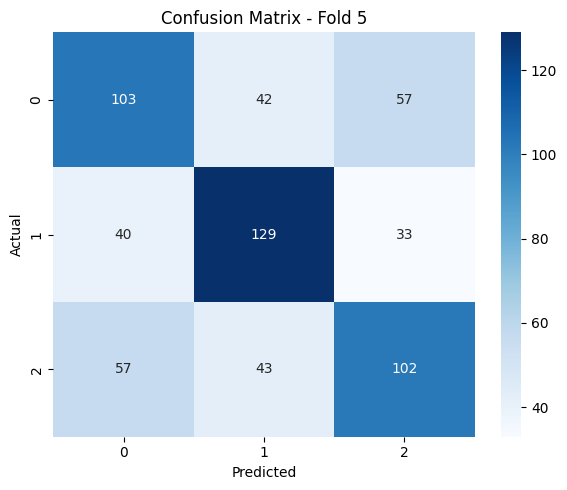


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.4917
              precision    recall  f1-score   support

           0       0.47      0.50      0.48       202
           1       0.54      0.55      0.55       202
           2       0.46      0.42      0.44       202

    accuracy                           0.49       606
   macro avg       0.49      0.49      0.49       606
weighted avg       0.49      0.49      0.49       606



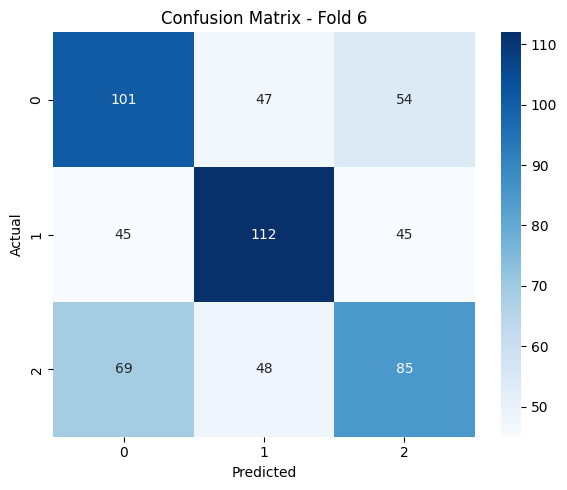


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5462
              precision    recall  f1-score   support

           0       0.51      0.49      0.50       202
           1       0.58      0.64      0.61       202
           2       0.54      0.51      0.53       202

    accuracy                           0.55       606
   macro avg       0.54      0.55      0.54       606
weighted avg       0.54      0.55      0.54       606



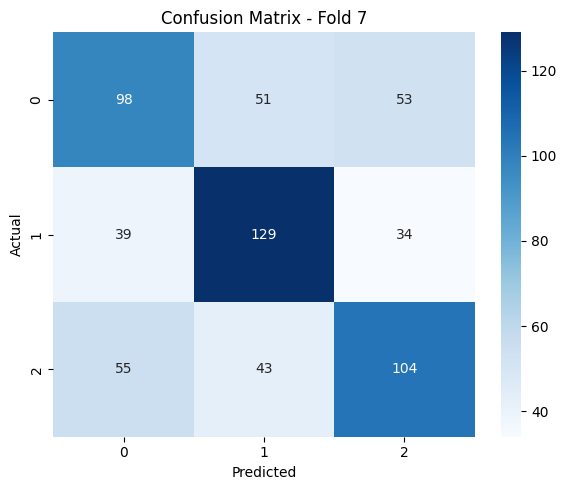


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5743
              precision    recall  f1-score   support

           0       0.54      0.62      0.58       202
           1       0.59      0.58      0.58       202
           2       0.60      0.52      0.56       202

    accuracy                           0.57       606
   macro avg       0.58      0.57      0.57       606
weighted avg       0.58      0.57      0.57       606



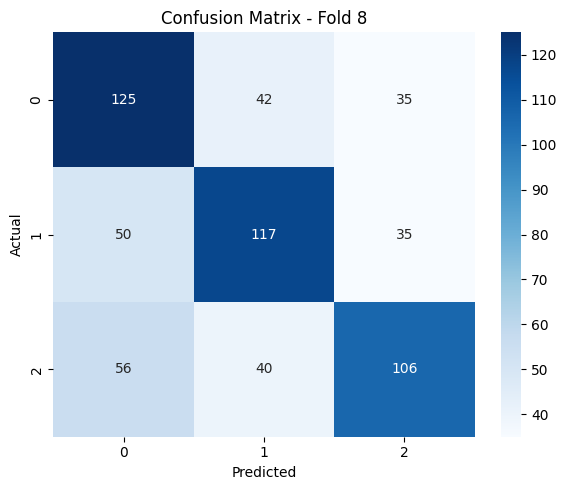


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5413
              precision    recall  f1-score   support

           0       0.46      0.49      0.47       202
           1       0.58      0.61      0.60       202
           2       0.59      0.52      0.55       202

    accuracy                           0.54       606
   macro avg       0.54      0.54      0.54       606
weighted avg       0.54      0.54      0.54       606



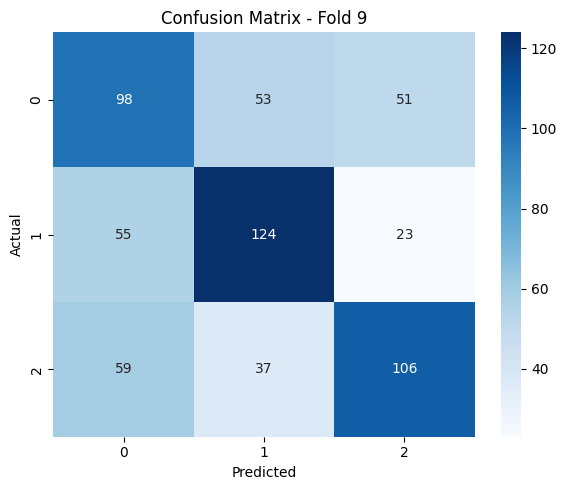


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.5693
              precision    recall  f1-score   support

           0       0.53      0.62      0.57       202
           1       0.60      0.56      0.58       202
           2       0.58      0.53      0.56       202

    accuracy                           0.57       606
   macro avg       0.57      0.57      0.57       606
weighted avg       0.57      0.57      0.57       606



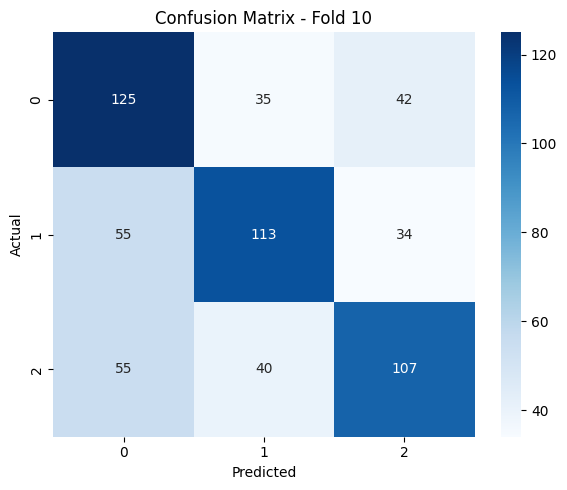


 Average Accuracy: 0.5446


In [ ]:
 # Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 2), tokenizer = spacy_tokenizer_only_stopwords) # multigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "logistic"
my_f_ext_name = 'tfidf'

log_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)


In [ ]:
explain_pipeline(log_pipeline)

Text 1: Mr President, as second Vice-President of the Joint Committee with Slovakia I regard myself as a friend of Slovakia and the Slovak people. I had hoped, in the deliberations that Mr Bösch referred to within the JPC, that across our political divisions we would be able to temper some of the toughness of the strictures directed by the EU towards Slovakia. I am happy to repeat today that I still look forward to Slovakia joining the EU at the earliest possible opportunity.The Slovak government must show that it is truly committed to a pluralist democracy. The failure to elect a President to succeed Mr Kovác is a clear signal that the government of Slovakia seems determined to ignore our genuine worries. The people of Slovakia have every right to choose their own government. Elections are due there in the autumn and I think it is the clause in this urgency that deals with those parliamentary elections that is the most critical. Those elections must be genuinely free and fair. Should 

Text 2: Mr President, although it would have been better if we had voted at lunchtime, I am happy to go ahead now.
True Label: 0
Predicted Label: 2


Text 3: . Mr President, I am rather disappointed that the Commissioner responsible, Commissioner Bjerregaard, is not here. It is rather disappointing that the Member of the Commission responsible for this issue is not here and that someone else is here who is not responsible for this portfolio. It makes a laughing-stock of the debates in this Parliament.Marine pollution, accidental and deliberate, is one of the major threats to the marine environment of Western Europe. This region represents one of the most intensively industrialised areas of the world where chemical, radioactive and hydrocarbon materials are routinely discharged into the marine environment and carried by cargo ships. The region also contains one of the highest concentrations of shipping and includes several of the busiest shipping lanes in the world. There are several tragic examples of accidental pollution from tankers and from other ships carrying various forms of dangerous cargoes. More by good fortune than by good

Text 4: Madam President, I should like to congratulate the Council and the Commission on the progress made at Tampere in so many areas and I would like to associate myself with the remarks made earlier by my Liberal Democrat colleague Baroness Ludford.In the short time I have available I would like to touch on two issues. The first is the position of non-nationals, the many millions of our fellow human beings not citizens of the Union but either legally resident here or being offered asylum. I welcome some of the progress that was made at Tampere: for instance, on giving them comparable rights and on the fight against racism and xenophobia. If we are talking about creating an area of freedom, security and justice, however, we must recognise that these are the people to whom justice is most regularly denied. They are still too often associated with criminals. Racist urban youths are a social embarrassment but racist policemen are a major social hazard.I welcome legal aid and greater inf

Text 5: . I welcome this report and the rapporteur's recognition of the importance of a more effective communication strategy.I am pleased to see the Commission recognising the need to improve communication with citizens and agree with the rapporteur that it is vital Europe be bought closer to its citizens. This is particularly pertinent in light of the continued decline in European Parliament election turn-outs, reaching a record low of 45.7% in 2004.A more effective Communication strategy will do much to counter the Euro-myths propagated throughout the EU.
True Label: 2
Predicted Label: 2


Text 6: Madam President, it might help the dignity of the House if the Member nearby could explain what happened. We are entitled to more than an attempt at a three-card trick.
True Label: 0
Predicted Label: 2


Text 7: . I welcome this resolution, which, in preparation for the World Cup, attempts to put a stop to the dramatic increase in the demand for sexual services by protecting trafficked women who are the victims of organised crime.The resolution stresses the need for an integrated Europe-wide campaign and therefore calls on Member States to launch and promote the ‘Red card’ campaign in close cooperation with NGOs, the police, law enforcement agencies, churches and medical services.As well as seeking to inform the general public, the resolution calls on the International Olympic Committee and sports associations, including FIFA, UEFA, the German Football Association and others, as well as sportsmen and sportswomen, to support the ‘Red card’ campaign and roundly condemn trafficking in human beings and forced prostitution.
True Label: 2
Predicted Label: 2


Text 8: . The draft constitution was just not the way forward for Europe, so attempts to rehabilitate it are not welcomed. I would be the first to say that the EU needs a new way of working, and indeed a new constitution, but not the flawed text so comprehensively rejected by the voters of the Netherlands and France. We need to take the EU back to first principles and establish what it is for, where it adds value and where indeed it does not. Across the EU, the institutions and practices of the EU find little favour in the eyes of our electorate, and we cannot blame them, we must alter our ways of working. If the EU did not exist we would need to invent one, but not under the draft constitution and not in its current form.
True Label: 2
Predicted Label: 2


Text 9: Madam President, may I congratulate the Finnish presidency on this initiative in which I fully support him.I hope that at the end of the temporary conference all Member States will ratify the setting up of the International Criminal Court so that the war criminals who are so prevalent today throughout the world can be prosecuted. In July 1998, 83 countries agreed to the establishment of an international court at a conference sponsored by the United Nations in Rome. Only four countries to date have ratified the Rome Statute: Trinidad and Tobago, Senegal, San Marino and Italy.Above all, the International Criminal Court will encourage states to investigate and prosecute genocide, war crimes and crimes against humanity and will itself investigate and prosecute these crimes in certain circumstances. By addressing the issue of impunity and providing a fair forum for prosecutions, the court will help ease international tensions and promote peace and security, domestically and internat

Text 10: Mr President, you often come in for a lot of flak on these occasions and I think it is only right that on some occasions you should receive some compliments as well. I would ask you to pass on our thanks to all the services involved in moving us into our new offices in Brussels for the way this was carried out. There were some small difficulties but, on the whole, this massive undertaking was carried out with exceptional efficiency. Please pass this on to all concerned.
True Label: 2
Predicted Label: 2


Text 11: Mr President, I welcome both Commissioner Patten's contribution to this debate and Kofi Annan's decision to send a fact-finding team to ascertain exactly what happened during the Israeli bombardment of Jenin refugee camp. I am, however, somewhat concerned at the motivation underlying attempts by Israel to delay the investigation.Israel claims that its invasion of Jenin and other areas was an attempt to destroy the Palestinian terrorist infrastructure. However, serious allegations have been made that the Israeli defence forces were involved in extra-judicial executions and the use of human shields. If these prove to be true, then Israel itself and its army are as guilty of acts of terrorism as those who plan, support and carry out suicide bombings.When he was defence Minister, Ariel Sharon masterminded the 'Operation Peace for Galilee? invasion in 1982. His objective then he claimed was: 'to eradicate the Palestinian terrorist threat in Lebanon?. This resulted in the massacre o

Text 12: in writing. - I voted for this report, which is a simple piece of housekeeping updating the existing agreement to take into account the accession of Bulgaria and Romania. The proposal has no impact on the EU budget and is uncontroversial.
True Label: 2
Predicted Label: 2


Text 13: Madam President, it is excellent that we are dealing with this European health card on a first reading. We should bear in mind, as the Commissioner has pointed out, that it has taken two and a half years to get to this point through negotiations with five presidencies. Nevertheless, this is a tangible reality for citizens of Europe. It is a tangible way of bringing Europe closer to the citizens and I would support the view that this card should, in fact, have a European logo and should be very clearly identified as a European benefit for citizens.The forms that it is replacing – E111, E128, E110, and E119 – sound more like food additives than health passports, but I am pleased that this card will now replace those in good time.We also need to insist – rather than simply recommending – that Member States ensure people know that this card is available, that they know how to apply for it, how it can be used and what their rights will be.
True Label: 1
Predicted Label: 2


Text 14: May I point out that the Moscow mechanism is not for the Council to use, it is for the OSCE to use. I am answering questions here as President-in-Office of the European Union Council of Ministers. Can I say that the European Union recognizes the need for further improvements and progress in the implementation of human rights and democratic freedoms in Turkey. We have continued to make it clear to the Turkish authorities that observance of the rule of law and basic liberties is the basis of continued rapprochement between the European Union and Turkey. We note the assurances given by the Turkish authorities that they intend to pursue the process of constitutional and legislative reform, and we are continuing to press them to go down that road.The President-in-Office of the Council has had three meetings with the Deputy Prime Minister, Mrs Çiller, to stress the importance we attach to early progress in the adoption and implementation of the further reforms necessary to ensure re

Text 15: Mr President, I would like to congratulate the Swedish presidency on its success and also express my regret that the Irish referendum result overshadowed many of their achievements, particularly in the field of enlargement.The European Council in Göteborg was generous in response to our predicament and I welcome its willingness to help the Irish Government find a way forward. I regret that it is not going to be easy. With a little more effort by the political establishment in Ireland, a 'yes' vote could easily have been obtained but now that the referendum has taken place, many people, including supporters of the Nice Treaty, will be reluctant to overturn it. It also must be said that the recent remarks of Mr Prodi in the Irish media to the effect that enlargement can proceed even if Nice is not ratified, unfortunately adds to the confusion.However, my major concern arises because of the existence of a strong eurosceptic core at the heart of the Irish government. While the Tao

Text 16: Mr President, there have been times in recent months when I have felt that we are conducting politics through the looking-glass, where all the norms are reversed and black has become white, so I think it is quite useful for us to get back to basics.First of all, the United States of America is a democratic country which twice in the last century was prepared to lay down the lives of its citizens to defend peace, freedom and democracy in Europe. Iraq is a country ruled by a dictatorship, where there is neither freedom nor democracy, and whose leaders murdered hundreds of thousands of its own citizens and is known to be a threat to peace and stability in the region. It is not the other way round.It is also worth remembering exactly what resolution 1441 actually says. Paragraph 1 states that Iraq is in material breach of its obligations under UN resolutions. Paragraph 4 states that false statements or omissions in the declarations submitted by Iraq shall constitute a further mate

Text 17: . The reform of the CFP contained a proposal to set up RACs, and British Conservative MEPs today voted to support that proposal. We nevertheless believe that the EC has already relegated these bodies to the sidelines in respect of fisheries management by starving them of adequate funding and insisting that their role be purely 'advisory'. We fear that meaningful stakeholder involvement will therefore be restricted to the role of mere 'talking shops', with Brussels continuing to take all the management decisions. This is not good enough, and cannot resolve the problems which have resulted in the failure of the CFP. Thus, although we regard the creation of RACs as a tiny step in the right direction, we remain resolute in our view that UK withdrawal from the CFP, returning management to local and national control, remains the only real way to safeguard the future of the UK fisheries sector and fish stocks.
True Label: 0
Predicted Label: 2


Text 18: As the record will show, I have answered those questions unequivocally and properly. I reject any suggestion that I have not done so. I am sure the honourable Member who placed the question heard me quite clearly say how much I wanted to see the IRA cease-fire restored, how much I condemn the IRA activity, and that I did share with him and welcomed the Loyalist cease-fire. Perhaps if Members listened to the debate they might contribute more light than heat. This is a very important and delicate situation and one to which we should all do our best to contribute a solution, not to be seen simply to utter words, but to make a contribution to solving the problem. It is a very complex problem. I am probably the only Member here present who has studied Irish politics at Queens University in Belfast and who has been a practising politician for 17 years now on the island of Ireland. I am sure the honourable Member from Northern Ireland who placed this question heard me unequivocally a

Text 19: I should like to ask a follow-up question. I am grateful to the Commissioner for his reply and I hear him say that he wishes to take time to produce further analysis and to take the wind out of the sails of any potential opponent. I applaud any such effort. Unfortunately, what appears to have happened just now is that the wind has been taken out of the sails of the whole reform which has become becalmed.We are now in a position where we hope that we do not see the timetable derailed to the point where we may go beyond the end of this year and find ourselves in 2003 when some important derogations will have expired and we could potentially have a "free-for-all" in our fisheries throughout the EU. That would not benefit any of us and would not benefit fish stocks, which are nearing collapse.We have waited for this reform package for years. Our fishermen are suffering. Can we have a guarantee - and I am sure the Commission can give us this - that it retains its absolute independe

Text 20: Mr President, I welcome the prospect of Croatia's accession, not only in itself, but also, as Commissioner Verheugen said, as a practical demonstration of the EU's commitment to the eventual accession of other Balkan countries.I should like to ask the Commissioner whether he has received assurances from Croatia that it will help other countries in the region qualify for EU membership. I note in Commissioner Patten's report on the assessment by Carla Del Ponte that Croatia is complying in full with ICTY and doing all it can to find General Gotovina. Until recently we could not be sure that such efforts were genuinely being made. Is it the understanding of the Commissioner that the UK and the Netherlands will now ratify the Stabilisation and Association Agreement?The UK Minister for Europe has now declared himself convinced of the efforts to find General Gotovina. Previously this was not the case and he pointed out, for instance, that General Gotovina's lawyer knew how to find h

## LogREgression TFIDF ngrams - NO STOPWORDS


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6320
              precision    recall  f1-score   support

           0       0.57      0.61      0.59       202
           1       0.65      0.76      0.70       202
           2       0.70      0.53      0.60       202

    accuracy                           0.63       606
   macro avg       0.64      0.63      0.63       606
weighted avg       0.64      0.63      0.63       606



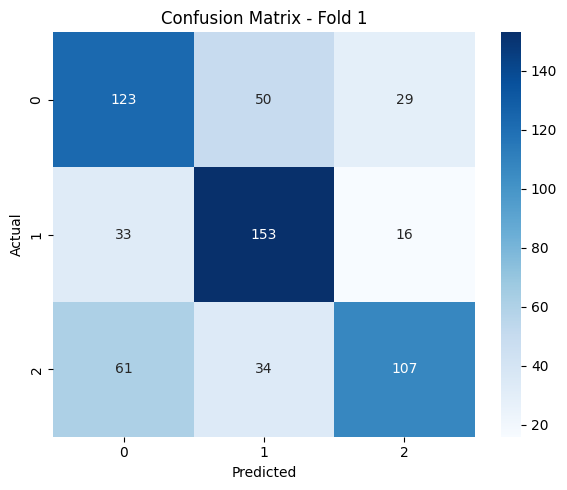


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6485
              precision    recall  f1-score   support

           0       0.59      0.69      0.64       202
           1       0.67      0.71      0.69       202
           2       0.71      0.54      0.62       202

    accuracy                           0.65       606
   macro avg       0.66      0.65      0.65       606
weighted avg       0.66      0.65      0.65       606



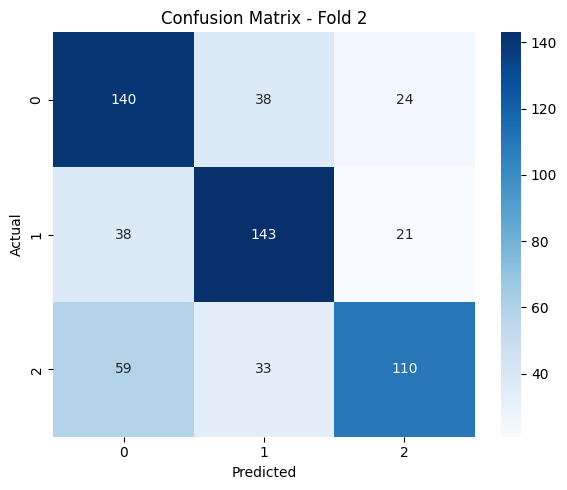


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6733
              precision    recall  f1-score   support

           0       0.63      0.72      0.67       202
           1       0.69      0.76      0.72       202
           2       0.71      0.54      0.61       202

    accuracy                           0.67       606
   macro avg       0.68      0.67      0.67       606
weighted avg       0.68      0.67      0.67       606



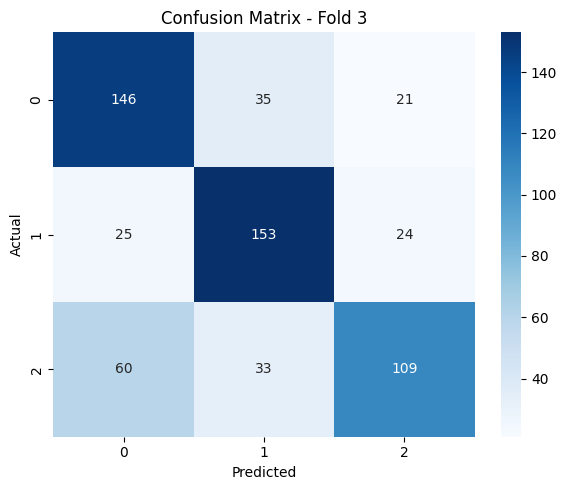


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6683
              precision    recall  f1-score   support

           0       0.62      0.68      0.65       202
           1       0.68      0.75      0.72       202
           2       0.71      0.57      0.64       202

    accuracy                           0.67       606
   macro avg       0.67      0.67      0.67       606
weighted avg       0.67      0.67      0.67       606



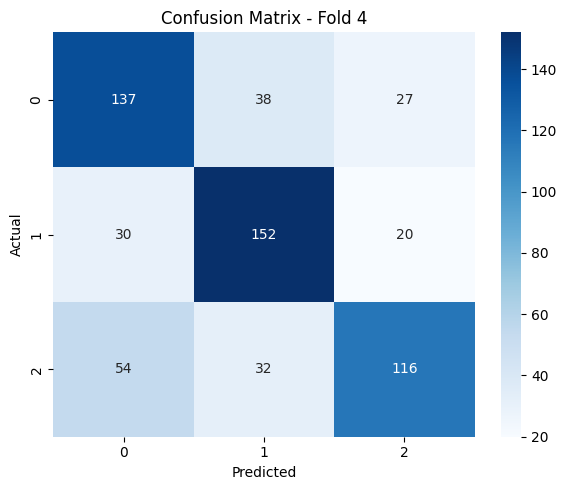


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6535
              precision    recall  f1-score   support

           0       0.59      0.70      0.64       202
           1       0.69      0.72      0.70       202
           2       0.70      0.54      0.61       202

    accuracy                           0.65       606
   macro avg       0.66      0.65      0.65       606
weighted avg       0.66      0.65      0.65       606



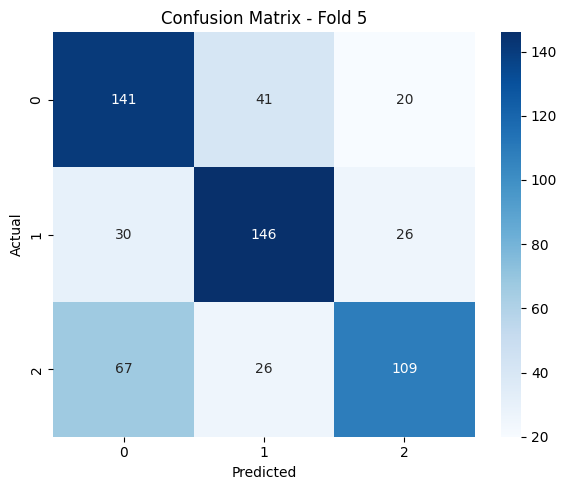


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6370
              precision    recall  f1-score   support

           0       0.56      0.67      0.61       202
           1       0.69      0.76      0.72       202
           2       0.70      0.49      0.57       202

    accuracy                           0.64       606
   macro avg       0.65      0.64      0.63       606
weighted avg       0.65      0.64      0.63       606



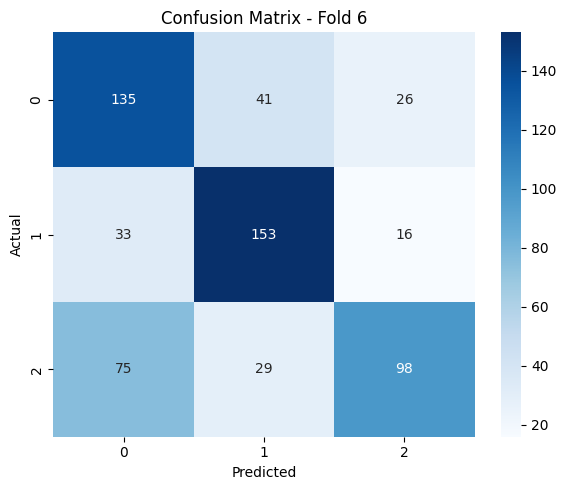


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6815
              precision    recall  f1-score   support

           0       0.63      0.71      0.67       202
           1       0.72      0.75      0.73       202
           2       0.70      0.59      0.64       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



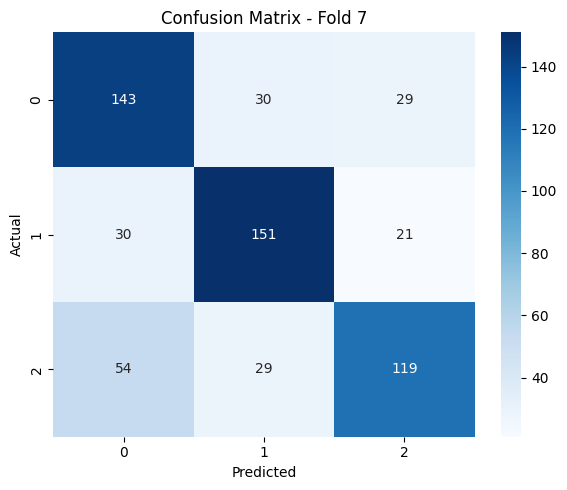


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6419
              precision    recall  f1-score   support

           0       0.56      0.66      0.60       202
           1       0.67      0.74      0.70       202
           2       0.74      0.52      0.61       202

    accuracy                           0.64       606
   macro avg       0.66      0.64      0.64       606
weighted avg       0.66      0.64      0.64       606



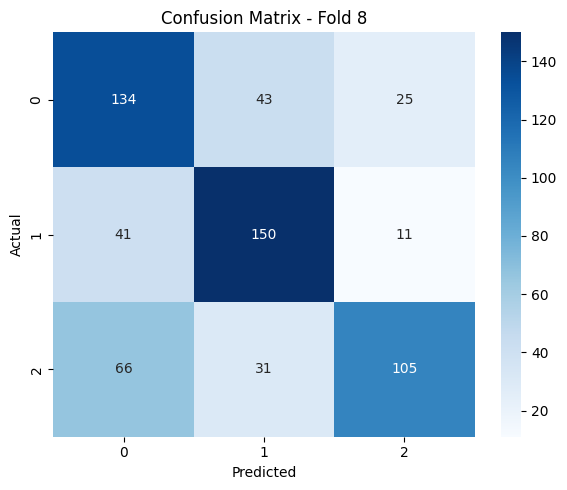


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6469
              precision    recall  f1-score   support

           0       0.57      0.61      0.59       202
           1       0.67      0.74      0.70       202
           2       0.71      0.59      0.65       202

    accuracy                           0.65       606
   macro avg       0.65      0.65      0.65       606
weighted avg       0.65      0.65      0.65       606



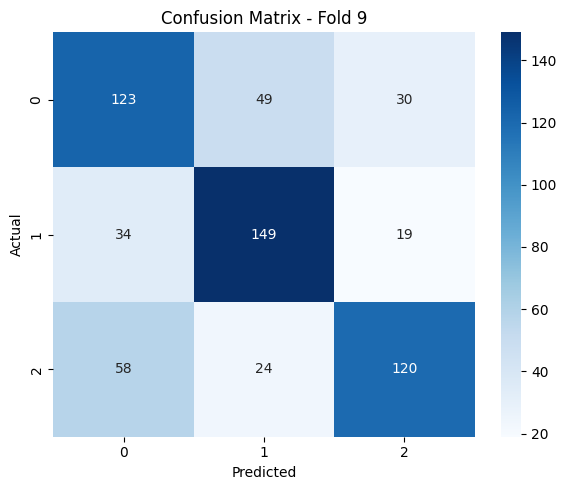


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


✅ Accuracy: 0.6568
              precision    recall  f1-score   support

           0       0.60      0.74      0.66       202
           1       0.68      0.70      0.69       202
           2       0.71      0.53      0.61       202

    accuracy                           0.66       606
   macro avg       0.66      0.66      0.65       606
weighted avg       0.66      0.66      0.65       606



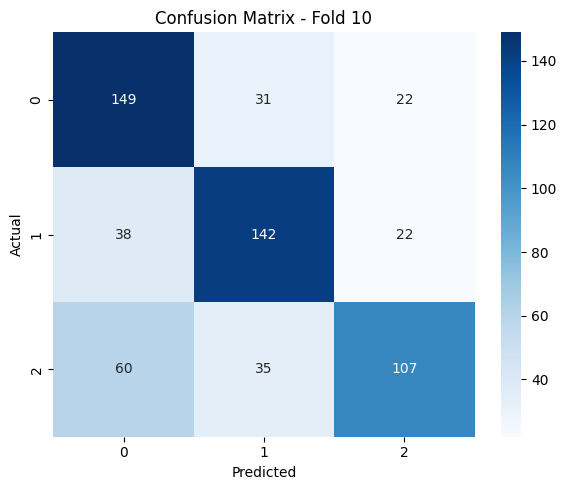


 Average Accuracy: 0.6540


In [ ]:
 # Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 2), tokenizer = spacy_tokenizer_without_stopwords) # multigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "logistic"
my_f_ext_name = 'tfidf'

log_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf, my_f_ext_name)


In [ ]:
explain_pipeline(log_pipeline)

Text 1: Mr President, the Commission's new-found awareness of its responsibility for long-term conservation of fish stocks is to be applauded and encouraged. However, due to the almost total failure of previous policies, I am of the opinion that control of fishing activities should be better returned to the elected governments of Member States with the return of control over their former national territorial waters.These proposals are unfairly weighted against United Kingdom fishermen with a reduction in tonnage of 29% compared to 20% for France, 12% for Spain and 2% for Greece. Fish stocks are a truly natural resource and should be renewable for all time. With regard to land-based food chains, we have to sow and breed as well as harvest and process. With fish, we merely hunt them down. We must not allow ourselves to fish selfishly or to hunt them down to extinction. It would be an act of cynicism for Member States to dilute these proposals further. We not only need friends of fishing;

Text 2: Mr President, I welcome the Commissioner to the House. On welfare, therapeutic and economic grounds, it is essential that European veterinarians have access to the fullest possible range of veterinary medicines to treat all food-producing animals, while at the same time keeping consumer health protection at the top of all our agendas.Requirements for the placing of veterinary medicinal products on the market have been harmonised since the early 1980s when Council Directive 81/851 was adopted. A series of availability problem have arisen, compromising animals health and welfare across species. There is a need for urgent short-term solutions as well as for a broad review of all the legislation involved. This is what the Commission proposes and I fully endorse it. No veterinary medicinal product can be used in food-producing animals unless maximum residue limits, MRLs, are set up for its active substances. A recent evaluation of the EU product licensing procedures observed, and I 

Text 3: Mr President, on behalf of the Green Party I welcome the report by Mrs Oomen-Ruijten. As Mrs Ojala said, it had a long history in the committee, an interesting history as well. I believe at one point the report was pulled from the committee because it was seen to be too pro-union and too pro-European. Just before the British election it was thought it might be a little embarrassing, particularly for our Labour colleagues, to actually have to vote in favour of this since Mr Blair was not known to favour the kind of trade union rights that Mrs Oomen-Ruijten speaks about in her report. Indeed he boasts that Britain has the most lightly regulated industry and toughly-regulated trade unions of all the European Union. The disappointment for us in Britain, of course, is that the new Trade Union Bill, which is before the British Parliament, does not restore the many rights which had been taken away from trade unions in the many years of Tory rule. So I welcome Mrs Oomen-Ruijten's repor

Text 4: Mr President, The World Education Forum in Dakar is a follow-up to the first conference of Education for All held in Thailand eleven years ago. There has been some progress but, unfortunately, not enough as yet.As we speak there are 125 million children in the world who do not go to school. There are 880 million illiterate adults, two-thirds of whom are girls and women. The Community is the largest donor to many of these countries. It is regrettable that we are not sending our highest official to attend that conference on behalf of the Community. We also regret that there has not yet been a communication on children's rights from the Commission.A prominent African leader made a very pertinent comment. He said that education is the only existing vaccination against AIDS. One of the main problems with providing education in many countries is the catastrophic effect AIDS is having on the lives not just of children, many of whom are orphans because they have lost one or both parent

Text 5: on behalf of the ALDE Group. - Mr President, Commissioner, the ALDE Group welcomes the fisheries partnership agreement with Greenland. We take this opportunity to repeat our thanks to the home rule government for the very fruitful discussions on this and other issues that a delegation from the group had with them when it visited Greenland last autumn. We are clear that the agreement is a matter of mutual benefit.However, we have serious concerns about one aspect of the regulation, namely Article 3(2). This would allow the Commission to reallocate licences between Member States in cases where fishing opportunities have not been fully taken up. We understand the Commission's wish to ensure full value for sums expended by the Community, but we do not believe that the same procedure can be used in the case of agreements where access to resources is based on vessels and tonnage.The Greenland agreement is based on the purchase of quota. It also differs from other agreements in allowi

Text 6: rapporteur. - Mr President, I hope colleagues will bear with me yet again taking the floor on a question of changes to the Rules of Procedure, which always seem to be on a Monday night.As colleagues will be aware, Parliament has had a working group very ably chaired by our colleague Dagmar Roth-Behrendt which has been looking into improving the workings of our Parliament.We have shifted from being a talking shop to a co-legislature. Whatever happens to the Lisbon Treaty, that change has already essentially taken place. It is therefore rational and logical that we should look at how we organise our work.One major aspect of that is inevitably and rightly a shift away from own-initiative reports from committees, with no legislative impact, to focussing more on legislation.That is the first and perhaps most important part of the package of proposals that I tabled before you today. The working group's proposals, of course, were wide-ranging: only a few of them require adjustment to 

Text 7: in writing. - In contrast to my Scottish Conservative and Scottish Liberal colleagues, I have supported this report which addresses a variety of possible financing sources including a Financial Transactions Tax. It also calls for a debate on the use of revenue which could come from a FTT.
True Label: 2
Predicted Label: 2


Text 8: Mr President, as someone who suffers from a neurological complaint, to wit Parkinson's disease, I am naturally biased in this matter, but I am a little shocked by the frequent use of terms like 'unacceptable' and 'dignity' applied to people who wish to find a solution through medical research to the terrible problems facing those who suffer from neurological disease, such as Alzheimer's, motor neurone and Parkinson's. There is no dignity in dying of motor neurone disease and there is precious little dignity in suffering from Parkinson's either. So I want to commend to the House the view of the sufferer as well as the view - if there is to be one - of the person who is concerned above all about preserving the embryo.If I thought that an embryo had the same human rights as a child or an adult human being, I would not, of course, not be in favour of anything that meant the destruction of human life. But the laws of our Member States by and large accept that there is a difference b

Text 9: Mr President, I rise to commend you for ensuring respect for the rules of the House, for showing the flexibility to meet the demands of our colleagues for a vote tomorrow morning and I move that we proceed forthwith to next business.
True Label: 2
Predicted Label: 2


Text 10: in writing. - I support this report which recognises that credit rating agencies lack accountability, competition and transparency, notably with regard to sovereign debt. More needs to be done at an EU and global level to ensure that reckless practices do not endanger the financial security of the EU.
True Label: 2
Predicted Label: 2


Text 11: Following on from the President-in-Office's two responses to my colleagues, Mr Hyland and Mr David Martin, I would like to ask whether you have any proposals with regard to more focused coordination between the regional funds and the rural development funds as a way of ensuring that people in rural areas who suffer because of a drop in income can gain off-farm income through job creation and so on?Would it be possible to see, through the presidency, whether this type of coordination will take place and would it be possible for the President-in-Office to come back to Parliament and present a proposed model of the type of integration which would take place, at the same time ensuring that there is no reduction in the commitment towards rural development, but also guaranteeing that all of the funding towards employment creation - which is so important for all of us here in Europe - is not just focused on urban areas.
True Label: 1
Predicted Label: 2


Text 12: This agreement is aimed at ensuring the traceability and certification of timber products from the Republic of Congo. These objectives are ostensibly praiseworthy, but they do not respond to the extent that we believe is necessary to the problem of forest destruction, and with it the threat to the integrity of resources of immense value from an ecological and conservation point of view, and which are vital to the existence and way of life of local communities and indigenous peoples. The concerns expressed by the rapporteur himself are enough to prove the weakness of the agreement, justifying our abstention. Specifically, the agreement does not, of itself, ensure that deforestation and the large-scale degradation of intact forests will be combated, and it may even promote them in the absence of additional or complementary measures, as it is aimed at encouraging the importing of timber products from the Republic of Congo to the EU. This may throw up obvious conflicts with the EU

Text 13: Madam President, I thank Mrs Müller for her contribution. I am glad she did not just put it in writing. As the Socialist coordinator let me say that the group will be supporting the report as it stands with the amendment from the Committee on Budgets which was voted on last night concerning the extra upgradings for the ad personams . Having said that, I have discharged my duty as the coordinator.As there are so few people here and whilst very few people are concerned about the debate, I shall concentrate on two points on which I will speak in a personal capacity. The first is on paragraph 1 where we mention the need for a Members' statute and an assistants' statute. Our group wants a Members' statute and an assistants' statute. I want a Members' statute. I am fed up with everybody thinking I am some sort of crook. I want the clarification to be such that my expenses are paid from Parliament, are audited, are accounted and that no one can point the finger at me.Because I have t

Text 14: Mr President, the last time we debated this, in answer to my question, the President-in-Office confirmed that agreements under Article 98(2) are compatible with the Rome Statute and indeed are foreseen in the Rome Statute. I am therefore slightly surprised at the negative text of the resolution we have before us and at some of the contributions to the debate, because the General Affairs Council surely produced a very good outcome - European solidarity was confirmed.It was a good example of how the common foreign and security policy works in bringing Member States together and it preserved the integrity of the International Criminal Court. So we should really be welcoming that agreement, particularly as it established the general principles governing any agreement to be signed, including the point made by colleagues that no agreement should be signed if it means that people will enjoy impunity. That is specifically ruled out.We must recognise the reality: the Americans need to 

Text 15: Mr President, I wish to notify the House that there is a mistake on the voting list as to where Amendment 24 splits. We wanted to split the text so as to delete the word ‘biotechnology’. So we end after ‘preventive healthcare’.
True Label: 0
Predicted Label: 2


Text 16: in writing. - I welcome the Commission's proposal, as it simplifies the existing regulatory framework and has the potential to encourage innovation in the textile and clothing sector, whilst allowing fibre users and consumers to benefit more readily from innovative products.
True Label: 2
Predicted Label: 2


Text 17: Mr President, European Liberal Democrats in this House hope that President Valéry Giscard d'Estaing will present to the Heads of State and Government a draft Constitutional Treaty which commands a broad consensus. It must dampen the fires of the increasingly bitter disputes we have witnessed in recent weeks. However, it is for the Convention, not its President, to confirm the existence or not of a consensus, and if the Convention needs a little more time to complete its work, so be it. Mr Giscard d'Estaing likes to say that his Constitution will last unchanged for 50 years, but unless a durable consensus is reflected in the final text and Member States are given the time to debate it we are likely to have to revisit the matter in the very near future.The latest proposals provide hope that the Praesidium is now in listening mode, but there is clearly still much listening to do. Even with the restrictions on his role in foreign policy, European Liberal Democrats remain unconvinc

Text 18: in writing. - I welcome this report agreeing to release EU funds to assist the victims of flooding in Ireland. Ireland applied for assistance from the European Solidarity Fund following heavy rain which led to severe flooding in November 2009. The flooding caused damage to the agricultural sector, residential properties, businesses and road networks and infrastructures. After evaluation of the application, the Commission has proposed to mobilise the EU Solidarity Fund for a total amount of EUR 13 022 500. It is worth noting that this is the first agreed proposal to mobilise funds in 2010 and the amount proposed will leave at least 98% of the European Solidarity Fund available for allocation in the rest of 2010.
True Label: 2
Predicted Label: 2


Text 19: Can I first of all congratulate my friend and colleague, Jim Nicholson, on his report. Technical measures to aid the recovery of cod stocks in the Irish Sea are of very great importance and they are of considerable consequence to fishermen in Scotland who are now desperately searching for ways to rejuvenate cod stocks in the North Sea. We are therefore studying the success of the measures taken in the Irish Sea with huge interest.Fish stocks, as you know, have collapsed in the North Sea, recently forcing the Commission to introduce emergency measures for the first time, when they closed 40 000 sq miles to cod fishing for 12 weeks, and to introduce emergency measures to protect northern hake stocks. Our once proud Scottish fleet, which landed 400 000 tonnes of cod per year in Scottish ports in 1970, is now limited by strict TACs and quotas to a mere 20 000 tonnes per year. The situation is no longer sustainable.The Commission Green Paper on reform of the CFP contains proposals,

Text 20: Mr President, I wish to begin with a point of order. I understand that there is now to be no debate on the Malliori report. Mrs Malliori's report has been parodied and attacked in some countries, including my own, and we are owed a small debate on it. I am sorry that is not possible, and I know Mrs Malliori will want to speak about this.I salute Mr Schnellhardt for his report and diligence. I agree with almost everything he says. On the margin, there are some areas - for example the attendance of veterinarians, fallen stock, etc. where there might be too much regulation. However, when it comes to the inspection of the premises where foodstuffs are being prepared, there must be independent examination. In my own country audits conducted by our Food Safety Authority have shown frequent evasions and omissions in terms of the way in which food is prepared, specific risk materials are dealt with and other matters are looked at. We are told that nowadays we can relate everything to 

### logistic regression tfidf unigrams


 Fold 1
✅ Accuracy: 0.6617
              precision    recall  f1-score   support

           0       0.60      0.66      0.63       202
           1       0.75      0.72      0.74       202
           2       0.64      0.60      0.62       202

    accuracy                           0.66       606
   macro avg       0.66      0.66      0.66       606
weighted avg       0.66      0.66      0.66       606



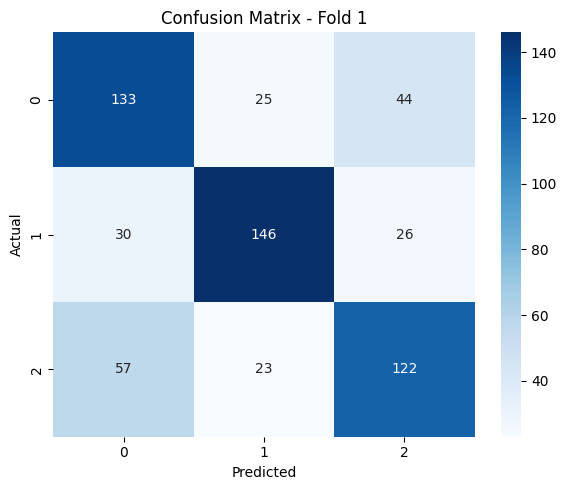


 Fold 2
✅ Accuracy: 0.6700
              precision    recall  f1-score   support

           0       0.59      0.66      0.62       202
           1       0.79      0.69      0.74       202
           2       0.65      0.65      0.65       202

    accuracy                           0.67       606
   macro avg       0.68      0.67      0.67       606
weighted avg       0.68      0.67      0.67       606



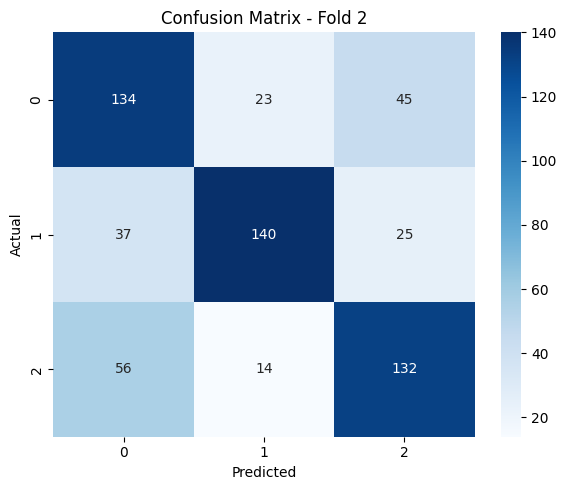


 Fold 3
✅ Accuracy: 0.7030
              precision    recall  f1-score   support

           0       0.68      0.72      0.70       202
           1       0.77      0.78      0.77       202
           2       0.66      0.61      0.64       202

    accuracy                           0.70       606
   macro avg       0.70      0.70      0.70       606
weighted avg       0.70      0.70      0.70       606



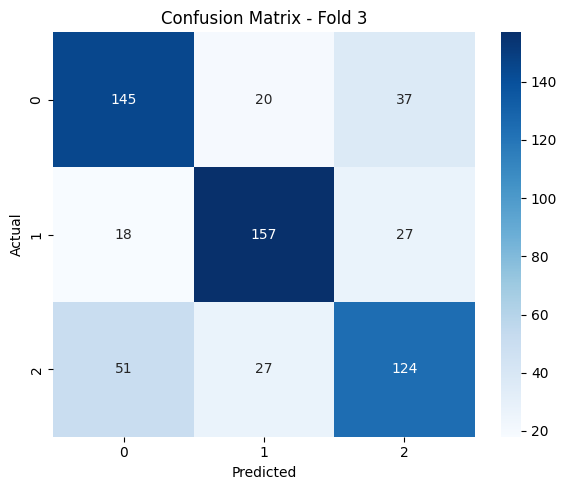


 Fold 4
✅ Accuracy: 0.6931
              precision    recall  f1-score   support

           0       0.67      0.69      0.68       202
           1       0.74      0.74      0.74       202
           2       0.67      0.64      0.66       202

    accuracy                           0.69       606
   macro avg       0.69      0.69      0.69       606
weighted avg       0.69      0.69      0.69       606



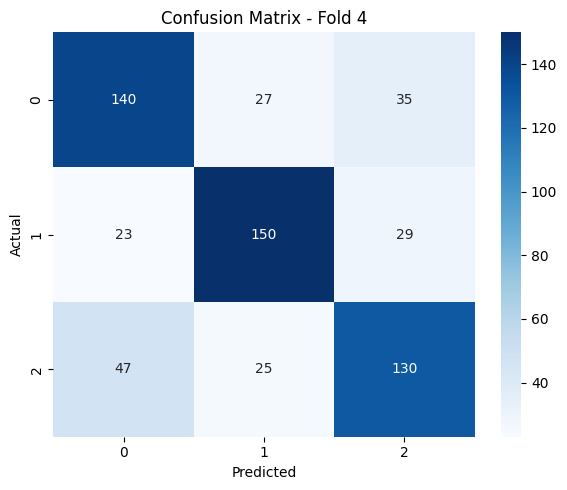


 Fold 5
✅ Accuracy: 0.6700
              precision    recall  f1-score   support

           0       0.63      0.68      0.65       202
           1       0.76      0.70      0.73       202
           2       0.63      0.63      0.63       202

    accuracy                           0.67       606
   macro avg       0.67      0.67      0.67       606
weighted avg       0.67      0.67      0.67       606



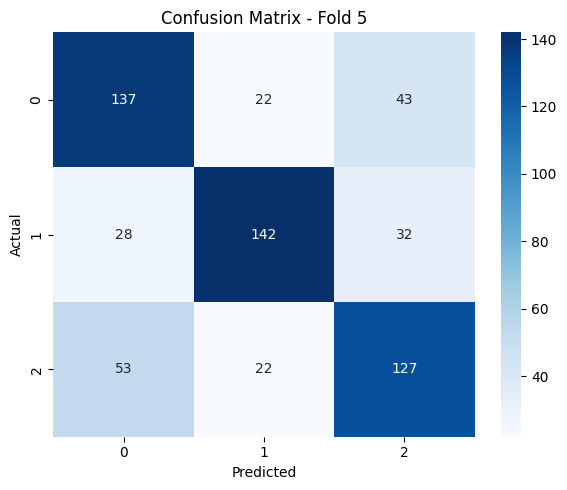


 Fold 6
✅ Accuracy: 0.6469
              precision    recall  f1-score   support

           0       0.57      0.64      0.60       202
           1       0.77      0.73      0.75       202
           2       0.61      0.56      0.59       202

    accuracy                           0.65       606
   macro avg       0.65      0.65      0.65       606
weighted avg       0.65      0.65      0.65       606



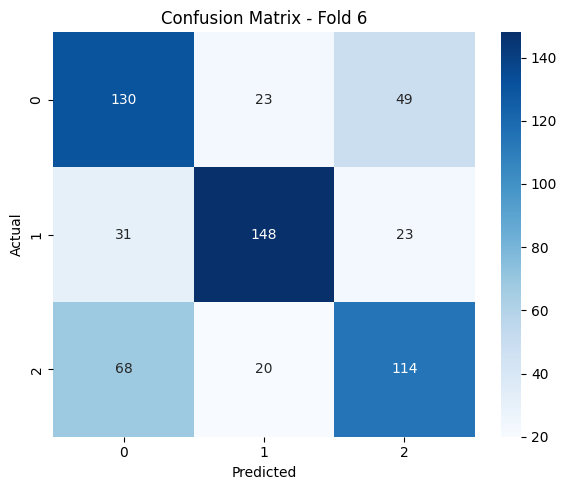


 Fold 7
✅ Accuracy: 0.6848
              precision    recall  f1-score   support

           0       0.64      0.66      0.65       202
           1       0.77      0.76      0.77       202
           2       0.65      0.64      0.64       202

    accuracy                           0.68       606
   macro avg       0.69      0.68      0.69       606
weighted avg       0.69      0.68      0.69       606



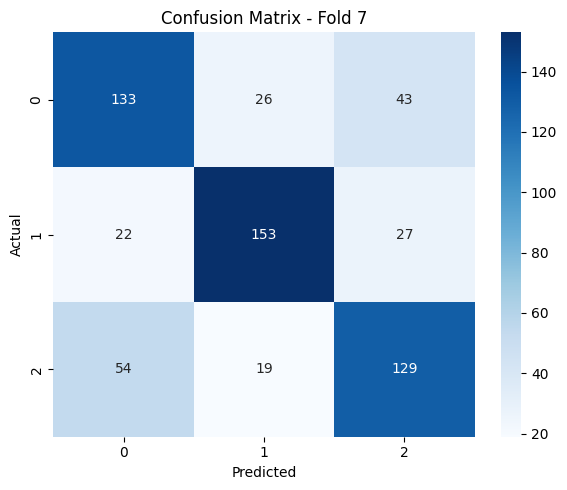


 Fold 8
✅ Accuracy: 0.6733
              precision    recall  f1-score   support

           0       0.60      0.70      0.65       202
           1       0.73      0.70      0.71       202
           2       0.71      0.62      0.66       202

    accuracy                           0.67       606
   macro avg       0.68      0.67      0.67       606
weighted avg       0.68      0.67      0.67       606



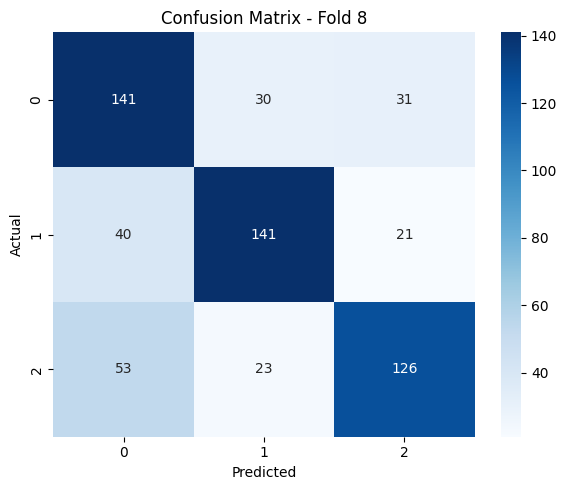


 Fold 9
✅ Accuracy: 0.6964
              precision    recall  f1-score   support

           0       0.62      0.64      0.63       202
           1       0.76      0.74      0.75       202
           2       0.71      0.70      0.71       202

    accuracy                           0.70       606
   macro avg       0.70      0.70      0.70       606
weighted avg       0.70      0.70      0.70       606



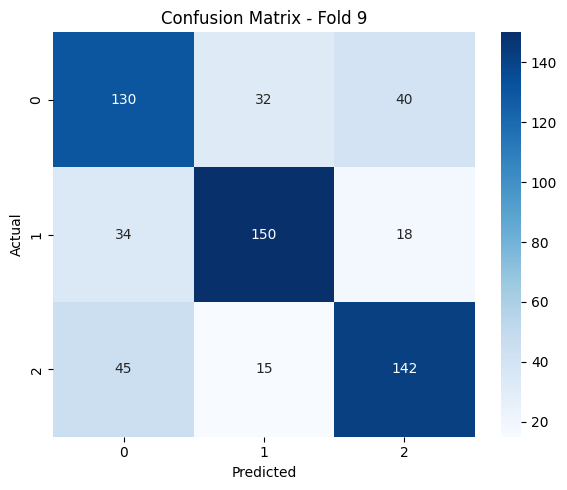


 Fold 10
✅ Accuracy: 0.6601
              precision    recall  f1-score   support

           0       0.59      0.70      0.64       202
           1       0.78      0.69      0.73       202
           2       0.63      0.59      0.61       202

    accuracy                           0.66       606
   macro avg       0.67      0.66      0.66       606
weighted avg       0.67      0.66      0.66       606



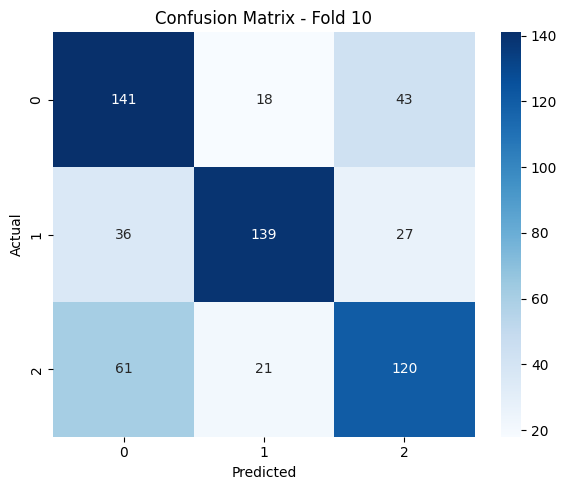


 Average Accuracy: 0.6759


In [ ]:
 # Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = TfidfVectorizer(ngram_range=(1, 1)) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "logistic"

log_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf)

### logistic regression count vect unigrams


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6617
              precision    recall  f1-score   support

           0       0.63      0.62      0.62       202
           1       0.72      0.71      0.71       202
           2       0.64      0.65      0.65       202

    accuracy                           0.66       606
   macro avg       0.66      0.66      0.66       606
weighted avg       0.66      0.66      0.66       606



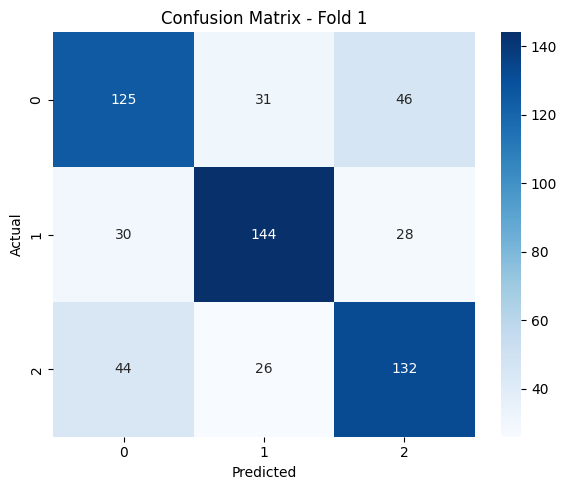


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6518
              precision    recall  f1-score   support

           0       0.60      0.58      0.59       202
           1       0.76      0.73      0.74       202
           2       0.60      0.65      0.63       202

    accuracy                           0.65       606
   macro avg       0.65      0.65      0.65       606
weighted avg       0.65      0.65      0.65       606



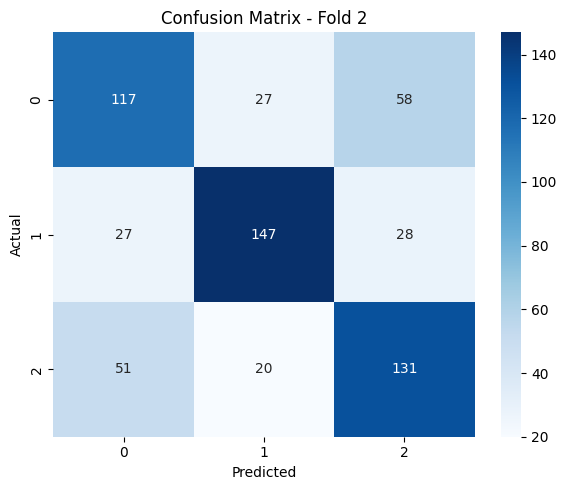


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6782
              precision    recall  f1-score   support

           0       0.68      0.63      0.65       202
           1       0.72      0.76      0.74       202
           2       0.64      0.65      0.64       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



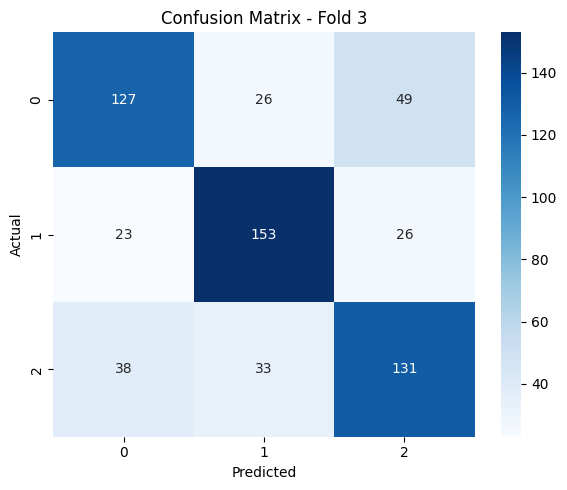


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6617
              precision    recall  f1-score   support

           0       0.63      0.57      0.60       202
           1       0.72      0.73      0.73       202
           2       0.63      0.68      0.66       202

    accuracy                           0.66       606
   macro avg       0.66      0.66      0.66       606
weighted avg       0.66      0.66      0.66       606



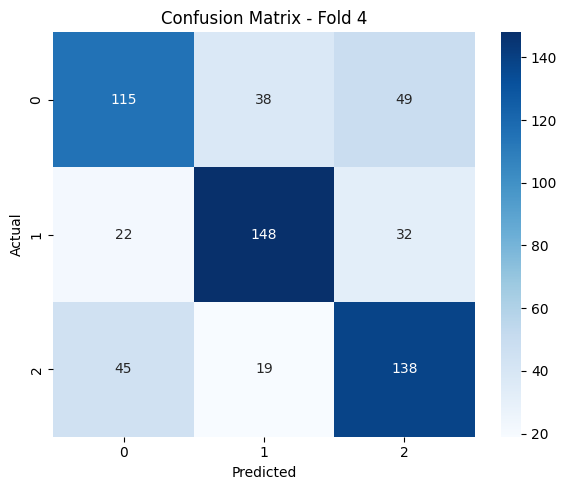


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6502
              precision    recall  f1-score   support

           0       0.61      0.64      0.62       202
           1       0.73      0.68      0.70       202
           2       0.62      0.63      0.63       202

    accuracy                           0.65       606
   macro avg       0.65      0.65      0.65       606
weighted avg       0.65      0.65      0.65       606



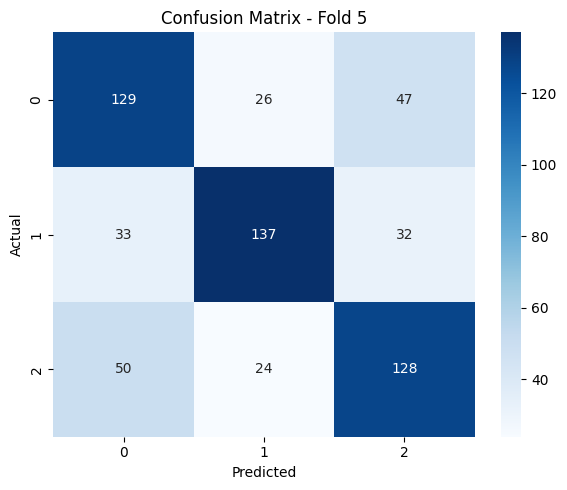


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6320
              precision    recall  f1-score   support

           0       0.56      0.59      0.58       202
           1       0.75      0.69      0.72       202
           2       0.60      0.61      0.61       202

    accuracy                           0.63       606
   macro avg       0.64      0.63      0.63       606
weighted avg       0.64      0.63      0.63       606



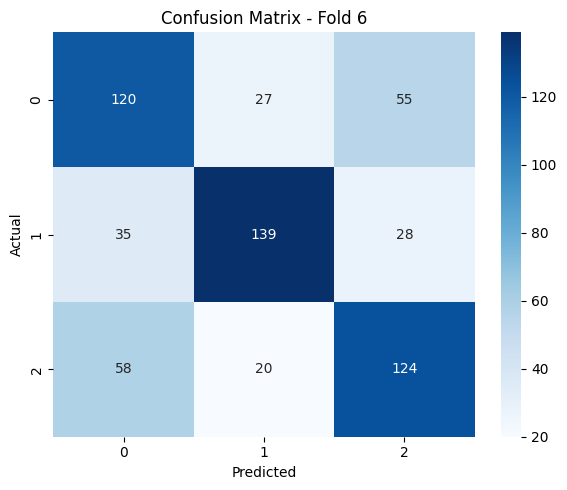


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6766
              precision    recall  f1-score   support

           0       0.65      0.63      0.64       202
           1       0.73      0.76      0.75       202
           2       0.64      0.63      0.64       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



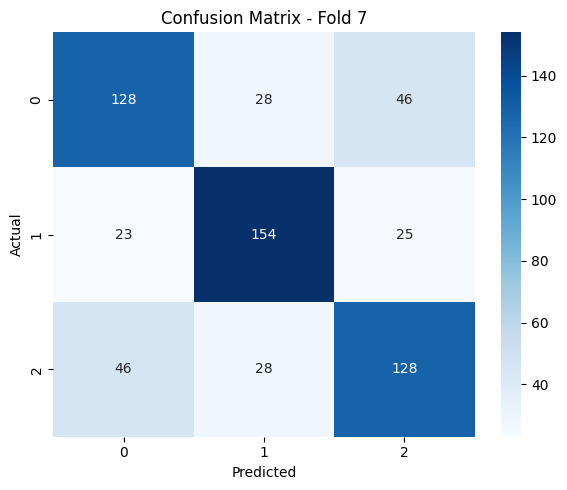


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6518
              precision    recall  f1-score   support

           0       0.59      0.63      0.61       202
           1       0.74      0.69      0.71       202
           2       0.64      0.63      0.64       202

    accuracy                           0.65       606
   macro avg       0.66      0.65      0.65       606
weighted avg       0.66      0.65      0.65       606



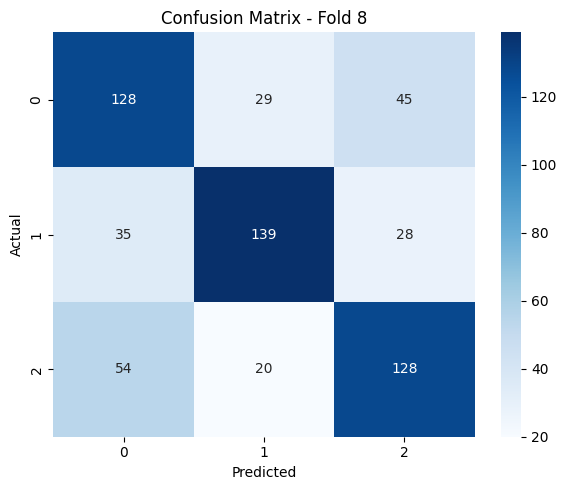


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.7030
              precision    recall  f1-score   support

           0       0.63      0.65      0.64       202
           1       0.75      0.76      0.75       202
           2       0.73      0.70      0.71       202

    accuracy                           0.70       606
   macro avg       0.70      0.70      0.70       606
weighted avg       0.70      0.70      0.70       606



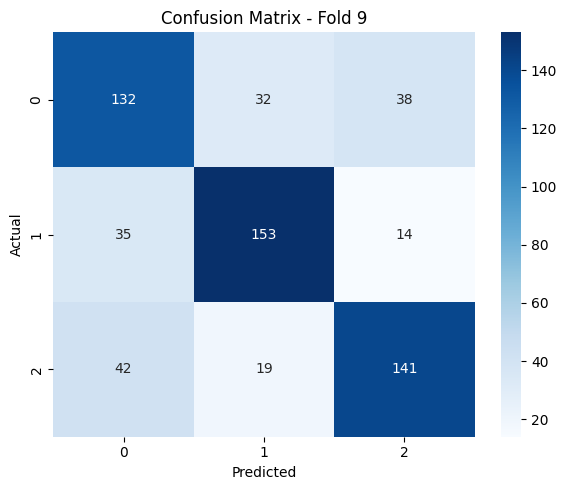


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6650
              precision    recall  f1-score   support

           0       0.63      0.61      0.62       202
           1       0.77      0.70      0.74       202
           2       0.61      0.68      0.64       202

    accuracy                           0.67       606
   macro avg       0.67      0.67      0.67       606
weighted avg       0.67      0.67      0.67       606



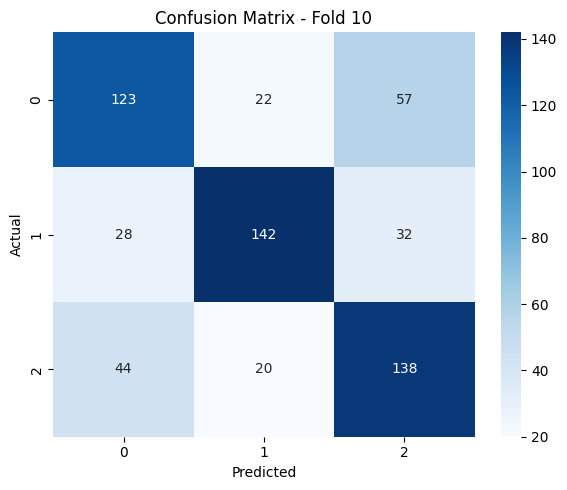


 Average Accuracy: 0.6632


In [ ]:
 # Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = CountVectorizer(ngram_range=(1, 1)) # unigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "logistic"

log_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf)

### logistic regression count vect multigrams


 Fold 1


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6469
              precision    recall  f1-score   support

           0       0.62      0.64      0.63       202
           1       0.72      0.66      0.69       202
           2       0.62      0.63      0.62       202

    accuracy                           0.65       606
   macro avg       0.65      0.65      0.65       606
weighted avg       0.65      0.65      0.65       606



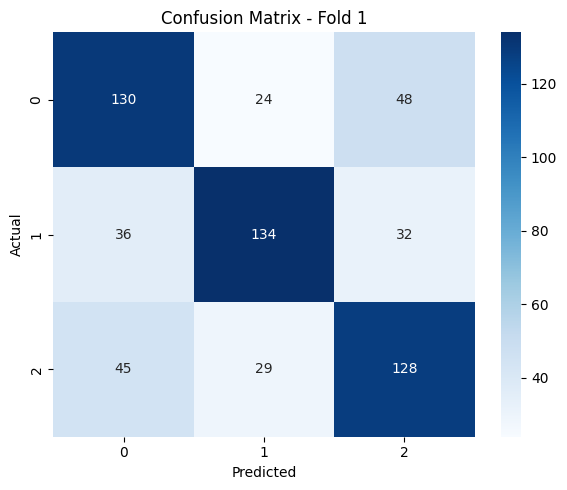


 Fold 2


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6749
              precision    recall  f1-score   support

           0       0.61      0.58      0.59       202
           1       0.81      0.74      0.78       202
           2       0.62      0.70      0.66       202

    accuracy                           0.67       606
   macro avg       0.68      0.67      0.68       606
weighted avg       0.68      0.67      0.68       606



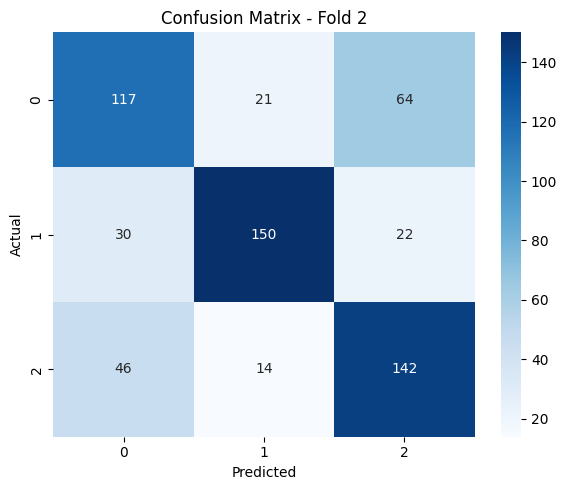


 Fold 3


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6964
              precision    recall  f1-score   support

           0       0.69      0.64      0.66       202
           1       0.74      0.77      0.76       202
           2       0.66      0.68      0.67       202

    accuracy                           0.70       606
   macro avg       0.70      0.70      0.70       606
weighted avg       0.70      0.70      0.70       606



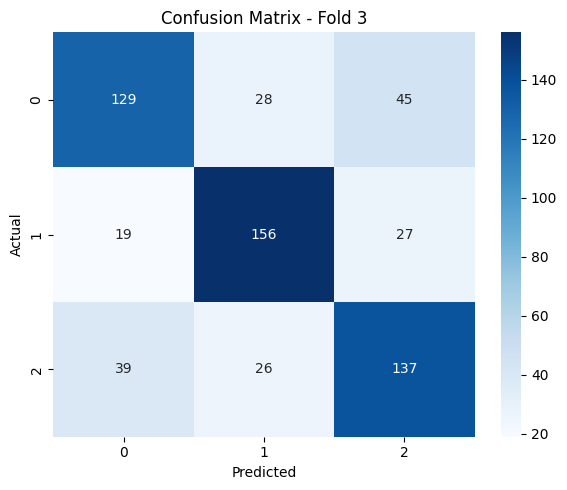


 Fold 4


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6551
              precision    recall  f1-score   support

           0       0.62      0.56      0.59       202
           1       0.72      0.72      0.72       202
           2       0.62      0.68      0.65       202

    accuracy                           0.66       606
   macro avg       0.65      0.66      0.65       606
weighted avg       0.65      0.66      0.65       606



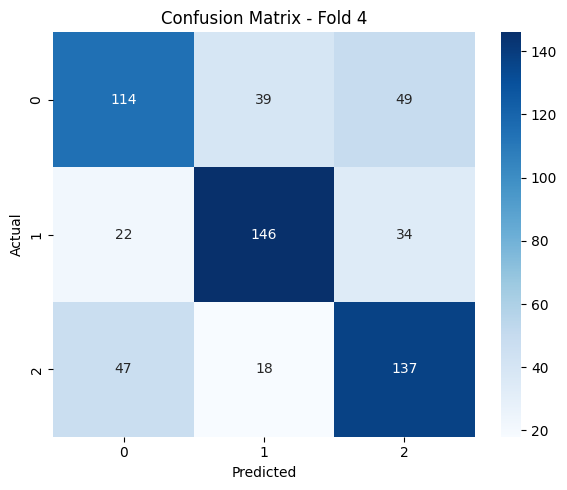


 Fold 5


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6568
              precision    recall  f1-score   support

           0       0.63      0.61      0.62       202
           1       0.74      0.71      0.73       202
           2       0.61      0.65      0.63       202

    accuracy                           0.66       606
   macro avg       0.66      0.66      0.66       606
weighted avg       0.66      0.66      0.66       606



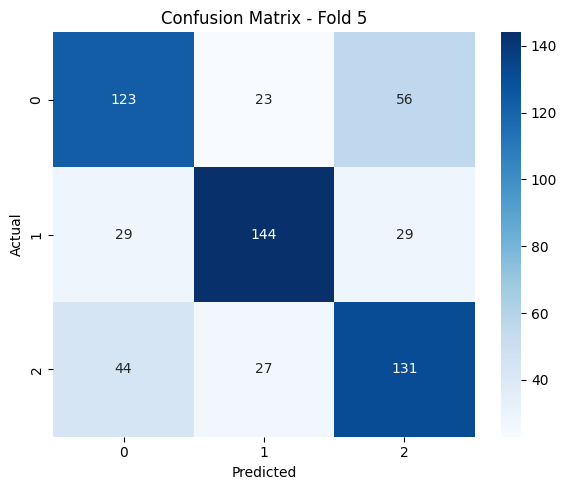


 Fold 6


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6436
              precision    recall  f1-score   support

           0       0.59      0.58      0.58       202
           1       0.75      0.71      0.73       202
           2       0.60      0.64      0.62       202

    accuracy                           0.64       606
   macro avg       0.65      0.64      0.64       606
weighted avg       0.65      0.64      0.64       606



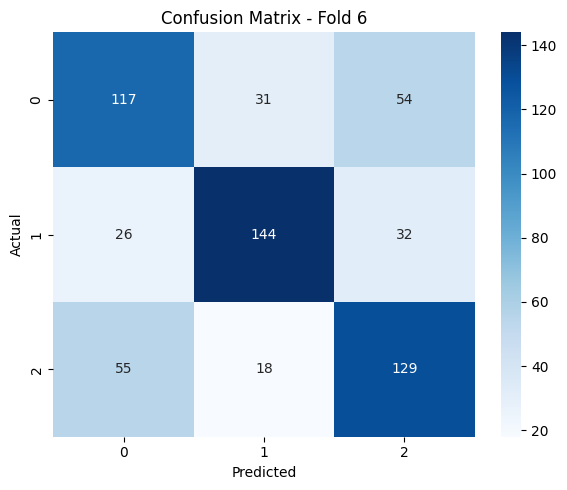


 Fold 7


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6848
              precision    recall  f1-score   support

           0       0.65      0.65      0.65       202
           1       0.80      0.74      0.77       202
           2       0.62      0.67      0.64       202

    accuracy                           0.68       606
   macro avg       0.69      0.68      0.69       606
weighted avg       0.69      0.68      0.69       606



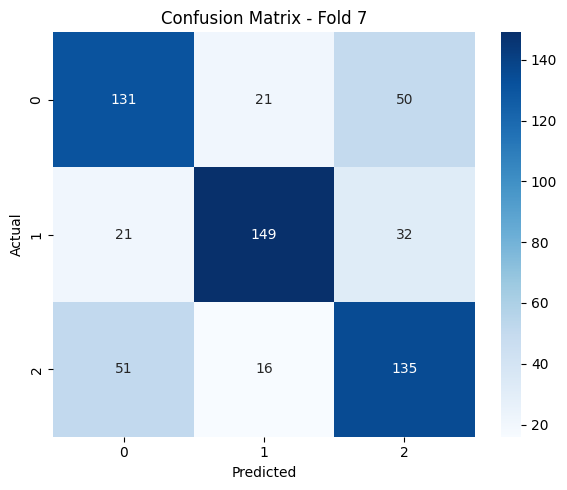


 Fold 8


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6617
              precision    recall  f1-score   support

           0       0.61      0.64      0.62       202
           1       0.72      0.70      0.71       202
           2       0.66      0.64      0.65       202

    accuracy                           0.66       606
   macro avg       0.66      0.66      0.66       606
weighted avg       0.66      0.66      0.66       606



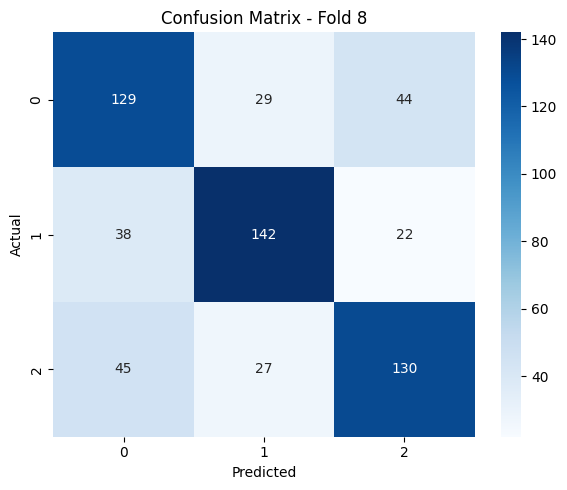


 Fold 9


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6782
              precision    recall  f1-score   support

           0       0.61      0.62      0.62       202
           1       0.77      0.73      0.75       202
           2       0.67      0.68      0.67       202

    accuracy                           0.68       606
   macro avg       0.68      0.68      0.68       606
weighted avg       0.68      0.68      0.68       606



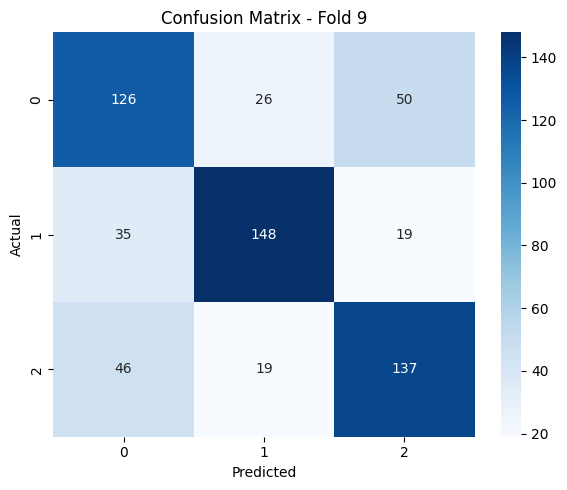


 Fold 10


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


✅ Accuracy: 0.6997
              precision    recall  f1-score   support

           0       0.66      0.67      0.67       202
           1       0.79      0.73      0.76       202
           2       0.66      0.70      0.68       202

    accuracy                           0.70       606
   macro avg       0.70      0.70      0.70       606
weighted avg       0.70      0.70      0.70       606



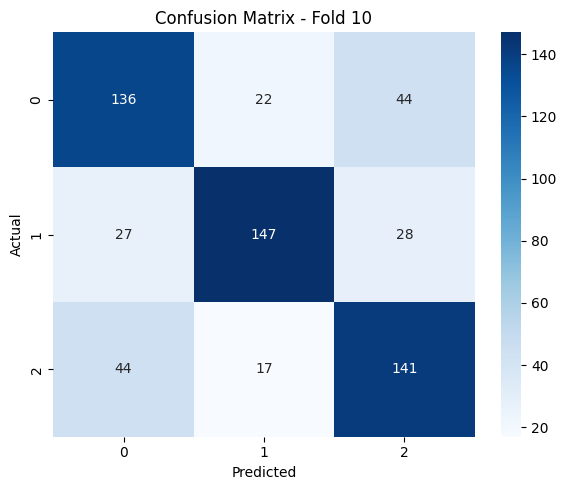


 Average Accuracy: 0.6698


In [ ]:
 # Define cross-validation strategy
kfold = StratifiedKFold(n_splits=NSPLITS, shuffle=True, random_state=42)

my_feature_extractor = CountVectorizer(ngram_range=(1, 3)) # multigrams
my_select = SelectKBest(chi2, k=10000) # top 10,000 features (adjustable)
my_clf =  "logistic"

log_pipeline = my_pipeline(kfold, X, y, my_feature_extractor, my_select, my_clf)

# Anaysis


In [ ]:
import eli5
from eli5.sklearn import explain_prediction

In [ ]:
def analyse_pipeline(pipeline):
  # Extract components
  vectorizer = pipeline.named_steps['tfidf']
  selector = pipeline.named_steps['select']
  clf = pipeline.named_steps['clf']

  # Feature names after selection
  selected_indices = selector.get_support(indices=True)
  feature_names = np.array(vectorizer.get_feature_names_out())[selected_indices]

  # Plot top features per class
  top_n = 20  # number of top features to plot

  for class_index, class_label in enumerate(clf.classes_):
      # Get top feature indices for this class
      top_feat_idx = np.argsort(clf.feature_log_prob_[class_index])[-top_n:]
      top_feat_names = feature_names[top_feat_idx]
      top_feat_scores = clf.feature_log_prob_[class_index][top_feat_idx]

      # Plot
      plt.figure(figsize=(8, 5))
      plt.barh(top_feat_names, top_feat_scores, color='skyblue')
      plt.xlabel('Log Probability')
      plt.title(f'Top {top_n} Features for Class "{class_label}"')
      plt.gca().invert_yaxis()  # top features on top
      plt.tight_layout()
      plt.show()


def analyse_pipeline_explain(pipeline):
  # Extract components
  vectorizer = pipeline.named_steps['tfidf']
  selector = pipeline.named_steps['select']
  clf = pipeline.named_steps['clf']

  # Feature names after selection
  selected_indices = selector.get_support(indices=True)
  feature_names = np.array(vectorizer.get_feature_names_out())[selected_indices]
  eli5.show_weights(clf, top=20, feature_names=feature_names.tolist(), target_names=clf.classes_)

In [ ]:
analyse_pipeline_explain(multinomial_pipeline)

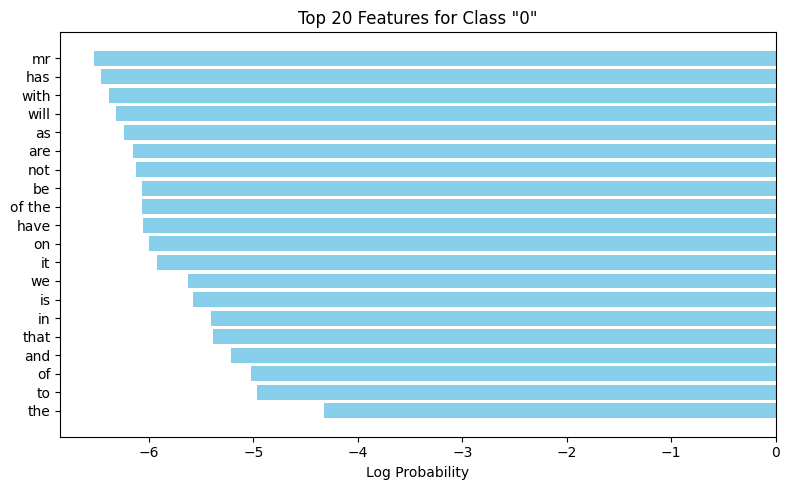

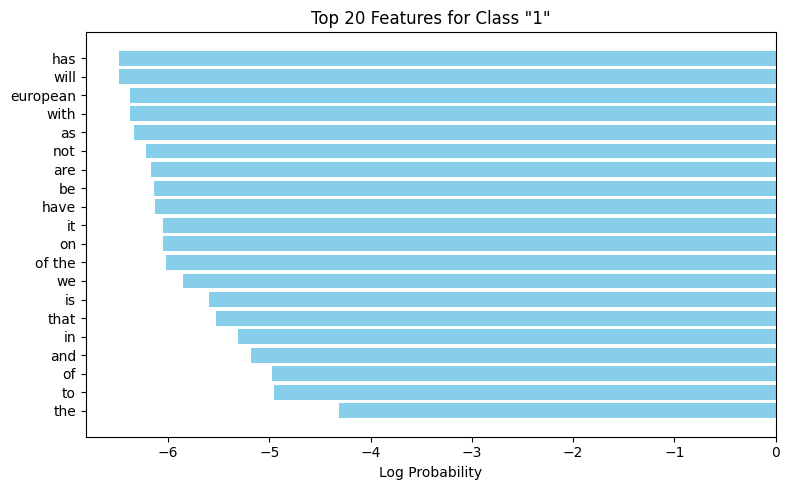

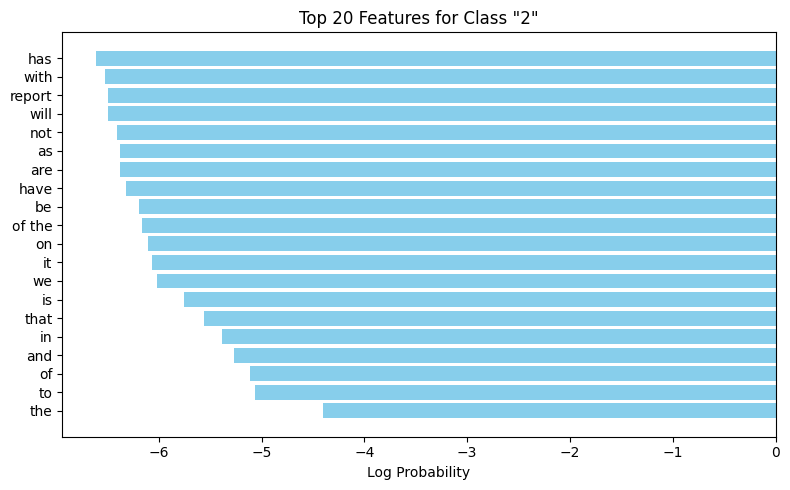

In [ ]:
analyse_pipeline(multinomial_pipeline)

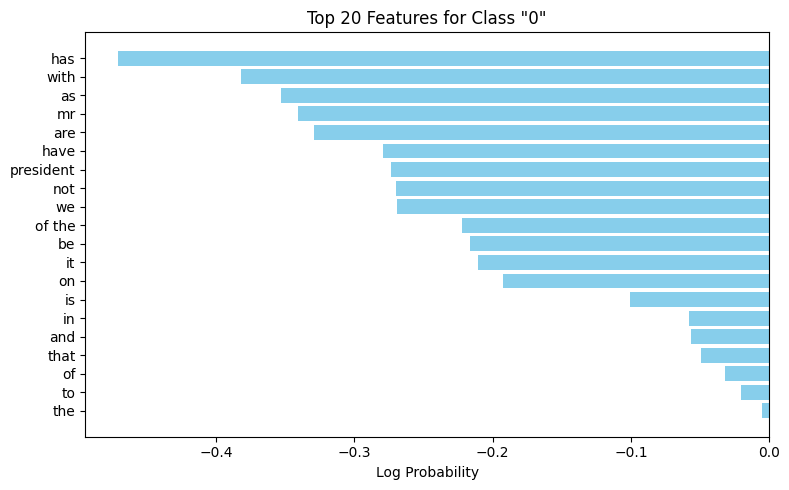

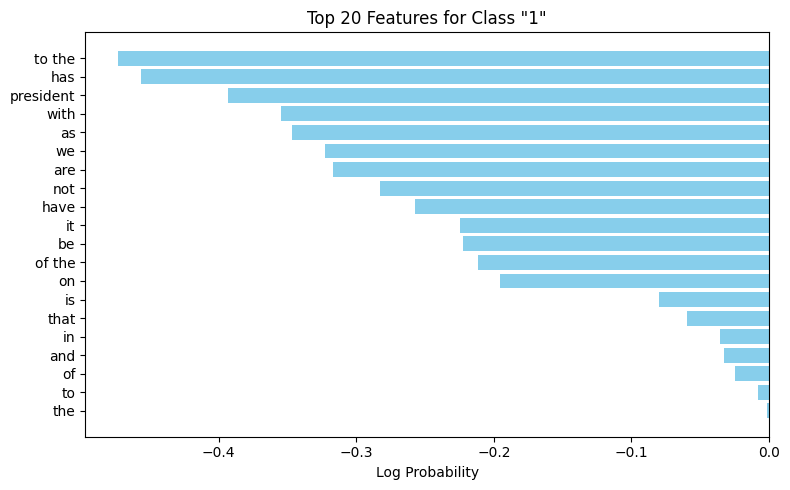

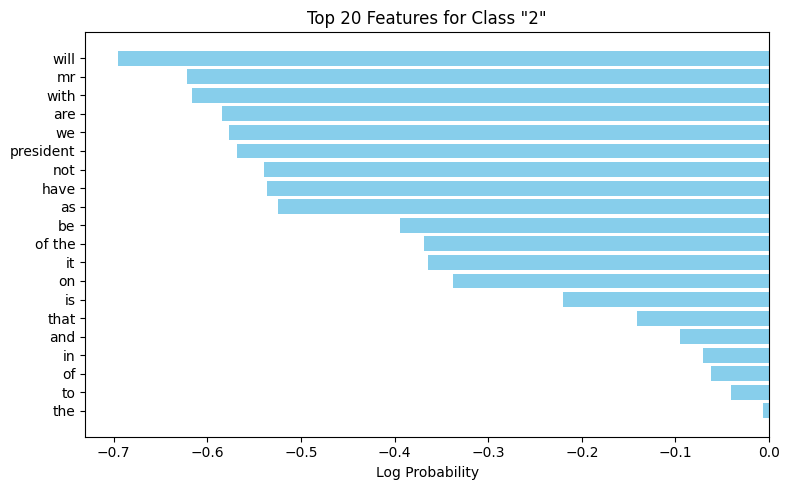

<IPython.core.display.HTML object>


In [ ]:
analyse_pipeline(bernoulli_pipeline)